# Libraries and Data Information

## Installations

### Mount Google Drive

In [ ]:
from google.colab import drive, files, runtime
drive.mount('/content/drive')

Mounted at /content/drive


### Check for Nvidia GPU.

In [ ]:
!nvidia-smi

/bin/bash: line 1: nvidia-smi: command not found


### Create Virtual Environment

In [ ]:
#!python -m venv /content/drive/My Drive/my_env  # Store in your Drive

### Activate Environment

In [ ]:
!source /content/drive/My Drive/my_env/bin/activate

/bin/bash: line 1: /content/drive/My: No such file or directory


## Install Packages.

In [ ]:
!pip install numpy  # Install or upgrade NumPy first
!pip install scipy==1.10.0 # Install scipy specifically version 1.10.0
!pip install scikit-learn  # Install scikit-learn
!pip install tensorflow  # Install TensorFlow
!pip install torch  # Install PyTorch

ERROR: Ignored the following yanked versions: 1.11.0, 1.14.0rc1
ERROR: Ignored the following versions that require a different python version: 1.10.0 Requires-Python <3.12,>=3.8; 1.10.0rc1 Requires-Python <3.12,>=3.8; 1.10.0rc2 Requires-Python <3.12,>=3.8; 1.10.1 Requires-Python <3.12,>=3.8; 1.6.2 Requires-Python >=3.7,<3.10; 1.6.3 Requires-Python >=3.7,<3.10; 1.7.0 Requires-Python >=3.7,<3.10; 1.7.1 Requires-Python >=3.7,<3.10; 1.7.2 Requires-Python >=3.7,<3.11; 1.7.3 Requires-Python >=3.7,<3.11; 1.8.0 Requires-Python >=3.8,<3.11; 1.8.0rc1 Requires-Python >=3.8,<3.11; 1.8.0rc2 Requires-Python >=3.8,<3.11; 1.8.0rc3 Requires-Python >=3.8,<3.11; 1.8.0rc4 Requires-Python >=3.8,<3.11; 1.8.1 Requires-Python >=3.8,<3.11; 1.9.0 Requires-Python >=3.8,<3.12; 1.9.0rc1 Requires-Python >=3.8,<3.12; 1.9.0rc2 Requires-Python >=3.8,<3.12; 1.9.0rc3 Requires-Python >=3.8,<3.12; 1.9.1 Requires-Python >=3.8,<3.12
ERROR: Could not find a version that satisfies the requirement scipy==1.10.0 (from versions:

In [ ]:
!pip install numpy  # Install NumPy first
!pip install numpy.rec # Install numpy.rec specifically.
!pip install scipy==1.10.0 # Reinstall SciPy with the version you need.
#!pip install keras_spiking --upgrade # Install keras_spiking
!pip install keras_spiking # Install keras_spiking

ERROR: Could not find a version that satisfies the requirement numpy.rec (from versions: none)
ERROR: No matching distribution found for numpy.rec
ERROR: Ignored the following yanked versions: 1.11.0, 1.14.0rc1
ERROR: Ignored the following versions that require a different python version: 1.10.0 Requires-Python <3.12,>=3.8; 1.10.0rc1 Requires-Python <3.12,>=3.8; 1.10.0rc2 Requires-Python <3.12,>=3.8; 1.10.1 Requires-Python <3.12,>=3.8; 1.6.2 Requires-Python >=3.7,<3.10; 1.6.3 Requires-Python >=3.7,<3.10; 1.7.0 Requires-Python >=3.7,<3.10; 1.7.1 Requires-Python >=3.7,<3.10; 1.7.2 Requires-Python >=3.7,<3.11; 1.7.3 Requires-Python >=3.7,<3.11; 1.8.0 Requires-Python >=3.8,<3.11; 1.8.0rc1 Requires-Python >=3.8,<3.11; 1.8.0rc2 Requires-Python >=3.8,<3.11; 1.8.0rc3 Requires-Python >=3.8,<3.11; 1.8.0rc4 Requires-Python >=3.8,<3.11; 1.8.1 Requires-Python >=3.8,<3.11; 1.9.0 Requires-Python >=3.8,<3.12; 1.9.0rc1 Requires-Python >=3.8,<3.12; 1.9.0rc2 Requires-Python >=3.8,<3.12; 1.9.0rc3 Requires

## Libraries

In [ ]:
#matplotlib imports
import matplotlib.pyplot as plt
import matplotlib.pyplot as scatter
import matplotlib.cm as cm
import time
import random


from sklearn.preprocessing import MinMaxScaler, StandardScaler, MaxAbsScaler
from sklearn.preprocessing import RobustScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.metrics import mean_absolute_percentage_error

# keras/tensorflow imports
import tensorflow as tf
from tensorflow.python.keras.engine.base_layer import Layer
import keras
#from tensorflow.python.keras.layers.rnn.rnn import RNN
from keras.layers import Dense, Dropout, SimpleRNN, LSTM, GRU, Flatten, Conv1D
from keras.layers import MaxPooling1D, TimeDistributed, GlobalAveragePooling1D
from keras.models import Sequential
import keras_spiking
from keras_spiking import SpikingActivation

# warnings imports
import warnings
warnings.filterwarnings("ignore")


# torch imports
import torch
import torch.nn as nn
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"{device}" " is available.")

# Other imports
from urllib.request import urlretrieve
import collections
import numpy as np
import pandas as pd
from math import sqrt
import os
import pickle
from datetime import datetime, timedelta
from google.colab import drive

cpu is available.


# Load Data

In [ ]:
data_to_load = files.upload()

Saving Sunspots.csv to Sunspots.csv


# Read and Check Data

## Preprocessing stage.

In [ ]:
filename_list = list(data_to_load.keys())
filename = filename_list[0]

In [ ]:
df_entire = pd.read_csv(filename)
df_entire.head()

,Unnamed: 0,Date,Monthly Mean Total Sunspot Number
0,0,1749-01-31,96.7
1,1,1749-02-28,104.3
2,2,1749-03-31,116.7
3,3,1749-04-30,92.8
4,4,1749-05-31,141.7


In [ ]:
df_entire.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3265 entries, 0 to 3264
Data columns (total 3 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Unnamed: 0                         3265 non-null   int64  
 1   Date                               3265 non-null   object 
 2   Monthly Mean Total Sunspot Number  3265 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 76.7+ KB


## Other Pre-Processing Information

In [ ]:
# We must convert the Datetime column to Datetime format
df_entire['Date'] = pd.to_datetime(df_entire['Date'])

# We index the Datetime column after transformation
df_entire.set_index('Date', inplace=True)
df_entire.head()

,Unnamed: 0,Monthly Mean Total Sunspot Number
Date,,
1749-01-31,0,96.7
1749-02-28,1,104.3
1749-03-31,2,116.7
1749-04-30,3,92.8
1749-05-31,4,141.7


In [ ]:
# checking missing data
df_entire.isna().sum()

,0
Unnamed: 0,0
Monthly Mean Total Sunspot Number,0


In [ ]:
# Let's look at the years in the data set
years = df_entire.index.year.unique()
years

Index([1749, 1750, 1751, 1752, 1753, 1754, 1755, 1756, 1757, 1758,
       ...
       2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021],
      dtype='int32', name='Date', length=273)

In [ ]:
df_entire = df_entire.drop(columns = ['Unnamed: 0'])
df_entire

,Monthly Mean Total Sunspot Number
Date,
1749-01-31,96.7
1749-02-28,104.3
1749-03-31,116.7
1749-04-30,92.8
1749-05-31,141.7
...,...
2020-09-30,0.6
2020-10-31,14.4
2020-11-30,34.0


## Plot MMT based on Trends and Seasonality.

In [ ]:
def plot_sunspot_num(select_df, start, end, seasonality, title_name, feature):
    plt.figure(figsize=(16, 16))
    plt.plot(select_df[start:end], label=feature)
    plt.locator_params(axis='x', nbins=10)
    plt.locator_params(axis='y', nbins=10)
    plt.rc('xtick', labelsize=20)
    plt.rc('ytick', labelsize=20)
    plt.ylabel(feature, fontsize = 20)
    plt.xlabel("Date", fontsize = 20)
    plt.title("{0} ({1})".format(title_name, seasonality), fontsize = 20)
    plt.show()

### Trend Plot

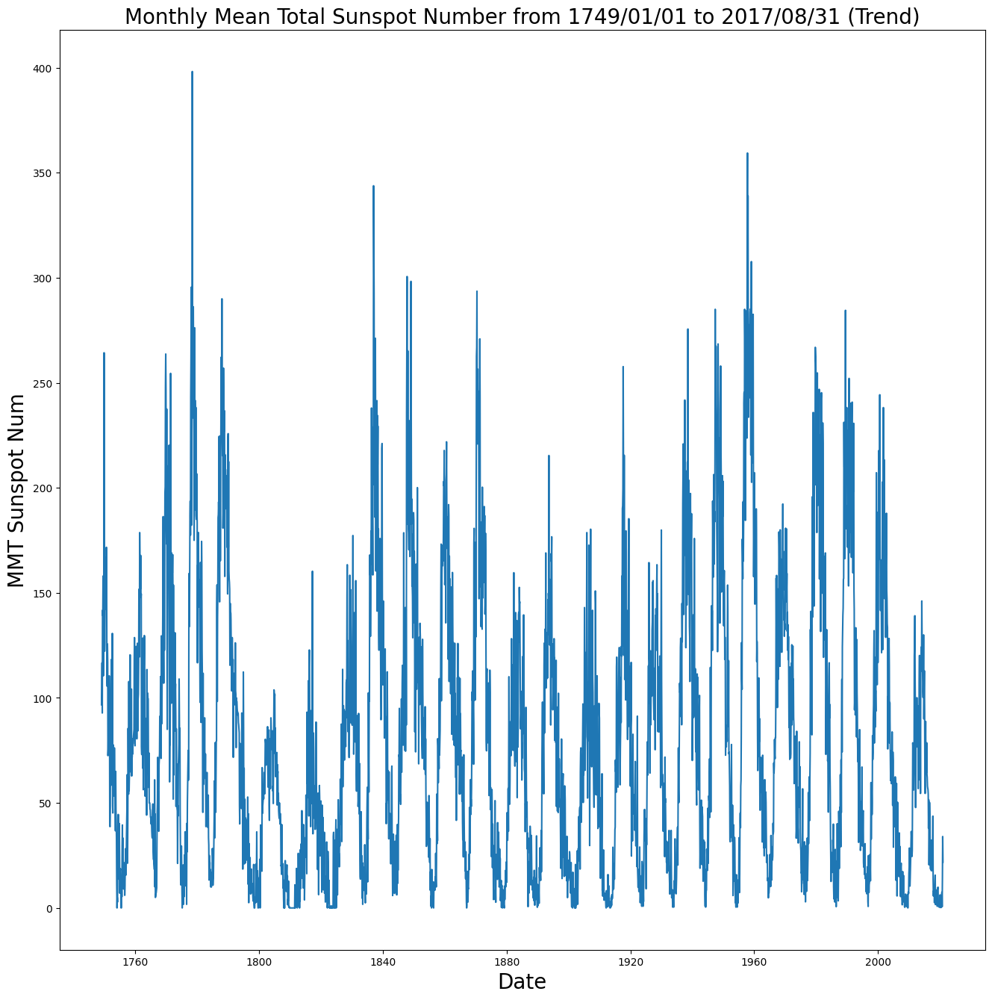

In [ ]:
title_name = 'Monthly Mean Total Sunspot Number from 1749/01/01 to 2017/08/31'
plot_sunspot_num(df_entire, 0, df_entire.shape[0]-1, "Trend", title_name,
                 'MMT Sunspot Num')

### Yearly Plots (Seasonality)

In [ ]:
yearly_df = df_entire.query("Date >= '2001-01-01' \
                       and Date <= '2002-01-01'")
yearly_df

,Monthly Mean Total Sunspot Number
Date,
2001-01-31,142.6
2001-02-28,121.5
2001-03-31,165.8
2001-04-30,161.7
2001-05-31,142.1
2001-06-30,202.9
2001-07-31,123.0
2001-08-31,161.5
2001-09-30,238.2


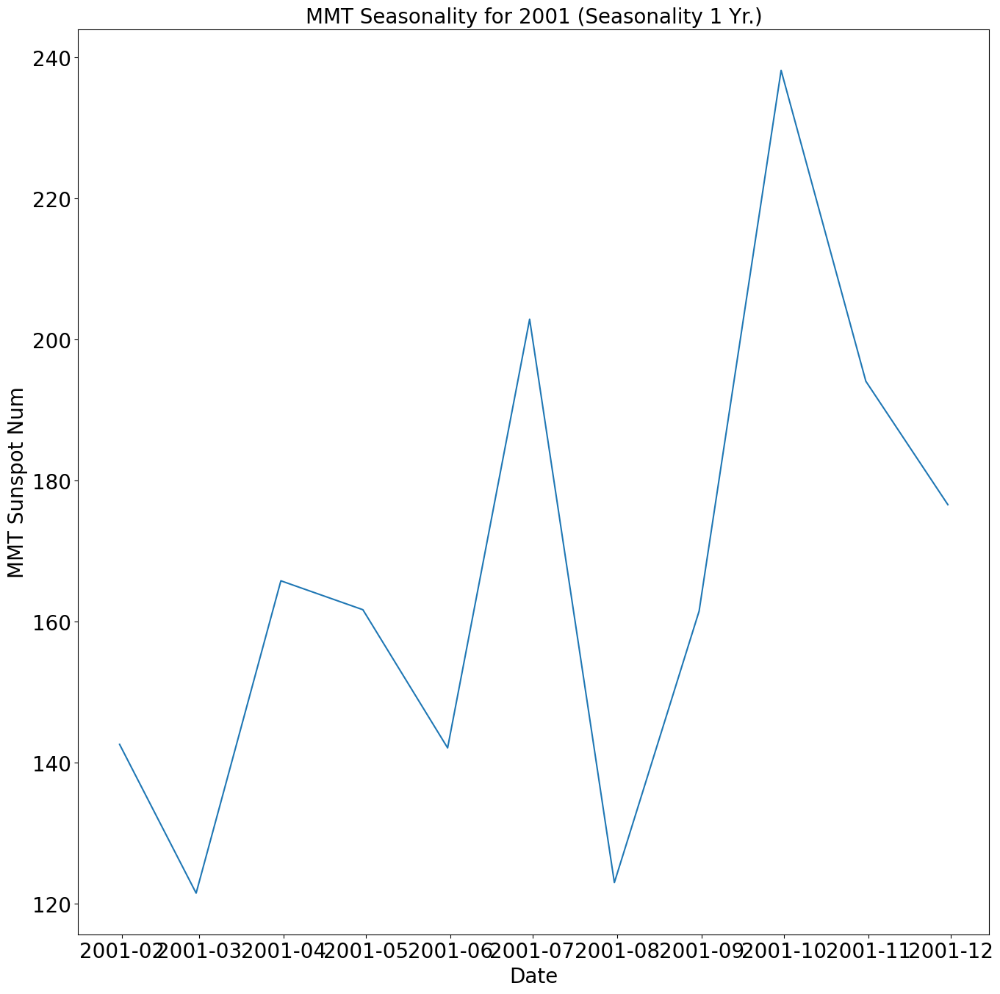

In [ ]:
plot_sunspot_num(yearly_df, 0, yearly_df.shape[0]-1, "Seasonality 1 Yr.",
                 'MMT Seasonality for 2001', 'MMT Sunspot Num')

# Normalization Process

In [ ]:
def get_scaler(scaler):
    scalers = {
        "minmax": MinMaxScaler,
        "standard": StandardScaler,
        "maxabs": MaxAbsScaler,
        "robust": RobustScaler,
    }
    return scalers.get(scaler.lower())()

def normalize_data(df):
    scaler_type = 'minmax'
    #scaler_type = input("Enter a scaler type (minmax,standard, maxabs, robust): ")
    if (scaler_type != 'minmax') and (scaler_type != 'standard') and (scaler_type != 'maxabs') and (scaler_type != 'robust'):
      runtime.unassign()

    scaler = get_scaler(scaler_type)
    normalized_data_MMT = scaler.fit_transform(df['Monthly Mean Total Sunspot Number'].
                                               values.reshape(-1,1))
    df['MMTSN_Norm'] = normalized_data_MMT
    return df, scaler

df_norm, scaler = normalize_data(df_entire)
df_norm_yr, scaler = normalize_data(yearly_df)

In [ ]:
df_norm

,Monthly Mean Total Sunspot Number,MMTSN_Norm
Date,,
1749-01-31,96.7,0.242843
1749-02-28,104.3,0.261929
1749-03-31,116.7,0.293069
1749-04-30,92.8,0.233049
1749-05-31,141.7,0.355851
...,...,...
2020-09-30,0.6,0.001507
2020-10-31,14.4,0.036163
2020-11-30,34.0,0.085384


## Plot VMT, VHT, Q Normalized based on Trend and Seasonality.

Now after normalization we can observe that the data range on y-axis is 0.0 - 1.0.

### Trend Plot

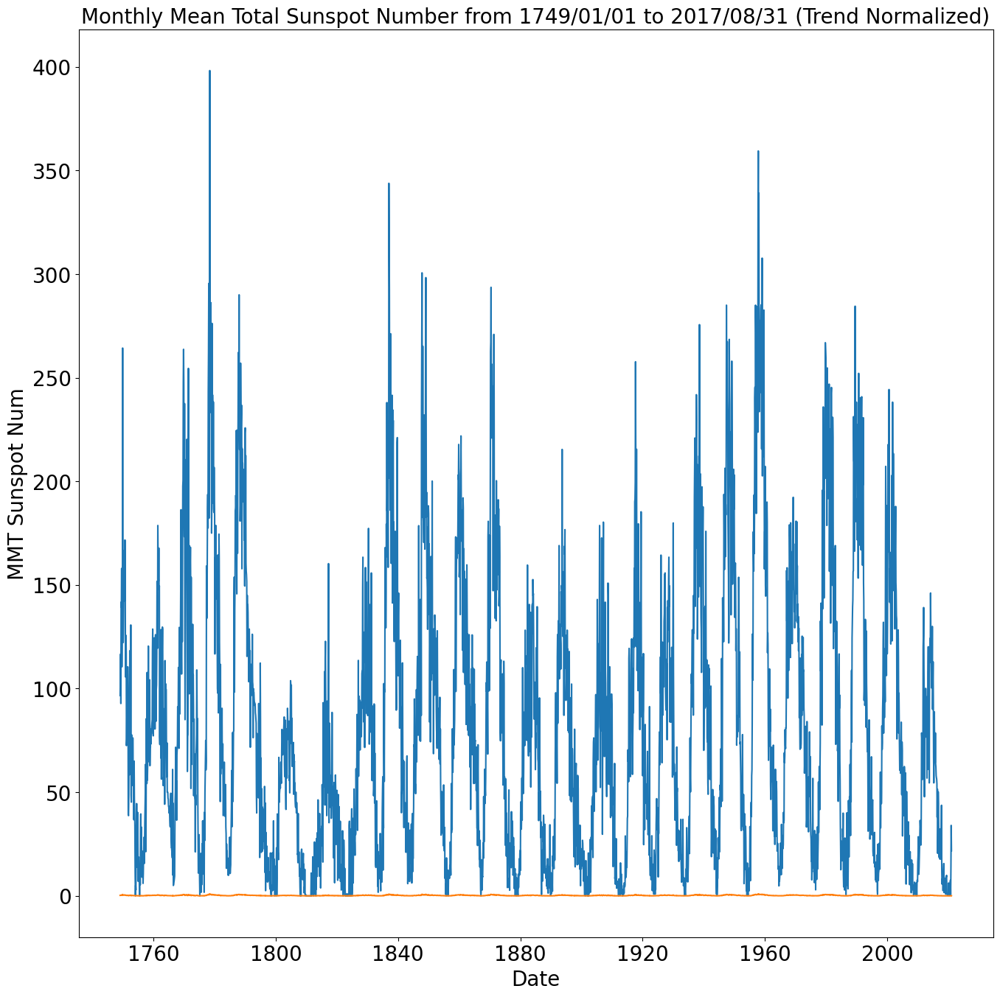

In [ ]:
plot_sunspot_num(df_norm, 0, df_entire.shape[0]-1, "Trend Normalized", title_name,
                 'MMT Sunspot Num')

### Daily Plots (Seasonality)

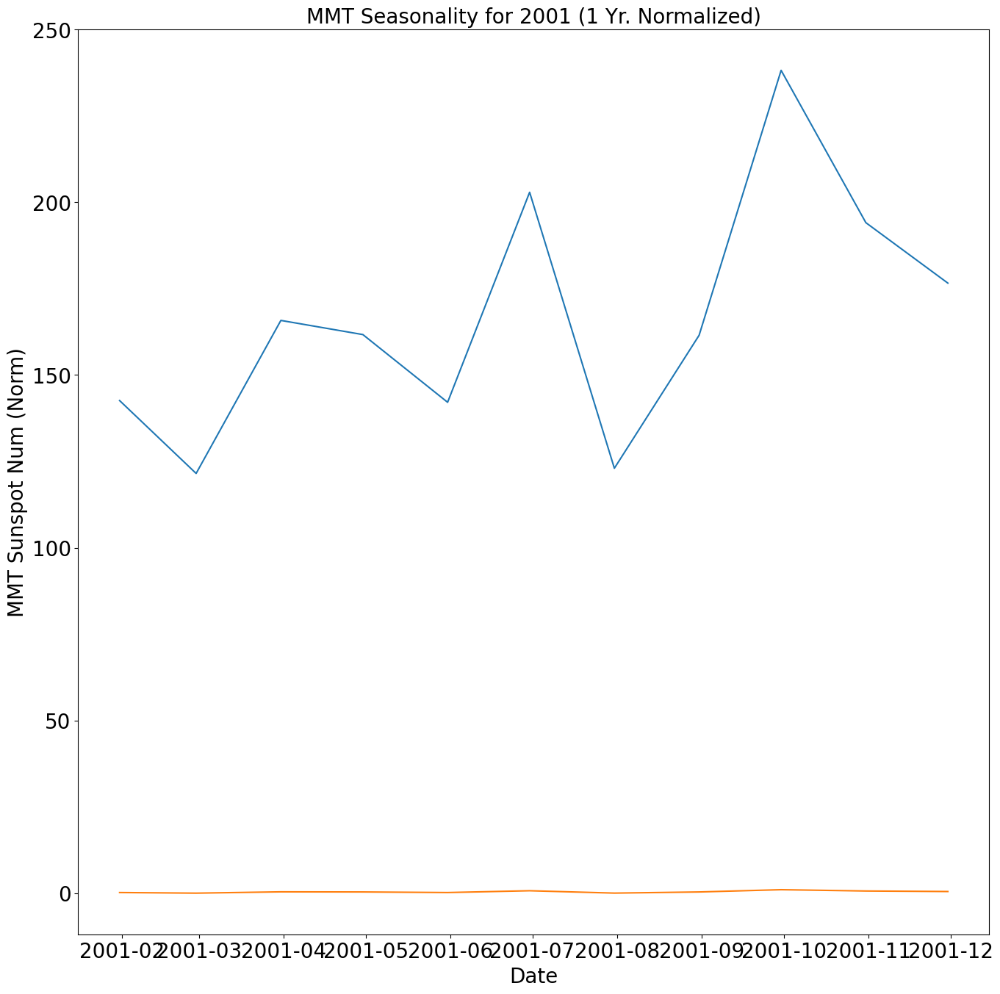

In [ ]:
plot_sunspot_num(df_norm_yr, 0, df_norm_yr.shape[0]-1, "1 Yr. Normalized",
                  'MMT Seasonality for 2001', 'MMT Sunspot Num (Norm)')

# Let's observe train and test data on the graph

## Split into Train/Test Data.

In [ ]:
test_size = 0.2 # Set Split rate to 3:1 (80 % Training 20 % Test).
split_pos = int(df_entire.shape[0]*(1 - test_size))
df_entire = df_entire.reset_index()
df_entire

,Date,Monthly Mean Total Sunspot Number,MMTSN_Norm
0,1749-01-31,96.7,0.242843
1,1749-02-28,104.3,0.261929
2,1749-03-31,116.7,0.293069
3,1749-04-30,92.8,0.233049
4,1749-05-31,141.7,0.355851
...,...,...,...
3260,2020-09-30,0.6,0.001507
3261,2020-10-31,14.4,0.036163
3262,2020-11-30,34.0,0.085384
3263,2020-12-31,21.8,0.054746


In [ ]:
# 2019-02-06 will be the date seperation. Dates past this will be the test set.
split_date = str(df_entire.Date[split_pos])
#split_date = split_date[:10]
#DOM_train = df_norm.loc[df_norm.index <= split_date].copy()
DOM_train = df_entire.loc[df_norm.index <= split_date].copy()
#DOM_test = df_norm.loc[df_norm.index > split_date].copy()
DOM_test = df_entire.loc[df_norm.index > split_date].copy()
split_date

'1966-09-30 00:00:00'

## Plot Train/Test Split Graphs.

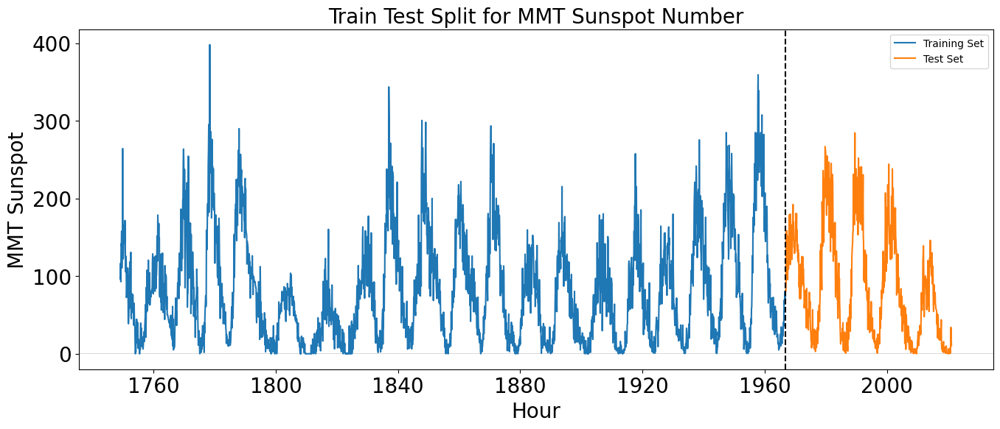

In [ ]:
# Monthly Mean Total Sunspot Number Train Test Split
plt.figure(figsize=(16,6))
plt.plot(DOM_train['Date'], DOM_train['Monthly Mean Total Sunspot Number'],
         label='Training Set (Vehicle Miles)')
plt.plot(DOM_test['Date'], DOM_test['Monthly Mean Total Sunspot Number'],
         label='Testing Set (Vehicle Miles)')
plt.axvline(x = df_entire.Date[split_pos], color='black', ls='--')
plt.legend(['Training Set', 'Test Set'])
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.xlabel("Hour", fontsize = 20)
plt.ylabel("MMT Sunspot", fontsize = 20)
plt.title("Train Test Split for MMT Sunspot Number", fontsize = 20)
plt.show()

In [ ]:
# We index the Datetime column after transformation
df_entire.set_index('Date', inplace=True)
df_entire.head()

,Monthly Mean Total Sunspot Number,MMTSN_Norm
Date,,
1749-01-31,96.7,0.242843
1749-02-28,104.3,0.261929
1749-03-31,116.7,0.293069
1749-04-30,92.8,0.233049
1749-05-31,141.7,0.355851


In [ ]:
df_entire1 = df_entire.drop(columns = ['MMTSN_Norm'])
df_entire1

,Monthly Mean Total Sunspot Number
Date,
1749-01-31,96.7
1749-02-28,104.3
1749-03-31,116.7
1749-04-30,92.8
1749-05-31,141.7
...,...
2020-09-30,0.6
2020-10-31,14.4
2020-11-30,34.0


In [ ]:
df_entire2 = df_entire.drop(columns = ['Monthly Mean Total Sunspot Number'])
df_entire2

,MMTSN_Norm
Date,
1749-01-31,0.242843
1749-02-28,0.261929
1749-03-31,0.293069
1749-04-30,0.233049
1749-05-31,0.355851
...,...
2020-09-30,0.001507
2020-10-31,0.036163
2020-11-30,0.085384


# Prepare Data for Training the Models.

* With the following function block, let's set our data set as training and test data set in a model appropriate way

In [ ]:
def load_data(data, seq_len):
    X_train = []
    y_train = []

    for i in range(seq_len, len(data)):
        X_train.append(data.iloc[i-seq_len : i, 0])
        y_train.append(data.iloc[i, 0])

    # last days are going to be used in test
    X_test = X_train[split_pos:]
    y_test = y_train[split_pos:]

    # first  days are going to be used in training
    X_train = X_train[:split_pos]
    y_train = y_train[:split_pos]

    # convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    X_test = np.array(X_test)
    y_test = np.array(y_test)

    # reshape data to input into RNN, LSTM, and GRU models
    X_train = np.reshape(X_train, (split_pos, seq_len, 1))
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))

    return [X_train, y_train, X_test, y_test]

* **The seq_len** parameter determines how far back the model will look at historical data, helping the model to capture time dependencies in a memory-aware way.
* If "seq_len" is too large, the model can become complex and prone to overlearning.

In [ ]:
feature = 'Monthly Mean Total Sunspot Number'
#selected_df = df_entire1
selected_df = df_entire2
feature_norm = 'MMT Sunspot (Norm)'
feature_field = 'MMT Sunspot'

In [ ]:
seq_len = 20
#seq_len = 6*24*30

# Let's create train, test data
#X_train, y_train, X_test, y_test = load_data(df_vht, seq_len)
#X_train, y_train, X_test, y_test = load_data(df_vmt, seq_len)
X_train, y_train, X_test, y_test = load_data(selected_df, seq_len)
#X_train, y_train, X_test, y_test = load_data(df_norm2, seq_len)


print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)

X_train.shape =  (2612, 20, 1)
y_train.shape =  (2612,)
X_test.shape =  (633, 20, 1)
y_test.shape =  (633,)


In [ ]:
X_train

array([[[0.24284279],
        [0.26192868],
        [0.29306881],
        ...,
        [0.41863385],
        [0.35735811],
        [0.43119036]],

       [[0.26192868],
        [0.29306881],
        [0.23304872],
        ...,
        [0.35735811],
        [0.43119036],
        [0.38171773]],

       [[0.29306881],
        [0.23304872],
        [0.35585133],
        ...,
        [0.43119036],
        [0.38171773],
        [0.27498744]],

       ...,

       [[0.17001507],
        [0.20140633],
        [0.18232044],
        ...,
        [0.33550979],
        [0.44952285],
        [0.4331994 ]],

       [[0.20140633],
        [0.18232044],
        [0.17855349],
        ...,
        [0.44952285],
        [0.4331994 ],
        [0.39804119]],

       [[0.18232044],
        [0.17855349],
        [0.20391763],
        ...,
        [0.4331994 ],
        [0.39804119],
        [0.32772476]]])

In [ ]:
X_test

array([[[0.17855349],
        [0.20391763],
        [0.20341537],
        ...,
        [0.39804119],
        [0.32772476],
        [0.2887996 ]],

       [[0.20391763],
        [0.20341537],
        [0.25062783],
        ...,
        [0.32772476],
        [0.2887996 ],
        [0.45203415]],

       [[0.20341537],
        [0.25062783],
        [0.39427423],
        ...,
        [0.2887996 ],
        [0.45203415],
        [0.39226519]],

       ...,

       [[0.02360623],
        [0.02285284],
        [0.02486188],
        ...,
        [0.01883476],
        [0.00150678],
        [0.03616273]],

       [[0.02285284],
        [0.02486188],
        [0.00301356],
        ...,
        [0.00150678],
        [0.03616273],
        [0.08538423]],

       [[0.02486188],
        [0.00301356],
        [0.00226017],
        ...,
        [0.03616273],
        [0.08538423],
        [0.05474636]]])

In [ ]:
y_train

array([0.38171773, 0.27498744, 0.26494224, ..., 0.39804119, 0.32772476,
       0.2887996 ])

In [ ]:
y_test

array([4.52034154e-01, 3.92265193e-01, 3.42039176e-01, 3.88749372e-01,
       4.16875942e-01, 3.82973380e-01, 3.05625314e-01, 3.90507283e-01,
       3.71170266e-01, 4.28176796e-01, 4.82923154e-01, 3.79457559e-01,
       4.26670015e-01, 3.76946258e-01, 3.44299347e-01, 3.48568559e-01,
       3.24711200e-01, 3.40030136e-01, 3.32496233e-01, 3.48066298e-01,
       3.96534405e-01, 4.54043194e-01, 3.65896534e-01, 3.89502762e-01,
       4.53289804e-01, 3.79959819e-01, 4.00050226e-01, 3.30738322e-01,
       3.53591160e-01, 3.07885485e-01, 3.38523355e-01, 2.96835761e-01,
       3.24460070e-01, 2.80763435e-01, 2.15720743e-01, 2.55148167e-01,
       2.04671020e-01, 1.77548970e-01, 2.88046208e-01, 2.18483174e-01,
       1.79055751e-01, 1.84329483e-01, 2.24761426e-01, 2.92566549e-01,
       2.18483174e-01, 3.14665997e-01, 2.85032647e-01, 2.25012557e-01,
       2.86037167e-01, 3.13159216e-01, 2.71973882e-01, 2.73480663e-01,
       2.27774987e-01, 2.18232044e-01, 1.48669011e-01, 1.61476645e-01,
      

## Essential Variables.

In [ ]:
epochs = 10
batch_size = 32
#loss = 'MAE'
loss = 'MSE'
activations = ['tanh', 'relu']
units = [32, 64]
filters = [32, 64]
kernel = [3, 5]
a = input("Enter the number of filters: ")
b = input("Enter the number of units: ")
c = input("Enter the number of kernels: ")
d = input("Select an activation index: ")
if not (a.isdigit()):
  a = random.randint(0, 3)
if not (b.isdigit()):
  b = random.randint(0, 2)
if not (c.isdigit()):
  c = random.randint(0, 2)
if not (d.isdigit()):
  d = random.randint(0, 2)
unit = units[int(a) % 3]
filter = filters[int(b) % 4]
kernel = kernel[int(c) % 3]
activation = activations[int(d) % 3]


Enter the number of filters: 0
Enter the number of units: 0
Enter the number of kernels: 0
Select an activation index: 0


## Training Loss vs. Epochs Plot

Plotting Accuracy and Validation Accuracy vs Epochs. Code taken from https://machinelearningmastery.com/display-deep-learning-model-training-history-in-keras/.

In [ ]:
def plot_training_loss(model, model_name):
    model.history.keys()
    plt.plot(model.history['loss'])
    plt.title('Training Loss vs. Epochs for {0}'.format(model_name))
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.show()

In [ ]:
@keras.saving.register_keras_serializable()
class LIFNeuron(tf.keras.layers.Layer):
    def __init__(self, threshold=0.5, leak_rate=0.001, **kwargs):
        super(LIFNeuron, self).__init__(**kwargs)
        self.threshold = threshold
        self.leak_rate = leak_rate

    def build(self, input_shape):
        self.membrane_potential = self.add_weight(
            name='membrane_potential',
            shape=(input_shape[-1],),  # Shape based on input features
            initializer='zeros',
            trainable=False
        )

    def call(self, inputs):
        input_shape = tf.shape(inputs)
        batch_size = input_shape[0]
        seq_len = input_shape[1]
        num_features = input_shape[2]

        # Initialize batch of membrane potentials
        batch_membrane_potential = tf.tile(
            tf.expand_dims(self.membrane_potential, axis=0),
            [batch_size, 1]
        )

        # Initialize output tensor
        outputs = tf.TensorArray(dtype=tf.float32, size=seq_len)

        # Iterate over time steps using tf.while_loop
        t = tf.constant(0)
        while_condition = lambda t, outputs, batch_membrane_potential: tf.less(t, seq_len)

        def while_body(t, outputs, batch_membrane_potential):
            current_input = inputs[:, t, :]
            batch_membrane_potential = batch_membrane_potential * (1 - self.leak_rate) + current_input
            spikes = tf.cast(batch_membrane_potential >= self.threshold, dtype=tf.float32)
            batch_membrane_potential = batch_membrane_potential * (1 - spikes)
            outputs = outputs.write(t, spikes)
            t = tf.add(t, 1)
            return t, outputs, batch_membrane_potential

        _, outputs, _ = tf.while_loop(while_condition, while_body, [t, outputs, batch_membrane_potential])

        outputs = outputs.stack()  # Stack the outputs from the TensorArray
        outputs = tf.transpose(outputs, [1, 0, 2])  # Reshape to (batch_size, seq_len, num_features)

        return outputs

In [ ]:
'''class LIFNeuron(tf.keras.layers.Layer):
    def __init__(self, threshold=0.5, leak_rate=0.001, **kwargs):
        super(LIFNeuron, self).__init__(**kwargs)
        self.threshold = threshold
        self.leak_rate = leak_rate

    def build(self, input_shape):
        self.membrane_potential = self.add_weight(
            name='membrane_potential',
            shape=(input_shape[-1],),  # Shape based on input features
            initializer='zeros',
            trainable=False
        )

    def call(self, inputs):
        input_shape = tf.shape(inputs)
        batch_size = input_shape[0]
        seq_len = input_shape[1]
        num_features = input_shape[2]

        # Initialize batch of membrane potentials
        batch_membrane_potential = tf.tile(
            tf.expand_dims(self.membrane_potential, axis=0),
            [batch_size, 1]
        )

        # Initialize output tensor
        outputs = tf.TensorArray(dtype=tf.float32, size=seq_len)

        # Iterate over time steps using tf.while_loop
        t = tf.constant(0)
        while_condition = lambda t, outputs, batch_membrane_potential: tf.less(t, seq_len)

        def while_body(t, outputs, batch_membrane_potential):
            current_input = inputs[:, t, :]
            batch_membrane_potential = batch_membrane_potential * (1 - self.leak_rate) + current_input
            spikes = tf.cast(batch_membrane_potential >= self.threshold, dtype=tf.float32)
            batch_membrane_potential = batch_membrane_potential * (1 - spikes)
            outputs = outputs.write(t, spikes)
            t = tf.add(t, 1)
            return t, outputs, batch_membrane_potential

        _, outputs, _ = tf.while_loop(while_condition, while_body, [t, outputs, batch_membrane_potential])

        outputs = outputs.stack()  # Stack the outputs from the TensorArray
        outputs = tf.transpose(outputs, [1, 0, 2])  # Reshape to (batch_size, seq_len, num_features)

        return outputs'''

"class LIFNeuron(tf.keras.layers.Layer):\n    def __init__(self, threshold=0.5, leak_rate=0.001, **kwargs):\n        super(LIFNeuron, self).__init__(**kwargs)\n        self.threshold = threshold\n        self.leak_rate = leak_rate\n\n    def build(self, input_shape):\n        self.membrane_potential = self.add_weight(\n            name='membrane_potential',\n            shape=(input_shape[-1],),  # Shape based on input features\n            initializer='zeros',\n            trainable=False\n        )\n\n    def call(self, inputs):\n        input_shape = tf.shape(inputs)\n        batch_size = input_shape[0]\n        seq_len = input_shape[1]\n        num_features = input_shape[2]\n\n        # Initialize batch of membrane potentials\n        batch_membrane_potential = tf.tile(\n            tf.expand_dims(self.membrane_potential, axis=0),\n            [batch_size, 1]\n        )\n\n        # Initialize output tensor\n        outputs = tf.TensorArray(dtype=tf.float32, size=seq_len)\n\n      

## New LIF Class using Refractory Period

In [ ]:
@keras.saving.register_keras_serializable()
class LIFNeuronV3(tf.keras.layers.Layer):
  def __init__(self, threshold=1.0, leak_rate=0.05, refractory_period=5, **kwargs):
      super(LIFNeuronV3 , self).__init__(**kwargs)
      self.threshold = threshold
      self.leak_rate = leak_rate
      self.refractory_period = refractory_period
      self.membrane_potential = None
      self.return_sequences = True # Flag to return output sequence

  def build(self, input_shape):
    self.num_neurons = input_shape[-1]  # Store the number of neurons
    self.membrane_potential = self.add_weight(
          name='membrane_potential',
          #shape=(input_shape[0], input_shape[-1]),
          #shape=(None, self.num_neurons),
          #shape=(input_shape[1], input_shape[-1]),
          #shape=(seq_len, num_features),  # Use Python integers
          shape=(1, self.num_neurons),
          initializer='zeros',
          trainable=False

      )

    self.refractory_counter = self.add_weight(
            name='refractory_counter',
            shape = (),
            #shape=(self.num_neurons,),
            #shape=(1, self.num_neurons),
            initializer='zeros',
            trainable=False,
            dtype=tf.int32  # Ensure refractory_counter is an integer type
        )


  def call(self, inputs):
      input_shape = tf.shape(inputs)
      inputs = tf.reshape(inputs, (input_shape[0], input_shape[1], input_shape[2]))

      # Replace for loop with tf.while_loop
      def while_body(t, sample_outputs_ta, membrane_potential, refractory_counter, sample):
          current_input = tf.gather(sample, t, axis=0)  # Get input at time step t
          membrane_potential = membrane_potential * (1 - self.leak_rate) + current_input

          # Check refractory period
          spikes = tf.cond(
              refractory_counter > 0,
              lambda: tf.zeros_like(membrane_potential),
              lambda: tf.cast(membrane_potential >= self.threshold, dtype=tf.float32)
          )

          # Reset potential and update refractory counter
          reset_condition = tf.reduce_any(spikes > 0)
          membrane_potential = tf.cond(reset_condition,
                                      lambda: membrane_potential * (1 - spikes),
                                      lambda: membrane_potential)

          refractory_counter = tf.cond(reset_condition,
                                      #lambda: self.refractory_period,
                                      lambda: tf.constant(self.refractory_period, dtype=tf.int32),
                                      lambda: tf.maximum(0, refractory_counter - 1))

          # Reshape spikes before writing to TensorArray
          spikes = tf.reshape(spikes, (1, self.num_neurons))  # Shape as (1, num_neurons)
          sample_outputs_ta = sample_outputs_ta.write(t, spikes)

          return tf.add(t, 1), sample_outputs_ta, membrane_potential, refractory_counter, sample

      # Initialize loop variables
      t = tf.constant(0)
      max_time_steps = input_shape[1]

      # Execute the loop for each sample in the batch using tf.map_fn
      def process_sample(sample):
          # Initialize TensorArray inside process_sample
          sample_outputs_ta = tf.TensorArray(dtype=tf.float32, size=0, dynamic_size=True)

          _, sample_outputs_ta, _, _, _ = tf.while_loop(
              lambda t, *_: tf.less(t, max_time_steps),
              while_body,
              [t, sample_outputs_ta, self.membrane_potential, self.refractory_counter, sample]
          )
          sample_outputs = sample_outputs_ta.stack()
          return sample_outputs

      # Use tf.map_fn to process each sample in the batch
      outputs = tf.map_fn(process_sample, inputs, dtype=tf.float32)

      return outputs

## Create SpikingActivation Class.

Due to the depreciation of keras_spiking.SpikingActivation, a custom SpikingActivation class is provided below prior to creating the model.

In [ ]:
# Removed redundant SpikingActivationCell and SpikingActivationLayer definitions to avoid conflicts.
# The primary definitions are in cell iQwNw7MlMHyx and cMGl8gFFBRxt.

## sMAPE Function

In [ ]:
def symmetric_mean_absolute_percentage_error(y_true, y_pred):
    # Ensure y_true and y_pred are numpy arrays
    y_true, y_pred = np.array(y_true), np.array(y_pred)

    # Calculate the absolute difference between true and predicted values
    abs_diff = np.abs(y_true - y_pred)

    # Calculate the sum of absolute true and predicted values, divided by 2
    # Add a small epsilon to the denominator to avoid division by zero
    denominator = (np.abs(y_true) + np.abs(y_pred)) / 2
    epsilon = np.finfo(np.float64).eps # Smallest positive floating-point number

    # Calculate sMAPE
    # Handle cases where denominator might be zero by setting those to zero error
    smape = np.mean(np.where(denominator == 0, 0, abs_diff / denominator)) * 100

    return smape

## Confidence Intervals for MAE and RMSE using Bootstrapping

In [ ]:
def calculate_bootstrap_ci(y_true, y_pred, metric_func, n_bootstraps=1000,
                           confidence_level=0.95):
    bootstrap_metrics = []
    n_samples = len(y_true)

    for _ in range(n_bootstraps):
        # Bootstrap resampling with replacement
        indices = np.random.choice(n_samples, n_samples, replace=True)
        y_true_sample = y_true[indices]
        y_pred_sample = y_pred[indices]

        # Calculate the metric for the bootstrapped sample
        metric_value = metric_func(y_true_sample, y_pred_sample)
        bootstrap_metrics.append(metric_value)

    # Calculate the confidence interval
    lower_bound = np.percentile(bootstrap_metrics, (1 - confidence_level) / 2
                                * 100)
    upper_bound = np.percentile(bootstrap_metrics, (1 + confidence_level) / 2
                                * 100)

    return lower_bound, upper_bound

In [ ]:
def perform_statistical_tests(y_true, y_pred, model_name):
    print(f"\n--- Statistical Tests for {model_name} ---")

    # Ensure y_pred is flattened if it's a 2D array
    if y_pred.ndim > 1:
        y_pred = y_pred.flatten()

    # Calculate differences for paired tests
    differences = y_true - y_pred

    # Paired t-test
    try:
        t_statistic, p_value_t = scipy.stats.ttest_rel(y_true, y_pred)
        print(f"Paired t-test: t-statistic = {t_statistic:.4f}, p-value = {p_value_t:.4f}")
        if p_value_t < 0.05:
            print("(Result is statistically significant: there is a significant difference between actual and predicted values)")
        else:
            print("(Result is not statistically significant: no significant difference found)")
    except Exception as e:
        print(f"Paired t-test could not be performed: {e}")

    # Wilcoxon signed-rank test (non-parametric alternative to paired t-test)
    try:
        # The Wilcoxon test expects non-zero differences
        non_zero_differences = differences[differences != 0]
        if len(non_zero_differences) > 0:
            wilcoxon_statistic, p_value_wilcoxon = scipy.stats.wilcoxon(non_zero_differences)
            print(f"Wilcoxon Signed-Rank Test: statistic = \
            {wilcoxon_statistic:.4f}, p-value = {p_value_wilcoxon:.4f}")
            if p_value_wilcoxon < 0.05:
                print("(Result is statistically significant: there is a significant difference between actual and predicted values)")
            else:
                print("(Result is not statistically significant: no significant difference found)")
        else:
            print("Wilcoxon Signed-Rank Test skipped: All differences are zero.")
    except Exception as e:
        print(f"Wilcoxon Signed-Rank Test could not be performed: {e}")

### Diebold-Mariano Test Functions

In [ ]:
from statsmodels.stats.api import DescrStatsW

def diebold_mariano_test(y_true, y_pred1, y_pred2, h=1, power=2):
    # Ensure inputs are numpy arrays
    y_true = np.array(y_true).flatten()
    y_pred1 = np.array(y_pred1).flatten()
    y_pred2 = np.array(y_pred2).flatten()

    # Calculate loss differentials
    # L(y_true, y_pred) = |y_true - y_pred|^power
    loss1 = np.abs(y_true - y_pred1)**power
    loss2 = np.abs(y_true - y_pred2)**power

    d_t = loss1 - loss2

    # DM statistic calculation
    # Reference: Diebold, F. X., & Mariano, R. S. (1995).
    # "Comparing Predictive Accuracy." Journal of Business & Economic Statistics, 13(3), 253-263.

    n = len(d_t)
    # For h-step ahead forecasts, we need to account for serial correlation
    # up to h-1 lags. The formula for the variance of the sample mean of d_t
    # involves an autocovariance function.

    # For a simple case (h=1), the variance can be estimated using a simple variance.
    # For h > 1, a more robust estimator like Newey-West or a similar HAC estimator is needed.
    # statsmodels.stats.sandwich_covariance.HAC for more advanced usage.
    # For simplicity, here we'll use a basic approach or rely on DescrStatsW for a variance estimate.

    # For non-overlapping, one-step ahead, we can simply test if the mean of d_t is different from zero.
    mean_d = np.mean(d_t)
    std_d = np.std(d_t, ddof=1) # sample standard deviation

    if std_d == 0:
        dm_statistic = 0.0 # If all differences are the same, no variance
        p_value = 1.0
    else:
        dm_statistic = mean_d / (std_d / np.sqrt(n))
        # Two-sided p-value from standard normal distribution (as n is large)
        p_value = 2 * (1 - scipy.stats.norm.cdf(np.abs(dm_statistic)))

    # More robust way using statsmodels if needed, for simplicity sticking to the above.
    # dm_test_res = DescrStatsW(d_t)
    # dm_statistic_robust = dm_test_res.tconfint_mean()[0] # This is not directly the statistic.
    # dm_statistic_robust = dm_test_res.tstat
    # p_value_robust = dm_test_res.pvalue

    return dm_statistic, p_value

# DM test with different powers (MAE or MSE based loss)
def diebold_mariano_mae(y_true, y_pred1, y_pred2, h=1):
    return diebold_mariano_test(y_true, y_pred1, y_pred2, h=h, power=1)

def diebold_mariano_mse(y_true, y_pred1, y_pred2, h=1):
    return diebold_mariano_test(y_true, y_pred1, y_pred2, h=h, power=2)

## Measure ANN Energy

In [ ]:
def measure_ann_energy(model, X_test, model_name_str=None):
    # Define general power estimates (in Watts) - these are NOT specific to Colab
    # Use these values for a rough conceptual energy estimation only.
    # Adjust these based on your research or assumptions for typical hardware.
    general_cpu_power_watts = 80 # Example general CPU power under load
    general_gpu_power_watts = 200 # Example general GPU power under load

    print("Measuring inference time and estimating energy on CPU (for ANN)...")
    with tf.device('/CPU:0'):
        # Warm-up pass to ensure operations are ready
        _ = model.predict(X_test[:1], verbose=0)
        start_time_cpu = time.time()
        _ = model.predict(X_test, verbose=0)
        end_time_cpu = time.time()
        cpu_inference_time = end_time_cpu - start_time_cpu
        estimated_cpu_energy = general_cpu_power_watts * cpu_inference_time
        estimated_cpu_energy_uJ = estimated_cpu_energy * 1e6 # Convert to microjoules

    print(f"  CPU Inference Time: {cpu_inference_time:.4f} seconds")
    print(f"  Estimated CPU Energy: {estimated_cpu_energy:.4f} Joules ({estimated_cpu_energy_uJ:.4f} \u00B5J)")

    gpu_inference_time = None
    estimated_gpu_energy_J = None
    estimated_gpu_energy_uJ = None

    if tf.config.list_physical_devices('GPU'):
        print("\nMeasuring inference time and estimating energy on GPU (for ANN)...")
        with tf.device('/GPU:0'):
            _ = model.predict(X_test[:1], verbose=0) # Warm-up
            start_time_gpu = time.time()
            _ = model.predict(X_test, verbose=0)
            end_time_gpu = time.time()
            gpu_inference_time = end_time_gpu - start_time_gpu
            estimated_gpu_energy_J = general_gpu_power_watts * gpu_inference_time
            estimated_gpu_energy_uJ = estimated_gpu_energy_J * 1e6 # Convert to microjoules

        print(f"GPU Inference Time: {gpu_inference_time:.4f} seconds")
        print(f"Estimated GPU Energy: {estimated_gpu_energy_J:.4f} Joules ({estimated_gpu_energy_uJ:.4f} \u00B5J)")
    else:
        print("\nNo GPU available. GPU measurements skipped.")

    return {
        'model_name': model_name_str if model_name_str else (model.name if hasattr(model, 'name') else 'ANN Model'),
        'cpu_inference_time_s': cpu_inference_time,
        'estimated_cpu_energy_J': estimated_cpu_energy,
        'estimated_cpu_energy_uJ': estimated_cpu_energy_uJ,
        'gpu_inference_time_s': gpu_inference_time,
        'estimated_gpu_energy_J': estimated_gpu_energy_J,
        'estimated_gpu_energy_uJ': estimated_gpu_energy_uJ,
        'snn_spike_energy_uJ': None
    }

## Measure SNN Energy

In [ ]:
def measure_snn_energy(model, X_test, model_name_str=None):
    # Define general power estimates (in Watts) - these are NOT specific to Colab
    # Use these values for a rough conceptual energy estimation only.
    # Adjust these based on your research or assumptions for typical hardware.
    general_cpu_power_watts = 80  # Example general CPU power under load
    general_gpu_power_watts = 200 # Example general GPU power under load

    # Conceptual energy per spike for a digital SNN neuron in microjoules
    # This is a highly simplified estimate and would vary greatly based on hardware and SNN implementation.
    # A typical biological neuron spike is ~45 pJ (0.000045 nJ). Digital SNNs are more energy intensive.
    # We'll use a conceptual value for a single digital SNN neuron spike.
    conceptual_energy_per_spike_uJ = 0.001 # 1 nJ per spike, converted to microjoules

    print("Measuring inference time and estimating energy on CPU (for SNN)...")
    with tf.device('/CPU:0'):
        _ = model.predict(X_test[:1], verbose=0) # Warm-up
        start_time_cpu = time.time()
        predictions = model.predict(X_test, verbose=0)
        end_time_cpu = time.time()
        cpu_inference_time = end_time_cpu - start_time_cpu
        estimated_cpu_energy = general_cpu_power_watts * cpu_inference_time
        estimated_cpu_energy_uJ = estimated_cpu_energy * 1e6 # Convert to microjoules

    print(f"  CPU Inference Time: {cpu_inference_time:.4f} seconds")
    print(f"  Estimated CPU Energy: {estimated_cpu_energy:.4f} Joules ({estimated_cpu_energy_uJ:.4f} \u00B5J)")

    gpu_inference_time = None
    estimated_gpu_energy_J = None
    estimated_gpu_energy_uJ = None

    if tf.config.list_physical_devices('GPU'):
        print("\nMeasuring inference time and estimating energy on GPU (for SNN)...")
        with tf.device('/GPU:0'):
            _ = model.predict(X_test[:1], verbose=0) # Warm-up
            start_time_gpu = time.time()
            predictions_gpu = model.predict(X_test, verbose=0)
            end_time_gpu = time.time()
            gpu_inference_time = end_time_gpu - start_time_gpu
            estimated_gpu_energy_J = general_gpu_power_watts * gpu_inference_time
            estimated_gpu_energy_uJ = estimated_gpu_energy_J * 1e6 # Convert to microjoules

        print(f"  GPU Inference Time: {gpu_inference_time:.4f} seconds")
        print(f"  Estimated GPU Energy: {estimated_gpu_energy_J:.4f} Joules ({estimated_gpu_energy_uJ:.4f} \u00B5J)")
    else:
        print("\nNo GPU available. GPU measurements skipped.")

    # Estimate total spikes and spike energy for SNNs if applicable
    # This part assumes a way to count spikes within the SNN model.
    # For models built with SpikingActivationLayer, we would need to capture spike counts.
    # For now, we'll make a simplifying assumption or provide a placeholder.
    total_spikes = 0
    # This is a very rough estimate. A more accurate calculation would involve iterating
    # through the spiking layers and summing the spikes generated.
    for layer in model.layers:
        if isinstance(layer, LIFNeuron) or isinstance(layer, LIFNeuronV3) or isinstance(layer, SpikingActivationLayer) or isinstance(layer, SpikingActivationLayer2):
            # This is a placeholder. A real implementation would need to hook into
            # the layer's internal state during prediction to count spikes.
            # For example, by running the model in a debug mode or with custom callbacks.
            # For demonstration, let's assume an average spike rate.
            # If the model produced predictions, it implicitly processed inputs.
            # Let's estimate spikes based on the number of neurons and timesteps.
            try:
                # This is a speculative way to get neuron count; adjust based on actual layer structure
                num_neurons_in_layer = layer.units if hasattr(layer, 'units') else layer.cell.units if hasattr(layer, 'cell') and hasattr(layer.cell, 'units') else 128 # Default to 128 if not found
                estimated_spikes_per_layer = num_neurons_in_layer * X_test.shape[1] * X_test.shape[0] # neurons * timesteps * batch_size
                total_spikes += estimated_spikes_per_layer
            except AttributeError:
                # Handle layers that might not have a 'units' attribute as expected
                pass

    estimated_snn_spike_energy_uJ = total_spikes * conceptual_energy_per_spike_uJ
    if total_spikes > 0:
        print(f"Estimated total spikes: {total_spikes:.0f}")
        print(f"Estimated SNN Spike Energy: {estimated_snn_spike_energy_uJ:.4f} \u00B5J")
    else:
        print("No spiking layers detected or spike energy estimation skipped.")

    return {
        'model_name': model_name_str if model_name_str else model.name if hasattr(model, 'name') else 'SNN Model',
        'cpu_inference_time_s': cpu_inference_time,
        'estimated_cpu_energy_J': estimated_cpu_energy,
        'estimated_cpu_energy_uJ': estimated_cpu_energy_uJ,
        'gpu_inference_time_s': gpu_inference_time,
        'estimated_gpu_energy_J': estimated_gpu_energy_J,
        'estimated_gpu_energy_uJ': estimated_gpu_energy_uJ,
        'snn_spike_energy_uJ': estimated_snn_spike_energy_uJ
    }

## Output Spikes Code

Code taken from https://pythontic.com/visualization/charts/spikerasterplot#:~:text=A%20Spike%20raster%20plot%20is%20a%20plot%20used,potential%20from%20a%20neuron%20at%20a%20specified%20position.

In [ ]:
def check_output(seq_model, X_train, X_test, y_train, y_test, modify_dt=0.1):
    """
    This code is used to show the plot of the output spikes for the
    SpikingActivation Layer.
    """

    # Repeat the outputs for n_steps.
    n_steps = 10
    train_sequences = np.tile(X_train[:, None], (1, n_steps, 1, 1))
    test_sequences = np.tile(X_test[:, None], (1, n_steps, 1, 1))

    # Rebuild the model with the functional API to access the output of
    # intermediate layers.
    # Corrected line: Use seq_model.input_shape instead of seq_model.layers[0].input_shape
    inp = x = tf.keras.Input(batch_shape=seq_model.input_shape)
    has_global_average_pooling = False
    # Obtain list of layers to create a spike matrix.
    spikes_dict = {}
    layer_names = []

    # Initialize spike_layer to None
    spike_layer = None

    print("length of seq_model.layers: ", len(seq_model.layers))
    for layer in seq_model.layers:
        print("layer type: ", type(layer))
        print("layer name: ", layer.name)
        if "_1" in layer.name:
          layer_new_name = str(layer.name).replace("_1", "")
          print("layer new name: ", layer_new_name)
          layer_names.append(layer_new_name)
        else:
          layer_names.append(str(layer.name))
        if isinstance(layer, tf.keras.layers.GlobalAveragePooling1D):
            # Remove the pooling so that we can see the model's output over
            # time.
            has_global_average_pooling = True
            continue

        if isinstance(layer, (keras_spiking.SpikingActivation,
                              keras_spiking.Lowpass, SpikingActivationLayer)):

            cfg = layer.get_config()
            # Update dt, if specified
            if modify_dt is not None:
                cfg["dt"] = modify_dt
            # Return the full time series for visualization
            cfg["return_sequences"] = True

            layer = type(layer)(**cfg)

        if isinstance(layer, (keras_spiking.SpikingActivation, SpikingActivationLayer)):
            # save this layer so we can access it later
            spike_layer = layer

        x = layer(x)

    # Initialize spikes_dict with layer names as keys
    for layer_name in layer_names:
        spikes_dict[layer_name] = np.array([]) # Initialize as empty array

    layer_names.append("Output")
    spikes_dict["Output"] = np.array([])

    # Check if a spiking layer was found before proceeding
    if spike_layer is None:
        print("Error: No SpikingActivation or compatible layer found in the model for spike plotting.")
        return

    # Take a look at Spiking Activation Layer.
    func_model = tf.keras.Model(inp, [x, spike_layer.output])

    # Copy weights to new model
    func_model.set_weights(seq_model.get_weights())

    # Run model
    output, spikes = func_model.predict(test_sequences)
    spikes = np.transpose(spikes, (0, 2, 1))
    print("spikes.shape: ", spikes.shape)

    # Iterate through layer list
    for i in range(spikes.shape[0]):
      for j in range(len(layer_names)):
        # Append spike data for each layer, handling potential empty arrays
        if spikes_dict[layer_names[j]].size == 0:
            spikes_dict[layer_names[j]] = spikes[i][j]
        else:
            spikes_dict[layer_names[j]] = np.concatenate((spikes_dict[layer_names[j]],
                                                    spikes[i][j]), axis = 0)

    print("spikes_dict: ", spikes_dict)

    if has_global_average_pooling:
        # Check test accuracy using average output over all timesteps
        predictions = np.argmax(output.mean(axis=1), axis=-1)
    else:
        # Check test accuracy using output from only the last timestep
        predictions = np.argmax(output[:, -1], axis=-1)

    #print("spike_layer.dt: ", spike_layer.dt)
    # Evaluate Test Data
    seq_model_mae = mean_absolute_error(y_test, snn_pred_test)
    print("MAE of seq_model = ", seq_model_mae)
    seq_model_rmse = mean_absolute_error(y_test, snn_pred_test)**0.5
    print("RMSE of seq_model = ", seq_model_rmse)
    seq_model_mape = 100*mean_absolute_percentage_error(y_test, snn_pred_test)
    print("MAPE of seq_model = ", seq_model_mape)

    # Start Output Spike Plot.
    num_neurons = 10
    # Use spike_layer.name to dynamically get the correct key
    print("spikes for spiking_activation: ", spikes_dict[spike_layer.name])
    spikes_matrix = spikes_dict[spike_layer.name]*20*modify_dt
    print("spikes_matrix.shape: ", spikes_matrix.shape)
    spikes_matrix = spikes_matrix.reshape(spikes.shape[0], n_steps)
    print("spikes_matrix.shape: ", spikes_matrix.shape)
    neurons = np.random.choice(spikes_matrix.shape[1], num_neurons, replace=True)
    print("neurons: ", neurons)
    print("neurons.shape: ", neurons.shape)

    fig, ax = plt.subplots(figsize=(14, 12), facecolor="#00FFFF")
    color = cm.get_cmap('tab10')(0)
    timesteps = np.arange(n_steps)
    print("timesteps shape: ", timesteps.shape)
    print("timesteps: {0}".format(timesteps))
    for i in range(num_neurons):
      print("i: ", i)
      indices = np.where(spikes_matrix[:, i] != 0)
      list_of_indices = [list(row) for row in zip(*indices)]
      print("list of indices: ", list_of_indices)
      flat_list = []
      for row in list_of_indices:
          flat_list.extend(row)
      print("flat_list: ", flat_list)
      #print("spike matrix where shape: ", len(np.where(spikes_matrix[:, i] != 0)))
      #output_spikes_list = list((np.where(spikes_matrix[:, i] != 0)))
      #print("output_spikes_list: ", output_spikes_list)
      #print(timesteps[np.where(spikes_matrix[:, i] != 0)])
      for t in flat_list:
        #if (t < n_steps):
        ax.plot([t, t], [i+0.5, i+1.5], color=color)
          #ax.eventplot([t,], [i + 0.5, i + 0.5])
        #ax.eventplot([t, t], lineoffsets=[i+0.5, i+1.5], linelengths=1, colors=color)

    ax.set_ylim(0.5, num_neurons+0.5)
    #ax.set_yticks(list(range(1, num_neurons+1, int(np.ceil(num_neurons/50)))))
    ax.set_yticks(list(range(1, num_neurons + 1)))  # Adjust y-axis ticks
    #ax.set_xticks(list(range(1, n_steps+1, 10)))
    ax.set_ylabel("Neuron Index", fontsize = 15)
    ax.set_xlabel("Time in $ms$", fontsize = 15)
    ax.set_title("Dense Spiking Activation Layer Spikes Plot", fontsize = 15)

# Single Models

## RNN model

### Create Vanilla RNN Model.

In [ ]:
rnn_model = Sequential()

rnn_model.add(SimpleRNN(unit,activation=activation,return_sequences=True,
                        input_shape=(X_train.shape[1],1)))
rnn_model.add(Dropout(0.5))

#rnn_model.add(SimpleRNN(32,activation="tanh",return_sequences=True))
#rnn_model.add(Dropout(0.5))

rnn_model.add(SimpleRNN(unit,activation=activation,return_sequences=False))
rnn_model.add(Dropout(0.5))

rnn_model.add(Dense(1))

rnn_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ simple_rnn (SimpleRNN)          │ (None, 20, 32)         │         1,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 20, 32)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ simple_rnn_1 (SimpleRNN)        │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,201 (12.50 KB)

 Trainable params: 3,201 (12.50 KB)

 Non-trainable params: 0 (0.00 B)

### Train Vanilla RNN Model.

GPU is not available. Training will use CPU.
Epoch 1/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 0.2457
Epoch 2/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0702
Epoch 3/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0461
Epoch 4/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0322
Epoch 5/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0250
Epoch 6/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0204
Epoch 7/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0174
Epoch 8/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0152
Epoch 9/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0144
Epoch 10/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0128


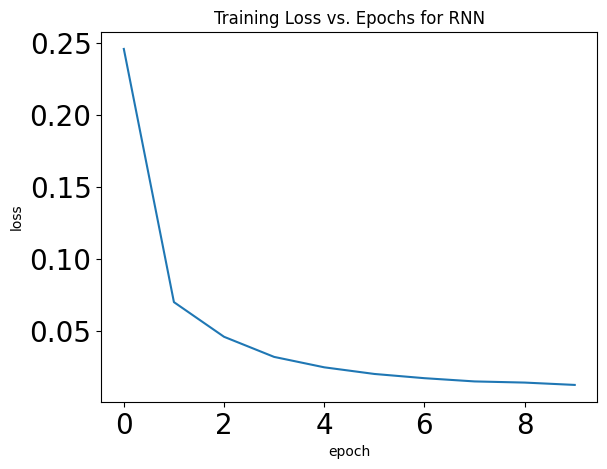

In [ ]:
if device == 'cuda':
   # Configure TensorFlow to use the GPU if available
   tf.config.set_visible_devices(tf.config.list_physical_devices('GPU'), 'GPU')
   # Model training will automatically use the GPU if configured and available
   print("GPU is available and configured for TensorFlow.")
else:
   print("GPU is not available. Training will use CPU.")

rnn_model.compile(optimizer="adam",loss=loss)
rnn_epochs = rnn_model.fit(X_train, y_train, epochs=epochs,
                           batch_size=batch_size)
plot_training_loss(rnn_epochs, "RNN")

In [ ]:
# Verify the device the model is placed on
# This method is not suitable for checking the device of a SimpleRNN layer in this context.
# TensorFlow automatically handles device placement when a GPU is configured.
# print(rnn_model.get_layer(index=0)._get_trainable_state_variable_device())

### Evaluate Vanilla RNN Model using MAE, RMSE, and R2.

In [ ]:
print("RNN Predictions for Training Set")
rnn_predictions_train = rnn_model.predict(X_train)
print("RNN Predictions for Testing Set")
rnn_predictions_test = rnn_model.predict(X_test)
rnn_mae = mean_absolute_error(y_test,rnn_predictions_test)
print("MAE of RNN model = ",rnn_mae)
rnn_rmse =  mean_squared_error(y_test,rnn_predictions_test) ** 0.5
print("RMSE of RNN model = ",rnn_rmse)
rnn_r2_score = r2_score(y_test,rnn_predictions_test)
print("R2 Score of RNN model = ",rnn_r2_score)
rnn_mape_score = 100*mean_absolute_percentage_error(y_test,rnn_predictions_test)
print("MAPE Score of RNN model = {0} %".format(rnn_mape_score))
rnn_smape_score = 100* symmetric_mean_absolute_percentage_error(y_test,rnn_predictions_test)
print("sMAPE Score of RNN model = {0} %".format(rnn_smape_score))

RNN Predictions for Training Set
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
RNN Predictions for Testing Set
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
MAE of RNN model =  0.04324904654771954
RMSE of RNN model =  0.0574726923412386
R2 Score of RNN model =  0.8924879719920851
MAPE Score of RNN model = 19499214604158.723 %
sMAPE Score of RNN model = 9435.085523098678 %


In [ ]:
perform_statistical_tests(y_test, rnn_predictions_test, "RNN")


--- Statistical Tests for RNN ---
Paired t-test could not be performed: name 'scipy' is not defined
Wilcoxon Signed-Rank Test could not be performed: name 'scipy' is not defined


### Calculate 95% Confidence Intervals for RNN MAE and RMSE

In [ ]:
rnn_mae_ci_lower, rnn_mae_ci_upper = calculate_bootstrap_ci(y_test, rnn_predictions_test.flatten(), mean_absolute_error)
print(f"RNN MAE 95% CI: [{rnn_mae_ci_lower:.4f}, {rnn_mae_ci_upper:.4f}]")

rnn_rmse_ci_lower, rnn_rmse_ci_upper = calculate_bootstrap_ci(y_test, rnn_predictions_test.flatten(), lambda yt, yp: mean_squared_error(yt, yp)**0.5)
print(f"RNN RMSE 95% CI: [{rnn_rmse_ci_lower:.4f}, {rnn_rmse_ci_upper:.4f}]")

RNN MAE 95% CI: [0.0405, 0.0463]
RNN RMSE 95% CI: [0.0535, 0.0615]


### Reverse Transform Scaler to Convert to Real Values.

In [ ]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
rnn_predictions_inv_train = scaler.inverse_transform(rnn_predictions_train)

y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
rnn_predictions_inv_test = scaler.inverse_transform(rnn_predictions_test)

# Get values after inverse transformation
y_train_inverse = y_train_inverse.flatten()
rnn_predictions_inv_train = rnn_predictions_inv_train.flatten()

y_test_inverse = y_test_inverse.flatten()
rnn_predictions_inv_test = rnn_predictions_inv_test.flatten()

### Show Actual and Predicted y values as Dataframes.

#### With Training Dates.

In [ ]:
first_6169_index_dates = df_entire.index[:X_train.shape[0]]
results_RNN_train = pd.DataFrame({"Date": first_6169_index_dates,
                                  'Actual': y_train_inverse,
                                  'Predicted': rnn_predictions_inv_train})
results_RNN_train

,Date,Actual,Predicted
0,1749-01-31,166.046459,166.471802
1,1749-02-28,153.591035,166.252441
2,1749-03-31,152.418759,160.823654
3,1749-04-30,158.338749,159.322998
4,1749-05-31,155.701130,159.620407
...,...,...,...
2607,1966-04-30,173.959317,161.598312
2608,1966-05-31,172.054370,165.401245
2609,1966-06-30,167.951406,167.480804
2610,1966-07-31,159.745480,166.224884


#### With Testing Dates.

In [ ]:
last_6169_index_dates = df_entire.index[-X_test.shape[0]:]
results_RNN_test = pd.DataFrame({"Date":last_6169_index_dates,
                                 'Actual': y_test_inverse,
                                 'Predicted': rnn_predictions_inv_test})
results_RNN_test

,Date,Actual,Predicted
0,1968-05-31,174.252386,161.666672
1,1968-06-30,167.277348,166.171616
2,1968-07-31,161.415972,164.953476
3,1968-08-31,166.867052,163.466034
4,1968-09-30,170.149422,165.081635
...,...,...,...
628,2020-09-30,121.675841,124.839722
629,2020-10-31,125.720191,124.610161
630,2020-11-30,131.464340,125.733299
631,2020-12-31,127.888900,128.620789


### Plotting Predictions for Q/VMT/VHT made by RNN Model.

#### Only Testing Data.

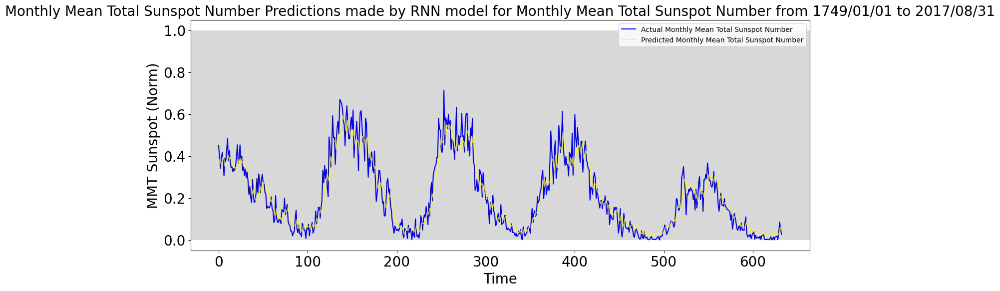

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(rnn_predictions_test, alpha=0.7, color='yellow',
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by RNN model for {1}".
          format(feature, title_name), fontsize = 20)
plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
plt.xlabel('Time', fontsize = 20)
plt.ylabel(feature_norm, fontsize = 20)
plt.legend()
plt.show()

#### Training and Testing Data combined.

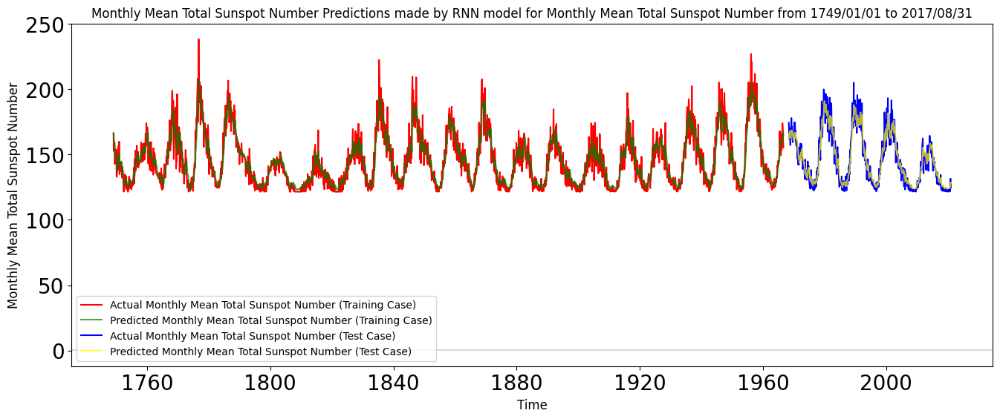

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(results_RNN_train['Date'], results_RNN_train['Actual'], color='red',
         label='Actual {0} (Training Case)'.format(feature))
plt.plot(results_RNN_train['Date'],  results_RNN_train['Predicted'], alpha=0.7,
         color='green', label='Predicted {0} (Training Case)'.format(feature))
plt.plot(results_RNN_test['Date'], results_RNN_test['Actual'], color='blue',
         label='Actual {0} (Test Case)'.format(feature))
plt.plot(results_RNN_test['Date'], results_RNN_test['Predicted'], alpha=0.7, color='yellow',
         label='Predicted {0} (Test Case)'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by RNN model for {1}".
          format(feature, title_name))
plt.xlabel('Time', fontsize = 12)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.ylabel(feature, fontsize = 12)
plt.legend()
plt.show()

### Combine Actual and Predicted Results for Train and Test Cases for RNN.

In [ ]:
results_RNN = [results_RNN_train, results_RNN_test]
results_RNN = pd.concat(results_RNN)
display(results_RNN)

,Date,Actual,Predicted
0,1749-01-31,166.046459,166.471802
1,1749-02-28,153.591035,166.252441
2,1749-03-31,152.418759,160.823654
3,1749-04-30,158.338749,159.322998
4,1749-05-31,155.701130,159.620407
...,...,...,...
628,2020-09-30,121.675841,124.839722
629,2020-10-31,125.720191,124.610161
630,2020-11-30,131.464340,125.733299
631,2020-12-31,127.888900,128.620789


### Plotting Residuals for Actual and Predicted Results for RNN.

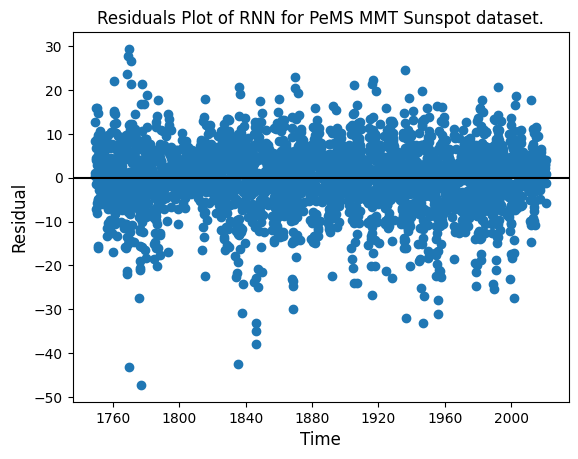

In [ ]:
actual_arr_RNN = np.array(results_RNN['Actual'])
predicted_arr_RNN = np.array(results_RNN['Predicted'])
residuals_RNN = predicted_arr_RNN - actual_arr_RNN
plt.scatter(results_RNN['Date'], residuals_RNN)
plt.axhline(y=0, color = 'black')
plt.title("Residuals Plot of RNN for PeMS {} dataset.".format(feature_field))
#plt.locator_params(axis='x', nbins=10)
#plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel("Time", fontsize = 12)
plt.ylabel("Residual", fontsize = 12)
plt.show()

In [ ]:
rnn_energy_results = measure_ann_energy(rnn_model, X_test,
                                        model_name_str='RNN Model')

Measuring inference time and estimating energy on CPU (for ANN)...
  CPU Inference Time: 0.1969 seconds
  Estimated CPU Energy: 15.7535 Joules (15753517.1509 µJ)

No GPU available. GPU measurements skipped.


From the residual plots for the RNN model, it can be concluded that the RNN model is a good fit.

## LSTM model

### Create LSTM Model.

In [ ]:
lstm_model = Sequential()

#lstm_model.add(LSTM(unit,activation=activation,return_sequences=True,
#                    input_shape=(X_train.shape[1],1)))
#lstm_model.add(Dropout(0.5))

lstm_model.add(LSTM(unit,activation=activation,return_sequences=True,
                    input_shape=(100,1)))
lstm_model.add(Dropout(0.5))

#lstm_model.add(LSTM(unit,activation="sigmoid",return_sequences=True))
#lstm_model.add(Dropout(0.5))

lstm_model.add(LSTM(unit,activation=activation,return_sequences=False))
lstm_model.add(Dropout(0.5))

lstm_model.add(Dense(1))

lstm_model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 100, 32)        │         4,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 100, 32)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 32)             │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 12,705 (49.63 KB)

 Trainable params: 12,705 (49.63 KB)

 Non-trainable params: 0 (0.00 B)

### Train LSTM Model.

Epoch 1/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.0146
Epoch 2/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0093
Epoch 3/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0086
Epoch 4/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0075
Epoch 5/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0071
Epoch 6/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0066
Epoch 7/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0066
Epoch 8/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0063
Epoch 9/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0063
Epoch 10/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0062


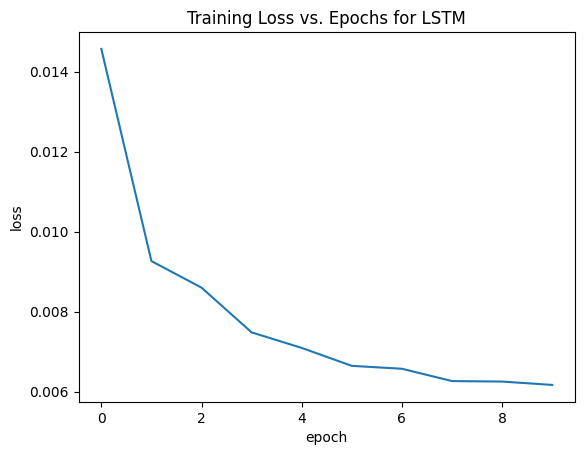

In [ ]:
lstm_model.compile(optimizer="adam",loss=loss)
lstm_epochs = lstm_model.fit(X_train, y_train, epochs=epochs,
                             batch_size=batch_size)
plot_training_loss(lstm_epochs, "LSTM")

### Evaluate LSTM model using MAE, RMSE, and R^2.

In [ ]:
print("LSTM Predictions for Training Set")
lstm_pred_train = lstm_model.predict(X_train)
print("LSTM Predictions for Testing Set")
lstm_pred_test = lstm_model.predict(X_test)
lstm_mae = mean_absolute_error(y_test,lstm_pred_test)
print("MAE of LSTM model = ",lstm_mae)
lstm_rmse =  mean_squared_error(y_test,lstm_pred_test) ** 0.5
print("RMSE of LSTM model = ",lstm_rmse)
lstm_r2_score = r2_score(y_test, lstm_pred_test)
print("R^2 Score of LSTM model = ",lstm_r2_score)
lstm_mape_score = mean_absolute_percentage_error(y_test,lstm_pred_test)
print("MAPE Score of LSTM model = {0} %".format(lstm_mape_score))
lstm_smape_score = 100* symmetric_mean_absolute_percentage_error(y_test,
                                                                 lstm_pred_test)
print("sMAPE Score of LSTM model = {0} %".format(lstm_smape_score))

LSTM Predictions for Training Set
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
LSTM Predictions for Testing Set
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
MAE of LSTM model =  0.045625953406754
RMSE of LSTM model =  0.06352217844102499
R^2 Score of LSTM model =  0.8686637124007554
MAPE Score of LSTM model = 96665282777.51593 %
sMAPE Score of LSTM model = 9710.394889657724 %


In [ ]:
perform_statistical_tests(y_test, lstm_pred_test, "LSTM")


--- Statistical Tests for LSTM ---
Paired t-test could not be performed: name 'scipy' is not defined
Wilcoxon Signed-Rank Test could not be performed: name 'scipy' is not defined


### Calculate 95% Confidence Intervals for LSTM MAE and RMSE

In [ ]:
lstm_mae_ci_lower, lstm_mae_ci_upper = calculate_bootstrap_ci(y_test, lstm_pred_test.flatten(), mean_absolute_error)
print(f"LSTM MAE 95% CI: [{lstm_mae_ci_lower:.4f}, {lstm_mae_ci_upper:.4f}]")

lstm_rmse_ci_lower, lstm_rmse_ci_upper = calculate_bootstrap_ci(y_test, lstm_pred_test.flatten(), lambda yt, yp: mean_squared_error(yt, yp)**0.5)
print(f"LSTM RMSE 95% CI: [{lstm_rmse_ci_lower:.4f}, {lstm_rmse_ci_upper:.4f}]")

LSTM MAE 95% CI: [0.0422, 0.0493]
LSTM RMSE 95% CI: [0.0586, 0.0681]


### Reverse Transform Scaler to Convert to Real Values.

In [ ]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
lstm_predictions_inv_train = scaler.inverse_transform(lstm_pred_train)
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
lstm_predictions_inv_test = scaler.inverse_transform(lstm_pred_test)

# Get values after inverse transformation
y_train_inverse = y_train_inverse.flatten()
lstm_predictions_inv_train = lstm_predictions_inv_train.flatten()
y_test_inverse = y_test_inverse.flatten()
lstm_predictions_inv_test = lstm_predictions_inv_test.flatten()

### Show Actual and Predicted y values as Dataframes.

#### With Training Dates.

In [ ]:
results_LSTM_train = pd.DataFrame({"Date":first_6169_index_dates,
                                   'Actual': y_train_inverse,
                                   'Predicted': lstm_predictions_inv_train})
results_LSTM_train

,Date,Actual,Predicted
0,1749-01-31,166.046459,163.346405
1,1749-02-28,153.591035,163.459793
2,1749-03-31,152.418759,162.103577
3,1749-04-30,158.338749,159.948471
4,1749-05-31,155.701130,158.065826
...,...,...,...
2607,1966-04-30,173.959317,157.799286
2608,1966-05-31,172.054370,159.267761
2609,1966-06-30,167.951406,161.219238
2610,1966-07-31,159.745480,162.830719


#### With Testing Dates.


In [ ]:
results_LSTM_test = pd.DataFrame({"Date":last_6169_index_dates,
                             'Actual': y_test_inverse,
                             'Predicted': lstm_predictions_inv_test})
results_LSTM_test

,Date,Actual,Predicted
0,1968-05-31,174.252386,162.332245
1,1968-06-30,167.277348,162.825348
2,1968-07-31,161.415972,163.249832
3,1968-08-31,166.867052,162.965164
4,1968-09-30,170.149422,162.927628
...,...,...,...
628,2020-09-30,121.675841,123.560898
629,2020-10-31,125.720191,123.685608
630,2020-11-30,131.464340,124.068329
631,2020-12-31,127.888900,125.249298


### Plotting Predictions for PeMS Dataset Output made by LSTM Model.

#### Only Test Data.


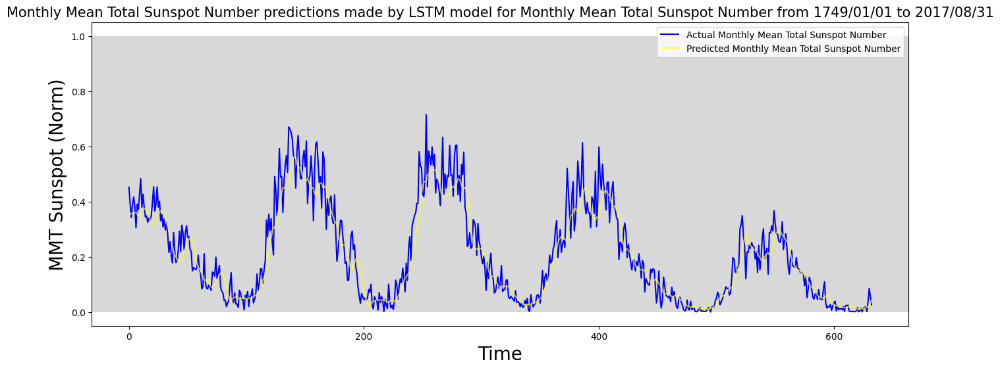

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(lstm_pred_test, alpha=0.7, color='yellow',
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} predictions made by LSTM model for {1}".
          format(feature, title_name), fontsize = 15)
plt.locator_params(axis='x', nbins=5)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.rc('xtick', labelsize=15)
plt.rc('ytick', labelsize=15)
plt.xlabel('Time', fontsize = 20)
plt.ylabel(feature_norm, fontsize = 20)
plt.legend()
plt.show()

#### Training and Testing Data combined.

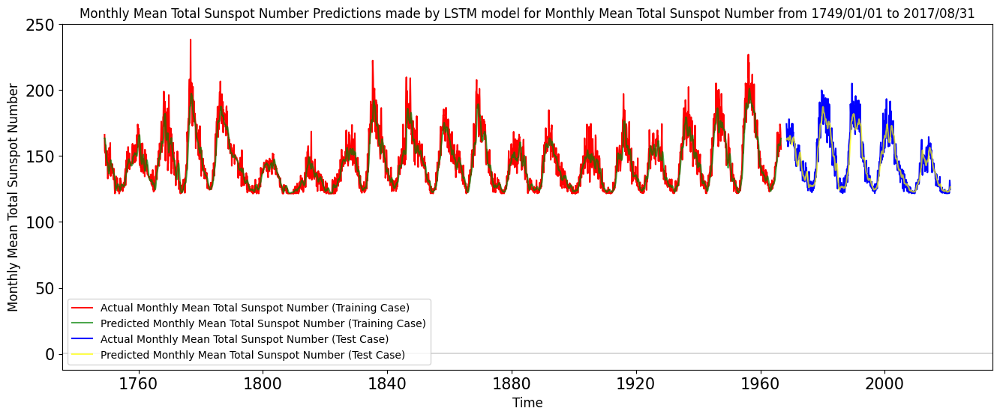

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(results_LSTM_train['Date'], results_LSTM_train['Actual'], color='red',
         label='Actual {0} (Training Case)'.format(feature))
plt.plot(results_LSTM_train['Date'],  results_LSTM_train['Predicted'], alpha=0.7,
         color='green', label='Predicted {0} (Training Case)'.format(feature))
plt.plot(results_LSTM_test['Date'], results_LSTM_test['Actual'], color='blue',
         label='Actual {0} (Test Case)'.format(feature))
plt.plot(results_LSTM_test['Date'], results_LSTM_test['Predicted'], alpha=0.7,
         color='yellow', label='Predicted {0} (Test Case)'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by LSTM model for {1}".
          format(feature, title_name))
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 12)
plt.ylabel(feature, fontsize = 12)
plt.legend()
plt.show()

### Combine Actual and Predicted Results for Train and Test Cases for LSTM.

In [ ]:
results_LSTM = [results_LSTM_train, results_LSTM_test]
results_LSTM = pd.concat(results_LSTM)
display(results_LSTM)

,Date,Actual,Predicted
0,1749-01-31,166.046459,163.346405
1,1749-02-28,153.591035,163.459793
2,1749-03-31,152.418759,162.103577
3,1749-04-30,158.338749,159.948471
4,1749-05-31,155.701130,158.065826
...,...,...,...
628,2020-09-30,121.675841,123.560898
629,2020-10-31,125.720191,123.685608
630,2020-11-30,131.464340,124.068329
631,2020-12-31,127.888900,125.249298


### Plotting Residuals for Actual and Predicted Results for LSTM.

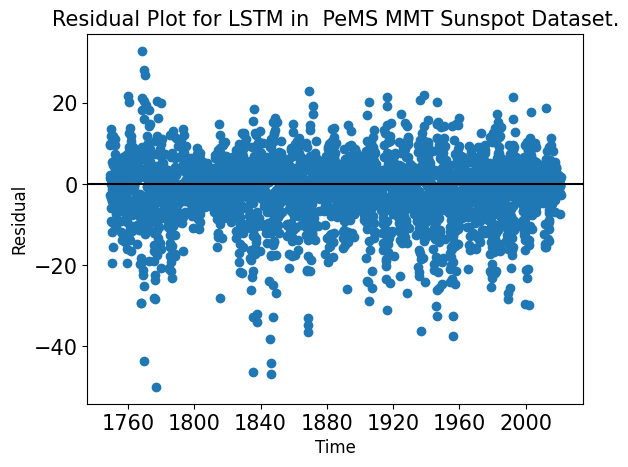

In [ ]:
actual_arr_LSTM = np.array(results_LSTM['Actual'])
predicted_arr_LSTM = np.array(results_LSTM['Predicted'])
residuals_LSTM = predicted_arr_LSTM - actual_arr_LSTM
plt.scatter(results_LSTM['Date'], residuals_LSTM)
plt.axhline(y=0, color = 'black')
plt.title("Residual Plot for LSTM in  PeMS {} Dataset.".format(feature_field),
          fontsize = 15)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)
plt.locator_params(axis='x', nbins=5)
plt.locator_params(axis='y', nbins=5)
#plt.ylim([40, 70])
plt.xlabel("Time", fontsize = 12)
plt.ylabel("Residual", fontsize = 12)
plt.show()

From the residual plots for the LSTM model, it can be concluded that the LSTM model is a good fit.

### Energy Consumption

In [ ]:
start_time = time.time()
# Run inference or training with your rnn_model here
end_time = time.time()
execution_time = end_time - start_time
print("Model execution time:", execution_time, "seconds")
lstm_energy_results = measure_ann_energy(lstm_model, X_test, 'LSTM Model')

Model execution time: 5.3882598876953125e-05 seconds
Measuring inference time and estimating energy on CPU (for ANN)...
  CPU Inference Time: 0.1735 seconds
  Estimated CPU Energy: 13.8774 Joules (13877372.7417 µJ)

No GPU available. GPU measurements skipped.


## GRU Model

### Create GRU Model.

In [ ]:
gru_model = Sequential()

gru_model.add(GRU(unit,activation=activation,return_sequences=True,
                  input_shape=(X_train.shape[1],1)))
gru_model.add(Dropout(0.5))

#gru_model.add(GRU(32,activation="sigmoid",return_sequences=True))
#gru_model.add(Dropout(0.5))

gru_model.add(GRU(unit,activation=activation,return_sequences=False))
gru_model.add(Dropout(0.5))

gru_model.add(Dense(1))

gru_model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ gru (GRU)                       │ (None, 20, 32)         │         3,360 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 20, 32)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_1 (GRU)                     │ (None, 32)             │         6,336 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 9,729 (38.00 KB)

 Trainable params: 9,729 (38.00 KB)

 Non-trainable params: 0 (0.00 B)

### Train GRU Model.

Epoch 1/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0148
Epoch 2/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0078
Epoch 3/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0069
Epoch 4/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.0069
Epoch 5/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0070
Epoch 6/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0064
Epoch 7/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0064
Epoch 8/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0061
Epoch 9/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0061
Epoch 10/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0056


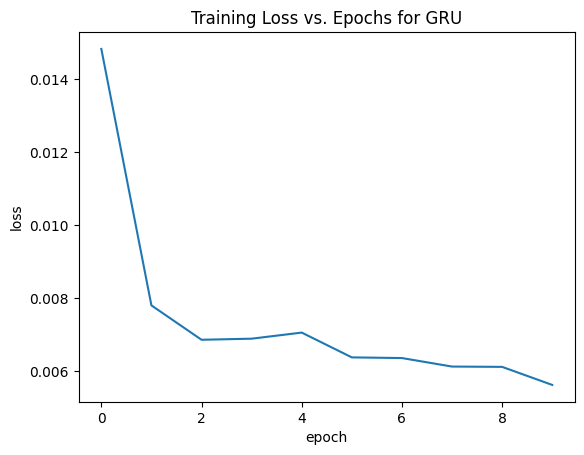

In [ ]:
gru_model.compile(optimizer="adam",loss=loss)
gru_epochs = gru_model.fit(X_train, y_train, epochs=epochs,
                           batch_size=batch_size)
plot_training_loss(gru_epochs, "GRU")

### Evaluate GRU model using MAE, RMSE, and R^2.

In [ ]:
print("GRU Predictions for Training Set")
gru_pred_train = gru_model.predict(X_train)
print("GRU Predictions for Testing Set")
gru_pred_test = gru_model.predict(X_test)
gru_mae = mean_absolute_error(y_test,gru_pred_test)
print("MAE of GRU model = ",gru_mae)
gru_rmse =  mean_squared_error(y_test,gru_pred_test) ** 0.5
print("RMSE of GRU model = ",gru_rmse)
gru_r2_score = r2_score(y_test, gru_pred_test)
print("R^2 Score of GRU model = ",gru_r2_score)
gru_mape_score = 100*mean_absolute_percentage_error(y_test, gru_pred_test)
print("MAPE Score of GRU model = {0} %".format(gru_mape_score))
gru_smape_score = 100* symmetric_mean_absolute_percentage_error(y_test,
                                                                gru_pred_test)
print("sMAPE Score of GRU model = {0} %".format(gru_smape_score))

GRU Predictions for Training Set
82/82 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step
GRU Predictions for Testing Set
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
MAE of GRU model =  0.043330942718337706
RMSE of GRU model =  0.0599265875266164
R^2 Score of GRU model =  0.8831111556300368
MAPE Score of GRU model = 15671096534594.074 %
sMAPE Score of GRU model = 9531.948087104094 %


In [ ]:
perform_statistical_tests(y_test, gru_pred_test, "GRU")


--- Statistical Tests for GRU ---
Paired t-test could not be performed: name 'scipy' is not defined
Wilcoxon Signed-Rank Test could not be performed: name 'scipy' is not defined


### Calculate 95% Confidence Intervals for GRU MAE and RMSE

In [ ]:
gru_mae_ci_lower, gru_mae_ci_upper = calculate_bootstrap_ci(y_test, gru_pred_test.flatten(), mean_absolute_error)
print(f"GRU MAE 95% CI: [{gru_mae_ci_lower:.4f}, {gru_mae_ci_upper:.4f}]")

gru_rmse_ci_lower, gru_rmse_ci_upper = calculate_bootstrap_ci(y_test, gru_pred_test.flatten(), lambda yt, yp: mean_squared_error(yt, yp)**0.5)
print(f"GRU RMSE 95% CI: [{gru_rmse_ci_lower:.4f}, {gru_rmse_ci_upper:.4f}]")

GRU MAE 95% CI: [0.0400, 0.0465]
GRU RMSE 95% CI: [0.0546, 0.0644]


### Reverse transform scaler to convert to real values.

In [ ]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
gru_pred_inv_train = scaler.inverse_transform(gru_pred_train)
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
gru_pred_inv_test = scaler.inverse_transform(gru_pred_test)

# Get values after inverse transformation
y_train_inverse = y_train_inverse.flatten()
gru_pred_inv_train = gru_pred_inv_train.flatten()
y_test_inverse = y_test_inverse.flatten()
gru_pred_inv_test = gru_pred_inv_test.flatten()

### Showing Actual y and Predicted y values as Dataframes.

#### With Training Dates.

In [ ]:
results_GRU_train = pd.DataFrame({"Date":first_6169_index_dates,
                            'Actual': y_train_inverse,
                            'Predicted': gru_pred_inv_train})
results_GRU_train

,Date,Actual,Predicted
0,1749-01-31,166.046459,165.254105
1,1749-02-28,153.591035,164.505096
2,1749-03-31,152.418759,159.159302
3,1749-04-30,158.338749,155.492828
4,1749-05-31,155.701130,155.734619
...,...,...,...
2607,1966-04-30,173.959317,157.001526
2608,1966-05-31,172.054370,162.872574
2609,1966-06-30,167.951406,165.609375
2610,1966-07-31,159.745480,165.452759


#### With Testing Dates.

In [ ]:
results_GRU_test = pd.DataFrame({"Date":last_6169_index_dates,
                            'Actual': y_test_inverse,
                            'Predicted': gru_pred_inv_test})
results_GRU_test

,Date,Actual,Predicted
0,1968-05-31,174.252386,158.343643
1,1968-06-30,167.277348,163.554169
2,1968-07-31,161.415972,164.109024
3,1968-08-31,166.867052,161.988586
4,1968-09-30,170.149422,162.818481
...,...,...,...
628,2020-09-30,121.675841,124.430565
629,2020-10-31,125.720191,123.869530
630,2020-11-30,131.464340,125.000809
631,2020-12-31,127.888900,127.962776


### Plotting Predictions for Q/VMT/VHT made by GRU Model.

#### Testing Data Only.

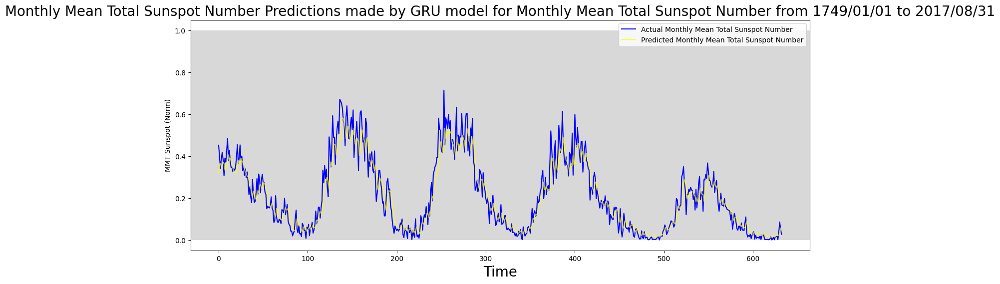

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(gru_pred_test, alpha=0.7, color='yellow',
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by GRU model for {1}".
          format(feature, title_name), fontsize = 20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 20)
plt.ylabel(feature_norm, fontsize = 10)
plt.legend()
plt.show()

#### Training and Test Data Combined.

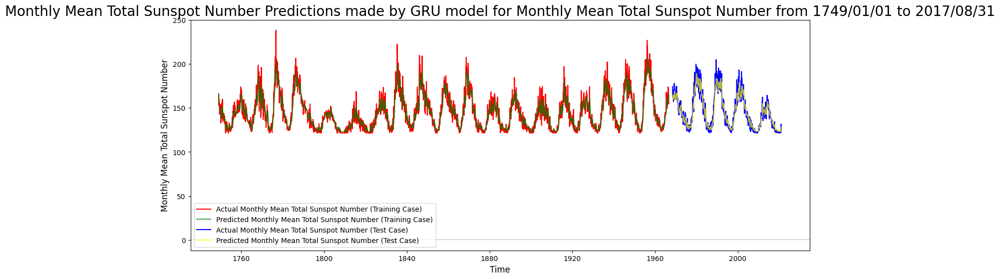

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(results_GRU_train['Date'], results_GRU_train['Actual'], color='red',
         label='Actual {0} (Training Case)'.format(feature))
plt.plot(results_GRU_train['Date'],  results_GRU_train['Predicted'], alpha=0.7,
         color='green', label='Predicted {0} (Training Case)'.format(feature))
plt.plot(results_GRU_test['Date'], results_GRU_test['Actual'], color='blue',
         label='Actual {0} (Test Case)'.format(feature))
plt.plot(results_GRU_test['Date'], results_GRU_test['Predicted'], alpha=0.7,
         color='yellow', label='Predicted {0} (Test Case)'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by GRU model for {1}".
          format(feature, title_name), fontsize = 20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 12)
plt.ylabel(feature, fontsize = 12)
plt.legend()
plt.show()

### Combine Actual and Predicted Results for Train and Test Cases for GRU.

In [ ]:
results_GRU = [results_GRU_train, results_GRU_test]
results_GRU = pd.concat(results_GRU)
display(results_GRU)

,Date,Actual,Predicted
0,1749-01-31,166.046459,165.254105
1,1749-02-28,153.591035,164.505096
2,1749-03-31,152.418759,159.159302
3,1749-04-30,158.338749,155.492828
4,1749-05-31,155.701130,155.734619
...,...,...,...
628,2020-09-30,121.675841,124.430565
629,2020-10-31,125.720191,123.869530
630,2020-11-30,131.464340,125.000809
631,2020-12-31,127.888900,127.962776


### Plotting Residuals for Actual and Predicted Results for GRU.

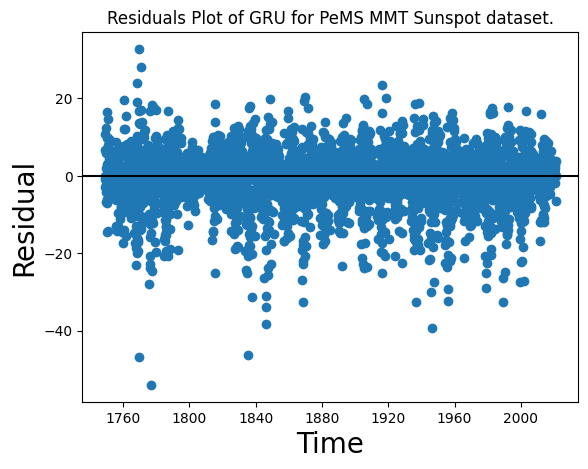

In [ ]:
# Plotting Residuals for Actual and Predicted Results for GRU.
actual_arr_GRU = np.array(results_GRU['Actual'])
predicted_arr_GRU = np.array(results_GRU['Predicted'])
residuals_GRU = predicted_arr_GRU - actual_arr_GRU
plt.scatter(results_GRU['Date'], residuals_GRU)
plt.axhline(y=0, color = 'black')
plt.title("Residuals Plot of GRU for PeMS {} dataset.".format(feature_field))
#plt.locator_params(axis='x', nbins=10)
#plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel("Time", fontsize = 20)
plt.ylabel("Residual", fontsize = 20)
plt.show()

From the residual plots for the GRU model, it can be concluded that the GRU model is a good fit.

### Energy Consumption

In [ ]:
start_time = time.time()
# Run inference or training with your rnn_model here
end_time = time.time()
execution_time = end_time - start_time
print("Model execution time:", execution_time, "seconds")
gru_energy_results = measure_ann_energy(gru_model, X_test, "GRU_Model")

Model execution time: 0.00011205673217773438 seconds
Measuring inference time and estimating energy on CPU (for ANN)...
  CPU Inference Time: 0.1983 seconds
  Estimated CPU Energy: 15.8653 Joules (15865306.8542 µJ)

No GPU available. GPU measurements skipped.


## CNN (Conv1D) model

### Create CNN Model.

In [ ]:
cnn_model = Sequential()

cnn_model.add(Conv1D(filters=filter, kernel_size=kernel, activation=activation,
                     input_shape=(seq_len, X_train.shape[2])))
cnn_model.add(MaxPooling1D(pool_size=2))

cnn_model.add(Conv1D(filters=filter, kernel_size=kernel, activation=activation,
                     input_shape=(seq_len, X_train.shape[2])))
cnn_model.add(MaxPooling1D(pool_size=2))

cnn_model.add(Flatten())
cnn_model.add(Dense(50, activation=activation))
cnn_model.add(Dense(1))
cnn_model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                 │ (None, 18, 32)         │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d (MaxPooling1D)    │ (None, 9, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_1 (Conv1D)               │ (None, 7, 32)          │         3,104 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_1 (MaxPooling1D)  │ (None, 3, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 96)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 50)             │         4,850 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,133 (31.77 KB)

 Trainable params: 8,133 (31.77 KB)

 Non-trainable params: 0 (0.00 B)

### Train CNN model.

Epoch 1/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.0104
Epoch 2/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0067
Epoch 3/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0062
Epoch 4/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0062
Epoch 5/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0059
Epoch 6/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0059
Epoch 7/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0059
Epoch 8/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0057
Epoch 9/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0057
Epoch 10/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0058


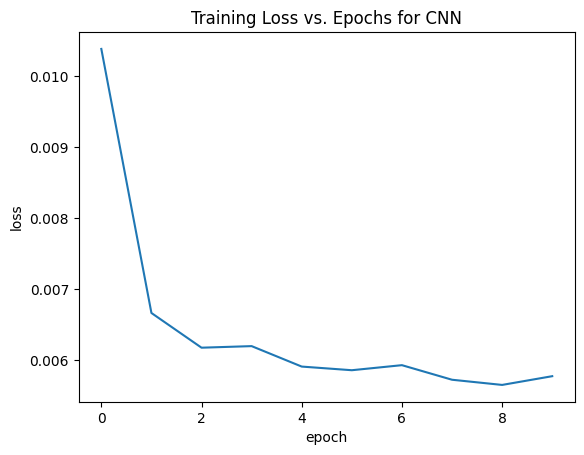

In [ ]:
cnn_model.compile(optimizer='adam', loss='mse')
cnn_epochs = cnn_model.fit(X_train, y_train, epochs=epochs,
                           batch_size=batch_size)
plot_training_loss(cnn_epochs, "CNN")

### Evaluate CNN model using MAE, RMSE, and R^2.

In [ ]:
print("CNN Predictions for Training Set")
cnn_pred_train = cnn_model.predict(X_train)
print("CNN Predictions for Testing Set")
cnn_pred_test = cnn_model.predict(X_test)
cnn_mae = mean_absolute_error(y_test,cnn_pred_test)
print("MAE of CNN model = ",cnn_mae)
cnn_rmse =  mean_squared_error(y_test,cnn_pred_test) ** 0.5
print("RMSE of CNN model = ",cnn_rmse)
cnn_r2_score = r2_score(y_test, cnn_pred_test)
print("R^2 Score of CNN model = ",cnn_r2_score)
cnn_mape_score = 100*mean_absolute_percentage_error(y_test, cnn_pred_test)
print("MAPE Score of CNN model = {0} %".format(cnn_mape_score))
cnn_smape_score = 100* symmetric_mean_absolute_percentage_error(y_test,
                                                                cnn_pred_test)
print("sMAPE Score of CNN model = {0} %".format(cnn_smape_score))

CNN Predictions for Training Set
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
CNN Predictions for Testing Set
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
MAE of CNN model =  0.05001943831394191
RMSE of CNN model =  0.06757403714474268
R^2 Score of CNN model =  0.8513743723399205
MAPE Score of CNN model = 12800251159316.273 %
sMAPE Score of CNN model = 9667.598687153559 %


In [ ]:
perform_statistical_tests(y_test, cnn_pred_test, "CNN")


--- Statistical Tests for CNN ---
Paired t-test could not be performed: name 'scipy' is not defined
Wilcoxon Signed-Rank Test could not be performed: name 'scipy' is not defined


### Calculate 95% Confidence Intervals for CNN MAE and RMSE

In [ ]:
cnn_mae_ci_lower, cnn_mae_ci_upper = calculate_bootstrap_ci(y_test, cnn_pred_test.flatten(), mean_absolute_error)
print(f"CNN MAE 95% CI: [{cnn_mae_ci_lower:.4f}, {cnn_mae_ci_upper:.4f}]")

cnn_rmse_ci_lower, cnn_rmse_ci_upper = calculate_bootstrap_ci(y_test, cnn_pred_test.flatten(), lambda yt, yp: mean_squared_error(yt, yp)**0.5)
print(f"CNN RMSE 95% CI: [{cnn_rmse_ci_lower:.4f}, {cnn_rmse_ci_upper:.4f}]")

CNN MAE 95% CI: [0.0464, 0.0534]
CNN RMSE 95% CI: [0.0629, 0.0721]


### Reverse transform scaler to convert to real values.

In [ ]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
cnn_pred_inv_train = scaler.inverse_transform(cnn_pred_train)
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
cnn_pred_inv_test = scaler.inverse_transform(cnn_pred_test)

# Get values after inverse transformation
y_train_inverse = y_train_inverse.flatten()
cnn_pred_inv_train = cnn_pred_inv_train.flatten()
y_test_inverse = y_test_inverse.flatten()
cnn_pred_inv_test = cnn_pred_inv_test.flatten()

### Showing Actual y and Predicted y values as Dataframes.

#### With Training Dates.

In [ ]:
results_CNN_train = pd.DataFrame({"Date":first_6169_index_dates,
                                 'Actual': y_train_inverse,
                                 'Predicted': cnn_pred_inv_train})
results_CNN_train

,Date,Actual,Predicted
0,1749-01-31,166.046459,170.971573
1,1749-02-28,153.591035,168.539948
2,1749-03-31,152.418759,167.904739
3,1749-04-30,158.338749,166.116028
4,1749-05-31,155.701130,160.751801
...,...,...,...
2607,1966-04-30,173.959317,163.831467
2608,1966-05-31,172.054370,164.038940
2609,1966-06-30,167.951406,163.265976
2610,1966-07-31,159.745480,166.247620


#### With Testing Dates.

In [ ]:
results_CNN_test = pd.DataFrame({"Date":last_6169_index_dates,
                                 'Actual': y_test_inverse,
                                 'Predicted': cnn_pred_inv_test})
results_CNN_test

,Date,Actual,Predicted
0,1968-05-31,174.252386,171.441879
1,1968-06-30,167.277348,165.808304
2,1968-07-31,161.415972,161.200882
3,1968-08-31,166.867052,162.958588
4,1968-09-30,170.149422,163.354233
...,...,...,...
628,2020-09-30,121.675841,124.384224
629,2020-10-31,125.720191,124.636330
630,2020-11-30,131.464340,124.993279
631,2020-12-31,127.888900,124.793533


### Plotting Predictions for Q/VHT/VMT made by CNN Model.

#### Only Testing Data.

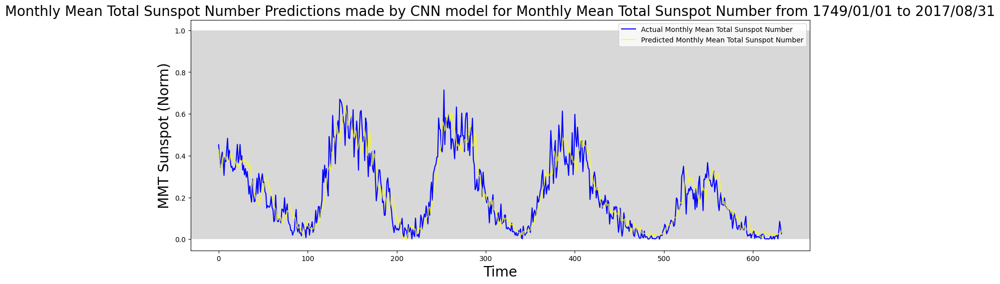

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(cnn_pred_test, alpha=0.7, color='yellow',
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by CNN model for {1}".
          format(feature, title_name), fontsize = 20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 20)
plt.ylabel(feature_norm, fontsize = 20)
plt.legend()
plt.show()

#### Training and Test Data Combined.

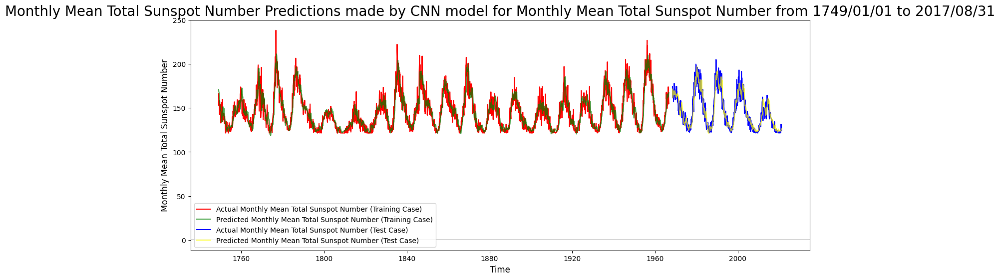

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(results_CNN_train['Date'], results_CNN_train['Actual'], color='red',
         label='Actual {0} (Training Case)'.format(feature))
plt.plot(results_CNN_train['Date'],  results_CNN_train['Predicted'], alpha=0.7,
         color='green', label='Predicted {0} (Training Case)'.format(feature))
plt.plot(results_CNN_test['Date'], results_CNN_test['Actual'], color='blue',
         label='Actual {0} (Test Case)'.format(feature))
plt.plot(results_CNN_test['Date'], results_CNN_test['Predicted'], alpha=0.7,
         color='yellow', label='Predicted {0} (Test Case)'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by CNN model for {1}".
          format(feature, title_name), fontsize = 20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 12)
plt.ylabel(feature, fontsize = 12)
plt.legend()
plt.show()

### Combine Actual and Predicted Results for Train and Test Cases for CNN.

In [ ]:
results_CNN = [results_CNN_train, results_CNN_test]
results_CNN = pd.concat(results_CNN)
display(results_CNN)

,Date,Actual,Predicted
0,1749-01-31,166.046459,170.971573
1,1749-02-28,153.591035,168.539948
2,1749-03-31,152.418759,167.904739
3,1749-04-30,158.338749,166.116028
4,1749-05-31,155.701130,160.751801
...,...,...,...
628,2020-09-30,121.675841,124.384224
629,2020-10-31,125.720191,124.636330
630,2020-11-30,131.464340,124.993279
631,2020-12-31,127.888900,124.793533


### Plotting Residuals for Actual and Predicted Results for CNN.

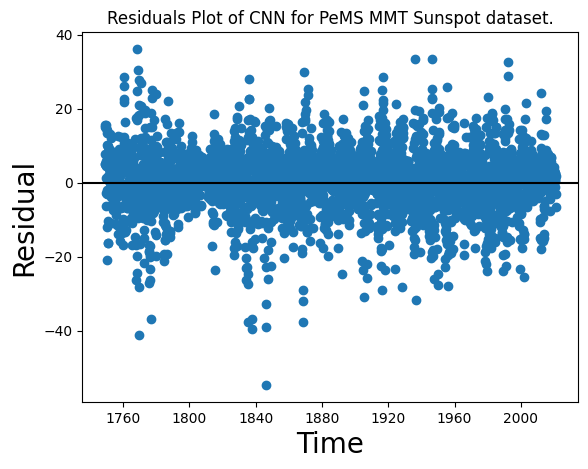

In [ ]:
actual_arr_CNN = np.array(results_CNN['Actual'])
predicted_arr_CNN = np.array(results_CNN['Predicted'])
residuals_CNN = predicted_arr_CNN - actual_arr_CNN
plt.scatter(results_CNN['Date'], residuals_CNN)
plt.axhline(y=0, color = 'black')
plt.title("Residuals Plot of CNN for PeMS {} dataset.".format(feature_field))
#plt.locator_params(axis='x', nbins=10)
#plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel("Time", fontsize = 20)
plt.ylabel("Residual", fontsize = 20)
plt.show()

From the residual plots for the CNN model, it can be concluded that the CNN model is a good fit.

### Energy Consumption

In [ ]:
start_time = time.time()
# Run inference or training with your rnn_model here
end_time = time.time()
execution_time = end_time - start_time
print("Model execution time:", execution_time, "seconds")
cnn_model_energy_results = measure_ann_energy(cnn_model, X_test,
                                              model_name_str='CNN Model')

Model execution time: 0.00010967254638671875 seconds
Measuring inference time and estimating energy on CPU (for ANN)...
  CPU Inference Time: 0.1763 seconds
  Estimated CPU Energy: 14.1002 Joules (14100208.2825 µJ)

No GPU available. GPU measurements skipped.


# Spiking Network Models

## Create SNN Model.

### Spiking Activation Layer

In [ ]:
@keras.saving.register_keras_serializable()
class SpikingActivationCell(tf.keras.layers.Layer):
    def __init__(self, units, activation='tanh', threshold=1.0, dt=1.0, spiking_aware_training=False, **kwargs):
        super(SpikingActivationCell, self).__init__(**kwargs)
        self.units = units # This is the number of features/neurons for this cell
        self.activation = activation
        self.threshold = threshold
        self.dt = dt
        self.spiking_aware_training = spiking_aware_training
        self.membrane_potential = None
        # state_size must be set in __init__ for tf.keras.layers.RNN
        self.state_size = self.units # Each neuron has one scalar membrane potential state

    def build(self, input_shape):
        # input_shape should be (batch_size, timesteps, self.units) -> cell receives (batch_size, self.units)
        if input_shape[-1] != self.units:
             raise ValueError(f"Input feature size ({input_shape[-1]}) does not match "
                              f"declared units ({self.units}) for SpikingActivationCell.")

        self.membrane_potential = self.add_weight(
            name='membrane_potential',
            shape=(self.units,),  # Membrane potential for all neurons in this layer
            initializer='zeros',
            trainable=False
        )
        super(SpikingActivationCell, self).build(input_shape)

    def get_initial_state(self, inputs=None, batch_size=None, dtype=None):
        # Now self.units is available, so _num_features is always self.units
        _num_features = self.units
        if batch_size is None:
            # If batch_size is not provided, try to infer from inputs
            if inputs is not None:
                _batch_size = tf.shape(inputs)[0]
            else:
                raise ValueError("`batch_size` must be provided if `inputs` is None in `get_initial_state`.")
        else:
            _batch_size = batch_size

        # Use tf.float32 as default dtype if None is passed
        if dtype is None:
            dtype = tf.float32

        initial_membrane_potential = tf.zeros((_batch_size, _num_features), dtype=dtype)
        return [initial_membrane_potential]

    def call(self, inputs, states, training=None):
        # states is a list, and states[0] is the previous membrane potential
        prev_membrane_potential = states[0] # Shape: (batch_size, self.units)

        # Apply activation function
        activated_input = tf.keras.activations.get(self.activation)(inputs) # Shape: (batch_size, self.units)

        # Update membrane potential
        membrane_potential = prev_membrane_potential + activated_input * self.dt

        # Generate spikes based on threshold
        if training and self.spiking_aware_training:
            @tf.custom_gradient
            def surrogate_spike(x):
                spike = tf.where(x >= self.threshold, tf.ones_like(x), tf.zeros_like(x))
                def grad(dy):
                    # Simple Straight-Through Estimator
                    return dy
                return spike, grad
            spikes = surrogate_spike(membrane_potential)
        else:
            spikes = tf.cast(membrane_potential >= self.threshold, dtype=tf.float32)

        # Reset membrane potential after spike
        membrane_potential = membrane_potential - spikes * self.threshold

        # Return the spikes as output and the updated membrane potential as the new state
        return spikes, [membrane_potential]

    def get_config(self):
        config = super().get_config()
        config.update({
            "units": self.units,
            "activation": self.activation,
            "threshold": self.threshold,
            "dt": self.dt,
            "spiking_aware_training": self.spiking_aware_training,
        })
        return config

@keras.saving.register_keras_serializable()
class SpikingActivationLayer(tf.keras.layers.RNN):
    def __init__(self, units, activation='tanh', threshold=1.0, dt=1.0,
                 spiking_aware_training=False, **kwargs):
        cell = SpikingActivationCell(units=units, activation=activation,
                                     threshold=threshold, dt=dt,
                                     spiking_aware_training=spiking_aware_training)
        super(SpikingActivationLayer, self).__init__(cell=cell, **kwargs)
        self.return_sequences = kwargs.get('return_sequences', False)
        self.units = units # Keep units attribute on the layer as well

    def call(self, inputs, initial_state=None, training=None, **kwargs):
        return super(SpikingActivationLayer, self).call(
            inputs, initial_state=initial_state, training=training, **kwargs
        )

    def compute_output_shape(self, input_shape):
        # input_shape will be (batch_size, timesteps, features_from_prev_layer)
        if self.return_sequences:
            # If return_sequences is True, the output shape includes the time dimension
            # The last dimension will be self.units
            return (input_shape[0], input_shape[1], self.units)
        else:
            # If return_sequences is False, the output shape is (batch_size, self.units)
            return (input_shape[0], self.units)

    def build(self, input_shape):
        super(SpikingActivationLayer, self).build(input_shape)

    def get_config(self):
        config = super().get_config()
        # Remove the 'cell' entry that the base RNN class's get_config adds,
        # as this layer directly constructs and passes its cell.
        config.pop('cell', None)
        config.update({
            "units": self.units,
            "activation": self.cell.activation,
            "threshold": self.cell.threshold,
            "dt": self.cell.dt,
            "spiking_aware_training": self.cell.spiking_aware_training,
            "return_sequences": self.return_sequences,
        })
        return config

In [ ]:
@keras.saving.register_keras_serializable()
class SpikingActivationCell2(tf.keras.layers.Layer):
    def __init__(self, units, threshold=1.0, dt=1.0, spiking_aware_training=False, **kwargs):
        super().__init__(**kwargs)
        self.units = units
        self.threshold = threshold
        self.dt = dt
        self.spiking_aware_training = spiking_aware_training
        self.state_size = units

    def get_initial_state(self, inputs=None, batch_size=None, dtype=None):
        return [tf.zeros((batch_size, self.units), dtype=dtype or tf.float32)]

    def call(self, inputs, states, training=None):
        prev_v = states[0]

        # Always use tanh for stability
        I = tf.math.tanh(inputs)

        # Membrane update
        v = prev_v + self.dt * I

        # Surrogate gradient spike
        if training and self.spiking_aware_training:
            @tf.custom_gradient
            def spike_fn(x):
                spike = tf.where(x >= self.threshold, 1.0, 0.0)
                def grad(dy):
                    # finite window surrogate
                    return dy * tf.where(tf.abs(x - self.threshold) < 0.5, 1.0, 0.0)
                return spike, grad
            spikes = spike_fn(v)
        else:
            spikes = tf.cast(v >= self.threshold, tf.float32)

        # Reset
        v = tf.where(spikes > 0, v - self.threshold, v)

        return spikes, [v]

@keras.saving.register_keras_serializable()
class SpikingActivationLayer2(tf.keras.layers.RNN):
    def __init__(self, units, activation='tanh', threshold=1.0, dt=1.0,
                 spiking_aware_training=False, **kwargs):
        cell = SpikingActivationCell2(units=units, threshold=threshold, dt=dt,
                                     spiking_aware_training=spiking_aware_training)
        super(SpikingActivationLayer2, self).__init__(cell, **kwargs)
        self.return_sequences = kwargs.get('return_sequences', False)
        self.units = units # Keep units attribute on the layer as well

    def call(self, inputs, initial_state=None, training=None, **kwargs):
        return super(SpikingActivationLayer2, self).call(
            inputs, initial_state=initial_state, training=training, **kwargs
        )

    def compute_output_shape(self, input_shape):
        # input_shape will be (batch_size, timesteps, features_from_prev_layer)
        if self.return_sequences:
            # If return_sequences is True, the output shape includes the time dimension
            # The last dimension will be self.units
            return (input_shape[0], input_shape[1], self.units)
        else:
            # If return_sequences is False, the output shape is (batch_size, self.units)
            return (input_shape[0], self.units)

    def build(self, input_shape):
        super(SpikingActivationLayer2, self).build(input_shape)

### Spiking Model

In [ ]:
spiking_model = tf.keras.Sequential(
    [
        # Add temporal dimension to model. For this dataset, the input_shape is
        # passed into the model.
        tf.keras.layers.Reshape((-1, X_train.shape[1]),
                                input_shape=(None, X_train.shape[1])),
        # Keras' TimeDistributed wrapper allows Dense layer to operate on
        # temporal data.
        tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(128)),
        # SpikingActivation: Function replaces any activation function with it's
        # Spiking equivalent. In addition to activation functions, the timestep
        # (dt) can be changed to run the spiking neurons for longer periods of
        # time. spiking_aware_training is set to True as it helps in the
        # regularization.
        #keras_spiking.SpikingActivation("tanh", dt = 100,
        #                                spiking_aware_training=True),
        # SpikingActivation: Function replaces any activation function with it's
        # Spiking equivalent. In addition to activation functions, the timestep
        # (dt) can be changed to run the spiking neurons for longer periods of
        # time. spiking_aware_training is set to True as it helps in the
        # regularization.
        # Instead of using the keras_spiking.SpikingActivation, we directly
        # apply the activation function using tf.keras.activations.tanh.
        # This change avoids the internal use of tf.keras.layers.RNN
        # within the SpikingActivation layer, which was causing the issue.
        SpikingActivationLayer(units=128, activation='tanh', threshold=0.7, dt=100,
                               return_sequences=True,
                               spiking_aware_training=True),
        #SpikingActivationLayer2(units=128, activation='tanh', threshold=0.7, dt=100,
        #                       return_sequences=True,
        #                       spiking_aware_training=True),
        # GlobalAveragePooling1D: Averages spiking output over time. Used for
        # determining the spiking rate of neuron.
        tf.keras.layers.GlobalAveragePooling1D(),
        tf.keras.layers.Dense(1),
    ]
)

spiking_model.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ reshape (Reshape)               │ (None, None, 20)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed                │ (None, None, 128)      │         2,688 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ spiking_activation_layer        │ (None, None, 128)      │           128 │
│ (SpikingActivationLayer)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling1d        │ (None, 128)            │             0 │
│ (GlobalAveragePooling1D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,945 (11.50 KB)

 Trainable params: 2,817 (11.00 KB)

 Non-trainable params: 128 (512.00 B)

## Train Spiking Network Model.

Epoch 1/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.1854
Epoch 2/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0940
Epoch 3/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0751
Epoch 4/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0679
Epoch 5/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0562
Epoch 6/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0437
Epoch 7/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0457
Epoch 8/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0480
Epoch 9/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0329
Epoch 10/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0344


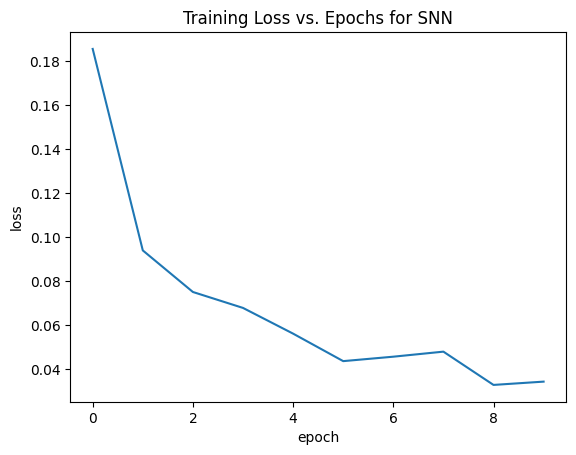

In [ ]:
spiking_model.compile(optimizer="adam",loss=loss)
spiking_model_epochs = spiking_model.fit(X_train, y_train, epochs=epochs,
                           batch_size=batch_size)
plot_training_loss(spiking_model_epochs, "SNN")

In [ ]:
print("Rate-Based SNN Predictions for Training Set")
snn_pred_train = spiking_model.predict(X_train)
print("SNN Predictions for Testing Set")
snn_pred_test = spiking_model.predict(X_test)
snn_mae = mean_absolute_error(y_test, snn_pred_test)
print("MAE of SNN model = ",snn_mae)
snn_rmse =  mean_squared_error(y_test, snn_pred_test) ** 0.5
print("RMSE of SNN model = ",snn_rmse)
#rnn_r2_score = r2_score(y_test,rnn_predictions_test)
#print("R2 Score of RNN model = ",rnn_r2_score)
snn_mape_score = 100*mean_absolute_percentage_error(y_test, snn_pred_test)
print("MAPE Score of SNN model = {0} %".format(snn_mape_score))

Rate-Based SNN Predictions for Training Set
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
SNN Predictions for Testing Set
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
MAE of SNN model =  0.12290306701782445
RMSE of SNN model =  0.1585034181124266
MAPE Score of SNN model = 140335278747633.47 %


In [ ]:
print("Rate-Based SNN Predictions for Training Set")
snn_pred_train = spiking_model.predict(X_train)
print("SNN Predictions for Testing Set")
snn_pred_test = spiking_model.predict(X_test)
snn_mae = mean_absolute_error(y_test, snn_pred_test)
print("MAE of SNN model = ",snn_mae)
snn_rmse =  mean_squared_error(y_test, snn_pred_test) ** 0.5
print("RMSE of SNN model = ",snn_rmse)
#rnn_r2_score = r2_score(y_test,rnn_predictions_test)
#print("R2 Score of RNN model = ",rnn_r2_score)
snn_mape_score = 100*mean_absolute_percentage_error(y_test, snn_pred_test)
print("MAPE Score of SNN model = {0} %".format(snn_mape_score))

Rate-Based SNN Predictions for Training Set
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
SNN Predictions for Testing Set
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
MAE of SNN model =  0.12290306701782445
RMSE of SNN model =  0.1585034181124266
MAPE Score of SNN model = 140335278747633.47 %


In [ ]:
perform_statistical_tests(y_test, snn_pred_test, "Rate-Based SNN")


--- Statistical Tests for Rate-Based SNN ---
Paired t-test could not be performed: name 'scipy' is not defined
Wilcoxon Signed-Rank Test could not be performed: name 'scipy' is not defined


## Reverse Transform Scaler to Convert to Real Values.

In [ ]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
snn_pred_inv_train = scaler.inverse_transform(snn_pred_train)

y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
snn_pred_inv_test = scaler.inverse_transform(snn_pred_test)

# Get values after inverse transformation
y_train_inverse = y_train_inverse.flatten()
snn_pred_inv_train = snn_pred_inv_train.flatten()

y_test_inverse = y_test_inverse.flatten()
snn_pred_inv_test = snn_pred_inv_test.flatten()

## Show Actual and Predicted y values as Dataframes.

### With Training Dates.

In [ ]:
first_6169_index_dates = df_entire.index[:X_train.shape[0]]
results_SNN_train = pd.DataFrame({"Date": first_6169_index_dates,
                                  'Actual': y_train_inverse,
                                  'Predicted': snn_pred_inv_train})
results_SNN_train

,Date,Actual,Predicted
0,1749-01-31,166.046459,149.295853
1,1749-02-28,153.591035,150.805069
2,1749-03-31,152.418759,147.906662
3,1749-04-30,158.338749,142.353378
4,1749-05-31,155.701130,146.344040
...,...,...,...
2607,1966-04-30,173.959317,151.441269
2608,1966-05-31,172.054370,150.477341
2609,1966-06-30,167.951406,146.938461
2610,1966-07-31,159.745480,151.096481


### With Testing Dates.

In [ ]:
last_6169_index_dates = df_entire.index[-X_test.shape[0]:]
results_SNN_test = pd.DataFrame({"Date":last_6169_index_dates,
                                 'Actual': y_test_inverse,
                                 'Predicted': snn_pred_inv_test})
results_SNN_test

,Date,Actual,Predicted
0,1968-05-31,174.252386,154.356323
1,1968-06-30,167.277348,154.028625
2,1968-07-31,161.415972,146.913940
3,1968-08-31,166.867052,146.719254
4,1968-09-30,170.149422,147.887192
...,...,...,...
628,2020-09-30,121.675841,106.108955
629,2020-10-31,125.720191,87.395332
630,2020-11-30,131.464340,96.557350
631,2020-12-31,127.888900,114.668701


## Plotting Predictions for PeMS Dataset Output made by SNN Model.

### Only Testing Data.

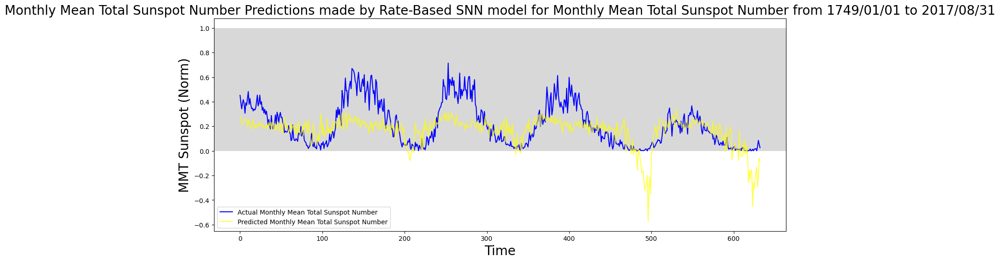

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(snn_pred_test, alpha=0.7, color='yellow',
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by Rate-Based SNN model for {1}".
          format(feature, title_name), fontsize = 20)
plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
plt.xlabel('Time', fontsize = 20)
plt.ylabel(feature_norm, fontsize = 20)
plt.legend()
plt.show()

### Training and Testing Data combined.

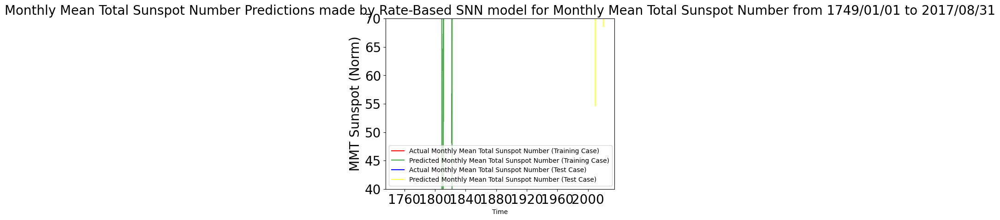

In [ ]:
plt.plot(results_SNN_train['Date'], results_SNN_train['Actual'], color='red',
         label='Actual {0} (Training Case)'.format(feature))
plt.plot(results_SNN_train['Date'],  results_SNN_train['Predicted'], alpha=0.7,
         color='green', label='Predicted {0} (Training Case)'.format(feature))
plt.plot(results_SNN_test['Date'], results_SNN_test['Actual'], color='blue',
         label='Actual {0} (Test Case)'.format(feature))
plt.plot(results_SNN_test['Date'], results_SNN_test['Predicted'], alpha=0.7,
         color='yellow', label='Predicted {0} (Test Case)'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by Rate-Based SNN model for {1}".
          format(feature, title_name), fontsize = 20)
plt.xlabel('Time', fontsize = 10)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
plt.ylim([40, 70])
plt.ylabel(feature_norm, fontsize = 20)
plt.legend()
plt.show()

## Combine Actual and Predicted Results for Train and Test Cases for SNN.

In [ ]:
results_SNN = [results_SNN_train, results_SNN_test]
results_SNN = pd.concat(results_SNN)
display(results_SNN)

,Date,Actual,Predicted
0,1749-01-31,166.046459,149.295853
1,1749-02-28,153.591035,150.805069
2,1749-03-31,152.418759,147.906662
3,1749-04-30,158.338749,142.353378
4,1749-05-31,155.701130,146.344040
...,...,...,...
628,2020-09-30,121.675841,106.108955
629,2020-10-31,125.720191,87.395332
630,2020-11-30,131.464340,96.557350
631,2020-12-31,127.888900,114.668701


## Plot Output Spikes

length of seq_model.layers:  5
layer type:  <class 'keras.src.layers.reshaping.reshape.Reshape'>
layer name:  reshape
layer type:  <class 'keras.src.layers.rnn.time_distributed.TimeDistributed'>
layer name:  time_distributed
layer type:  <class '__main__.SpikingActivationLayer'>
layer name:  spiking_activation_layer
layer type:  <class 'keras.src.layers.pooling.global_average_pooling1d.GlobalAveragePooling1D'>
layer name:  global_average_pooling1d
layer type:  <class 'keras.src.layers.core.dense.Dense'>
layer name:  dense_6
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
spikes.shape:  (633, 128, 10)
spikes_dict:  {'reshape': array([0., 0., 0., ..., 0., 0., 0.], dtype=float32), 'time_distributed': array([0., 0., 0., ..., 0., 0., 0.], dtype=float32), 'spiking_activation_layer': array([0., 0., 0., ..., 0., 0., 0.], dtype=float32), 'global_average_pooling1d': array([0., 0., 0., ..., 0., 0., 0.], dtype=float32), 'dense_6': array([0., 0., 0., ..., 0., 0., 0.], dtype=float32), 'Output': array([0., 0

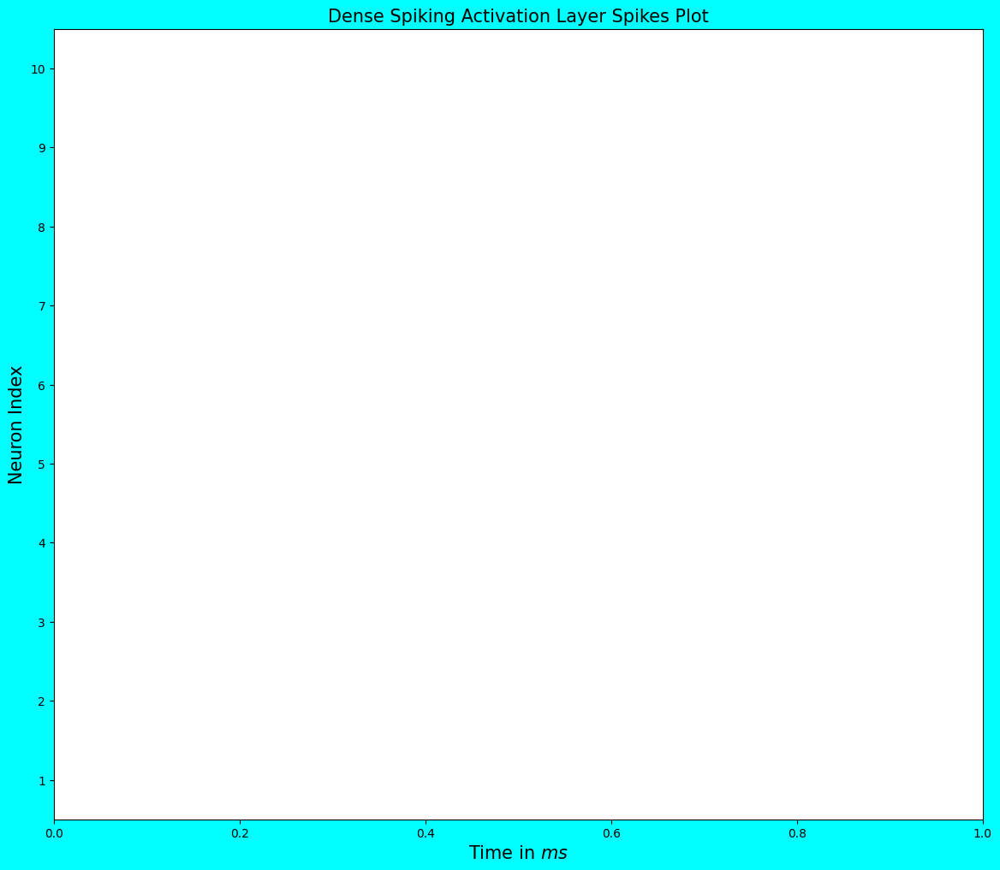

In [ ]:
check_output(spiking_model, X_train, X_test, y_train, y_test)

length of seq_model.layers:  5
layer type:  <class 'keras.src.layers.reshaping.reshape.Reshape'>
layer name:  reshape
layer type:  <class 'keras.src.layers.rnn.time_distributed.TimeDistributed'>
layer name:  time_distributed
layer type:  <class '__main__.SpikingActivationLayer'>
layer name:  spiking_activation_layer
layer type:  <class 'keras.src.layers.pooling.global_average_pooling1d.GlobalAveragePooling1D'>
layer name:  global_average_pooling1d
layer type:  <class 'keras.src.layers.core.dense.Dense'>
layer name:  dense_6
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
spikes.shape:  (633, 128, 10)
spikes_dict:  {'reshape': array([0., 0., 0., ..., 0., 0., 0.], dtype=float32), 'time_distributed': array([0., 0., 0., ..., 0., 0., 0.], dtype=float32), 'spiking_activation_layer': array([0., 0., 0., ..., 0., 0., 0.], dtype=float32), 'global_average_pooling1d': array([0., 0., 0., ..., 0., 0., 0.], dtype=float32), 'dense_6': array([1., 1., 1., ..., 0., 1., 1.], dtype=float32), 'Output': array([0., 0

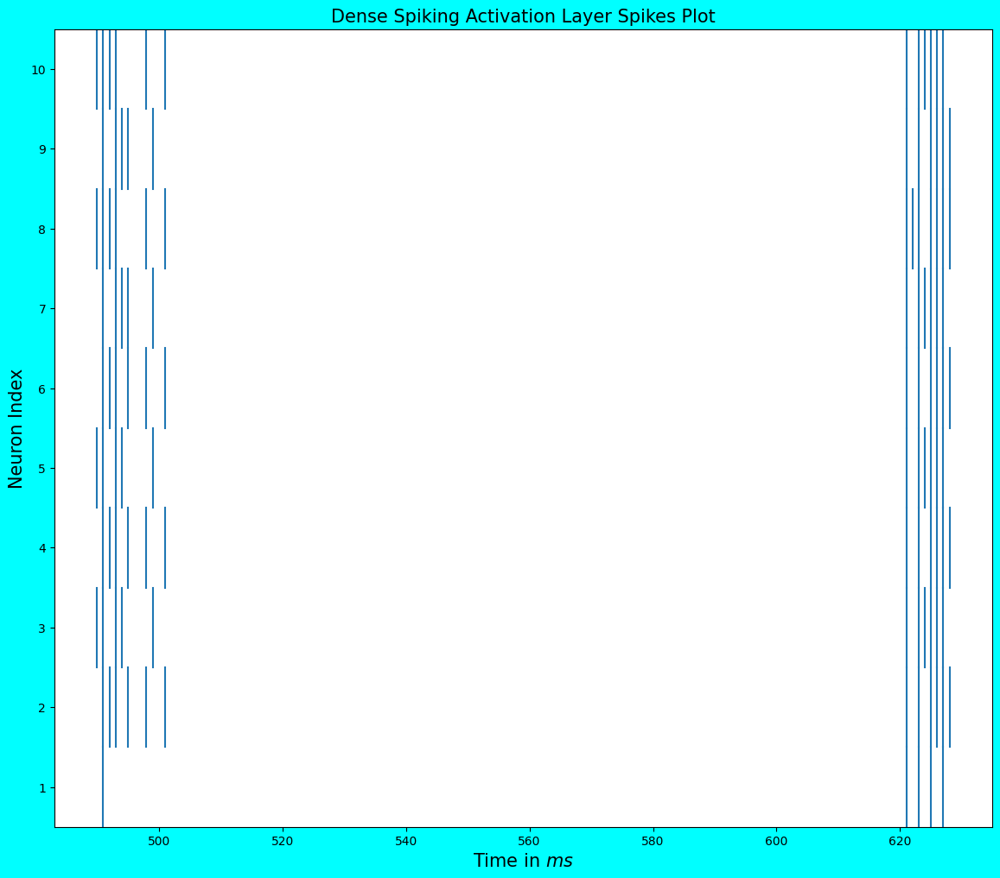

In [ ]:
check_output(spiking_model, X_train, X_test, y_train, y_test, modify_dt = 100)

## Plotting Residuals for Actual and Predicted Results for SNN.

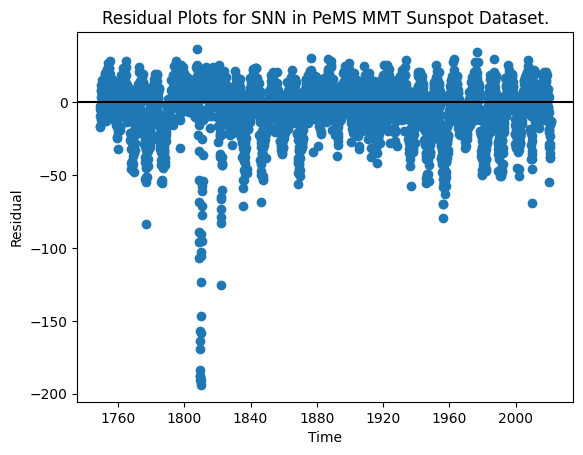

In [ ]:
actual_arr_SNN = np.array(results_SNN['Actual'])
predicted_arr_SNN = np.array(results_SNN['Predicted'])
residuals_SNN = predicted_arr_SNN - actual_arr_SNN
plt.scatter(results_SNN['Date'], residuals_SNN)
plt.axhline(y=0, color = 'black')
plt.title("Residual Plots for SNN in PeMS {} Dataset.".format(feature_field))
plt.xlabel("Time")
plt.ylabel("Residual")
plt.show()

From the residual plots for the RNN model, it can be concluded that the RNN model is a good fit.

## Energy Consumption

In [ ]:
snn_energy_results = measure_snn_energy(spiking_model, X_test, model_name_str='Rate-Based SNN Model')

Measuring inference time and estimating energy on CPU (for SNN)...
  CPU Inference Time: 0.1106 seconds
  Estimated CPU Energy: 8.8454 Joules (8845405.5786 µJ)

No GPU available. GPU measurements skipped.
Estimated total spikes: 1620480
Estimated SNN Spike Energy: 1620.4800 µJ


# Spiking Network Model with LIF.

## Create SNN with LIF Class.

### Create Model

In [ ]:
spiking_LIF_model = tf.keras.Sequential(
    [
        # Add temporal dimension to model. For this dataset, the input_shape is
        # passed into the model.
        tf.keras.layers.Reshape((-1, X_train.shape[1]),
                                input_shape=(None, X_train.shape[1])),
        # Keras' TimeDistributed wrapper allows Dense layer to operate on
        # temporal data.
        tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(128)),
        # SpikingActivation: Function replaces any activation function with it's
        # Spiking equivalent. In addition to activation functions, the timestep
        # (dt) can be changed to run the spiking neurons for longer periods of
        # time. spiking_aware_training is set to True as it helps in the
        # regularization.
        #keras_spiking.SpikingActivation("tanh", dt = 100,
        #                                spiking_aware_training=True),
        #tf.keras.layers.Activation('tanh'),  # Non-linearity before LIF
        #LIFNeuron(threshold=0.5, leak_rate=0.0001),
        #LIFNeuron(threshold=0.5, leak_rate=0.001),
        #tf.keras.layers.Dropout(0.1),  # Added dropout
        #LIFNeuron(threshold=0.7, leak_rate=0.02),
        LIFNeuron(threshold=0.5, leak_rate=0.01),
        #tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(64)),
        #tf.keras.layers.Activation('tanh'),  # Non-linearity before LIF
        #LIFNeuron(threshold=0.5, leak_rate=0.01),
        #tf.keras.layers.Dropout(0.009),  # Added dropout
        #LIFNeuron(threshold=0.5, leak_rate=0.01),
        #tf.keras.layers.Dropout(0.1),  # Added dropout
        #LIFNeuron(threshold=1.0, leak_rate=0.01),
        #tf.keras.layers.Dropout(0.1),  # Added dropout
        #RateBasedSoftmax(time_window=10),
        # GlobalAveragePooling1D: Averages spiking output over time. Used for
        # determining the spiking rate of neuron.
        #keras_spiking.SpikingActivation("tanh", dt = 100,
        #                                spiking_aware_training=True),
        #tf.keras.layers.Activation(tf.keras.activations.tanh),
        #SpikingActivation(activation=tf.keras.activations.tanh, dt = 100,
        #                  spiking_aware_training=True),
        #spiking_LIFv3_model.add(SpikingActivation(activation=tf.keras.activations.tanh, dt=1.0, spiking_aware_training=True)),
        tf.keras.layers.GlobalAveragePooling1D(),
        #tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(1),
    ]
)

spiking_LIF_model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ reshape_1 (Reshape)             │ (None, None, 20)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_1              │ (None, None, 128)      │         2,688 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lif_neuron (LIFNeuron)          │ (None, None, 128)      │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling1d_1      │ (None, 128)            │             0 │
│ (GlobalAveragePooling1D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,945 (11.50 KB)

 Trainable params: 2,817 (11.00 KB)

 Non-trainable params: 128 (512.00 B)

Number of Neurons for Dense Layer

In [ ]:
dense_layer = spiking_LIF_model.layers[1].layer  # Access the Dense layer within TimeDistributed
num_dense_neurons = dense_layer.units
print(f"Number of neurons in Dense layer: {num_dense_neurons}")

Number of neurons in Dense layer: 128


Number of Neurons for LIF Layer

In [ ]:
#lif_layer = spiking_LIF_model.layers[2].layer  # Access the LIFNeuron layer
#num_lif_neurons = lif_layer.units
#print(f"Number of neurons in LIFNeuron layer: {num_lif_neurons}")

## Training SNN LIF Model.

Epoch 1/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0442
Epoch 2/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0241
Epoch 3/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0208
Epoch 4/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0196
Epoch 5/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0190
Epoch 6/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0185
Epoch 7/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0182
Epoch 8/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0178
Epoch 9/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0176
Epoch 10/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0174


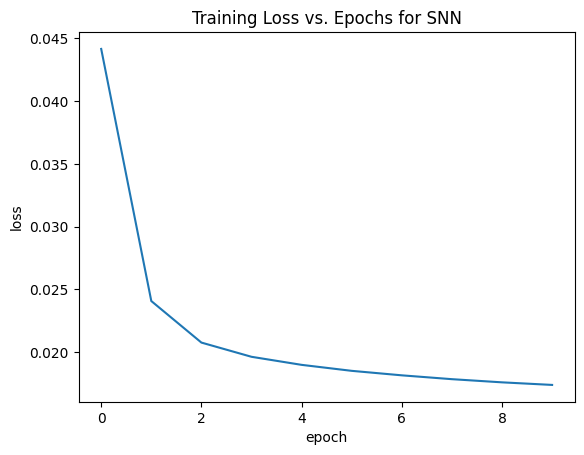

In [ ]:
# Compile the model
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
spiking_LIF_model.compile(optimizer='adam', loss=loss)
#spiking_LIF_model.compile(optimizer=optimizer, loss=loss)
spiking_model_LIF_epochs = spiking_LIF_model.fit(X_train,y_train,epochs=epochs,
                                                 batch_size=batch_size)
plot_training_loss(spiking_model_LIF_epochs, "SNN")

## Evaluate SNN LIF Model using MAE, RMSE, and MAPE.

In [ ]:
print("Dense LIF SNN Predictions for Training Set")
snn_LIF_pred_train = spiking_LIF_model.predict(X_train)
print("Dense LIF SNN Predictions for Testing Set")
snn_LIF_pred_test = spiking_LIF_model.predict(X_test)
print(snn_LIF_pred_test.shape)
snn_LIF_mae = mean_absolute_error(y_test, snn_LIF_pred_test)
print("MAE of LIF SNN  model = ",snn_LIF_mae)
snn_LIF_rmse =  mean_squared_error(y_test, snn_LIF_pred_test) ** 0.5
print("RMSE of LIF SNN model = ",snn_LIF_rmse)
#rnn_r2_score = r2_score(y_test,rnn_predictions_test)
#print("R2 Score of RNN model = ",rnn_r2_score)
snn_LIF_mape_score = 100*mean_absolute_percentage_error(y_test, snn_LIF_pred_test)
print("MAPE Score of LIF SNN model = {0} %".format(snn_LIF_mape_score))

Dense LIF SNN Predictions for Training Set
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Dense LIF SNN Predictions for Testing Set
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
(633, 1)
MAE of LIF SNN  model =  0.102647739028978
RMSE of LIF SNN model =  0.1293172675857662
MAPE Score of LIF SNN model = 110662866593174.75 %


In [ ]:
perform_statistical_tests(y_test, snn_LIF_pred_test, "LIF SNN")


--- Statistical Tests for LIF SNN ---
Paired t-test could not be performed: name 'scipy' is not defined
Wilcoxon Signed-Rank Test could not be performed: name 'scipy' is not defined


## Reverse Transform Scaler to Convert to Real Values.

In [ ]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
snn_LIF_pred_inv_train = scaler.inverse_transform(snn_LIF_pred_train)

y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
snn_LIF_pred_inv_test = scaler.inverse_transform(snn_LIF_pred_test)

# Get values after inverse transformation
y_train_inverse = y_train_inverse.flatten()
snn_LIF_pred_inv_train = snn_LIF_pred_inv_train.flatten()

y_test_inverse = y_test_inverse.flatten()
snn_LIF_pred_inv_test = snn_LIF_pred_inv_test.flatten()

## Show Actual and Predicted y values as Dataframes.

### With Training Dates.

In [ ]:
results_SNN_LIF_train = pd.DataFrame({"Date": first_6169_index_dates,
                                  'Actual': y_train_inverse,
                                  'Predicted': snn_LIF_pred_inv_train})
results_SNN_LIF_train

,Date,Actual,Predicted
0,1749-01-31,166.046459,139.651672
1,1749-02-28,153.591035,147.093643
2,1749-03-31,152.418759,156.039276
3,1749-04-30,158.338749,156.039276
4,1749-05-31,155.701130,156.039276
...,...,...,...
2607,1966-04-30,173.959317,139.651672
2608,1966-05-31,172.054370,139.651672
2609,1966-06-30,167.951406,139.651672
2610,1966-07-31,159.745480,139.651672


### With Testing Dates.

In [ ]:
results_SNN_LIF_test = pd.DataFrame({"Date":last_6169_index_dates,
                                 'Actual': y_test_inverse,
                                 'Predicted': snn_LIF_pred_inv_test})
results_SNN_LIF_test

,Date,Actual,Predicted
0,1968-05-31,174.252386,139.651672
1,1968-06-30,167.277348,139.651672
2,1968-07-31,161.415972,139.651672
3,1968-08-31,166.867052,139.651672
4,1968-09-30,170.149422,139.651672
...,...,...,...
628,2020-09-30,121.675841,139.651672
629,2020-10-31,125.720191,139.651672
630,2020-11-30,131.464340,139.651672
631,2020-12-31,127.888900,139.651672


## Plotting Predictions for PeMS Dataset Output made by SNN LIF Model.

### Only Testing Data.

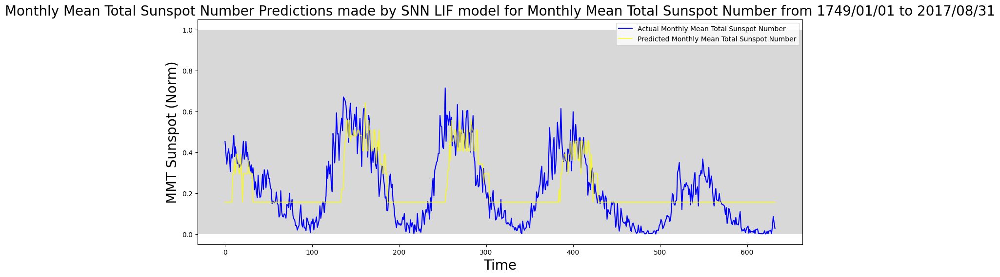

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(snn_LIF_pred_test, alpha=0.7, color='yellow',
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by SNN LIF model for {1}".
          format(feature, title_name), fontsize = 20)
plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
plt.xlabel('Time', fontsize = 20)
plt.ylabel(feature_norm, fontsize = 20)
plt.legend()
plt.show()

### Training and Testing Data combined.

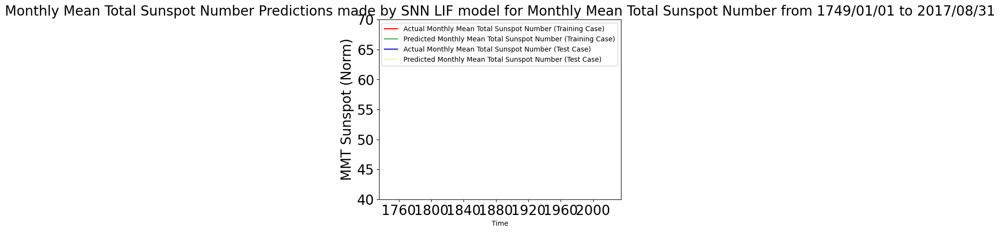

In [ ]:
plt.plot(results_SNN_LIF_train['Date'], results_SNN_LIF_train['Actual'], color='red',
         label='Actual {0} (Training Case)'.format(feature))
plt.plot(results_SNN_LIF_train['Date'],  results_SNN_LIF_train['Predicted'], alpha=0.7,
         color='green', label='Predicted {0} (Training Case)'.format(feature))
plt.plot(results_SNN_LIF_test['Date'], results_SNN_LIF_test['Actual'], color='blue',
         label='Actual {0} (Test Case)'.format(feature))
plt.plot(results_SNN_LIF_test['Date'], results_SNN_LIF_test['Predicted'], alpha=0.7,
         color='yellow', label='Predicted {0} (Test Case)'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by SNN LIF model for {1}".
          format(feature, title_name), fontsize = 20)
plt.xlabel('Time', fontsize = 10)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
plt.ylim([40, 70])
plt.ylabel(feature_norm, fontsize = 20)
plt.legend()
plt.show()

## Combine Actual and Predicted Results for Train and Test Cases for SNN LIF Model.

In [ ]:
results_SNN_LIF = [results_SNN_LIF_train, results_SNN_LIF_test]
results_SNN_LIF = pd.concat(results_SNN_LIF)
display(results_SNN_LIF)

,Date,Actual,Predicted
0,1749-01-31,166.046459,139.651672
1,1749-02-28,153.591035,147.093643
2,1749-03-31,152.418759,156.039276
3,1749-04-30,158.338749,156.039276
4,1749-05-31,155.701130,156.039276
...,...,...,...
628,2020-09-30,121.675841,139.651672
629,2020-10-31,125.720191,139.651672
630,2020-11-30,131.464340,139.651672
631,2020-12-31,127.888900,139.651672


## Plot Output Spikes

In [ ]:
check_output(spiking_LIF_model, X_train, X_test, y_train, y_test)

length of seq_model.layers:  5
layer type:  <class 'keras.src.layers.reshaping.reshape.Reshape'>
layer name:  reshape_1
layer new name:  reshape
layer type:  <class 'keras.src.layers.rnn.time_distributed.TimeDistributed'>
layer name:  time_distributed_1
layer new name:  time_distributed
layer type:  <class '__main__.LIFNeuron'>
layer name:  lif_neuron
layer type:  <class 'keras.src.layers.pooling.global_average_pooling1d.GlobalAveragePooling1D'>
layer name:  global_average_pooling1d_1
layer new name:  global_average_pooling1d
layer type:  <class 'keras.src.layers.core.dense.Dense'>
layer name:  dense_8
Error: No SpikingActivation or compatible layer found in the model for spike plotting.


## Plotting Residuals for Actual and Predicted Results for LIF SNN.

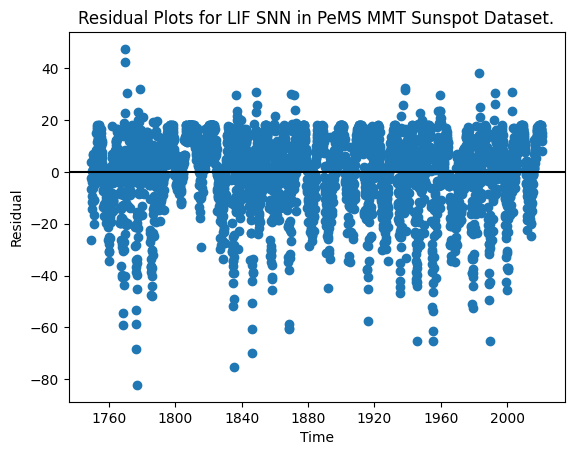

In [ ]:
actual_arr_SNN_LIF = np.array(results_SNN_LIF['Actual'])
pred_arr_SNN_LIF = np.array(results_SNN_LIF['Predicted'])
residuals_SNN_LIF = pred_arr_SNN_LIF - actual_arr_SNN_LIF
plt.scatter(results_SNN_LIF['Date'], residuals_SNN_LIF)
plt.axhline(y=0, color = 'black')
plt.title("Residual Plots for LIF SNN in PeMS {} Dataset.".format(feature_field))
plt.xlabel("Time")
plt.ylabel("Residual")
plt.show()

## Energy Consumption

In [ ]:
spiking_LIF_energy_results = measure_snn_energy(spiking_LIF_model, X_test, model_name_str='LIF SNN Model')

Measuring inference time and estimating energy on CPU (for SNN)...
  CPU Inference Time: 0.1482 seconds
  Estimated CPU Energy: 11.8528 Joules (11852836.6089 µJ)

No GPU available. GPU measurements skipped.
Estimated total spikes: 1620480
Estimated SNN Spike Energy: 1620.4800 µJ


# Spiking Network Model with LIF (Version 4)

## Create New SNN and LIF Class

### Create Model

In [ ]:
spiking_LIFv3_model = tf.keras.Sequential(
    [
        # Add temporal dimension to model. For this dataset, the input_shape is
        # passed into the model.
        tf.keras.layers.Reshape((-1, X_train.shape[1]),
                                input_shape=(None, X_train.shape[1])),
        # Keras' TimeDistributed wrapper allows Dense layer to operate on
        # temporal data.
        tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(128)),
        #tf.keras.layers.Dense(64, activation='tanh'),
        #LIFNeuronV3(threshold=1.25, leak_rate=0.06, refractory_period=5),
        #tf.keras.layers.Activation('tanh'),  # Non-linearity before LIF
        LIFNeuronV3(threshold=0.5, leak_rate=0.01, refractory_period=275),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Reshape((-1, 128)),  # Reshape to (batch_size, time_steps, features)

        #tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(64)),
        #tf.keras.layers.Activation('tanh'),  # Non-linearity before LIF
        #LIFNeuronV3(threshold=0.5, leak_rate=0.01, refractory_period=5),


        #tf.keras.layers.Dropout(0.01),  # Added dropout
        # Use tf.keras.layers.Permute to swap the time_steps and num_neurons dimensions
        #tf.keras.layers.Permute((2, 1)),  # Now shape is (batch_size, num_neurons, time_steps)
        #tf.keras.layers.Reshape((-1, 64)),  # Reshape to (batch_size, time_steps, num_neurons)
        # GlobalAveragePooling1D: Averages spiking output over time. Used for
        # determining the spiking rate of neuron.
        #keras_spiking.SpikingActivation("tanh", dt = 100,
        #                                spiking_aware_training=True),
        #SpikingActivation(activation=tf.keras.activations.tanh, dt = 100,
        #                  spiking_aware_training=True),
        tf.keras.layers.GlobalAveragePooling1D(),
        #tf.keras.layers.GlobalAveragePooling1D(data_format='channels_last'),
        #tf.keras.layers.Dense(future),
        #tf.keras.layers.Flatten(),  # Add Flatten layer
        #tf.keras.layers.Reshape((batch_size, 1)),  # Reshape to (batch_size, 1)
        #tf.keras.layers.Lambda(lambda x: x[:, -1]),
        tf.keras.layers.Dense(1),
        #tf.keras.layers.Dense(1, input_shape=(X_train.shape[1] * 64, )),

    ]

)

spiking_LIFv3_model.summary()

Instructions for updating:
Use fn_output_signature instead


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ reshape_2 (Reshape)             │ (None, None, 20)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_2              │ (None, None, 128)      │         2,688 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lif_neuron_v3 (LIFNeuronV3)     │ (None, None, 1, 128)   │           129 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, None, 1, 128)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_3 (Reshape)             │ (None, None, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling1d_2      │ (None, 128)            │             0 │
│ (GlobalAveragePooling1D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,946 (11.51 KB)

 Trainable params: 2,817 (11.00 KB)

 Non-trainable params: 129 (516.00 B)

## Training SNN V4 Model.

Epoch 1/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 0.0403
Epoch 2/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0260
Epoch 3/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0222
Epoch 4/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0204
Epoch 5/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0205
Epoch 6/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0200
Epoch 7/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0194
Epoch 8/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0197
Epoch 9/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0197
Epoch 10/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0196


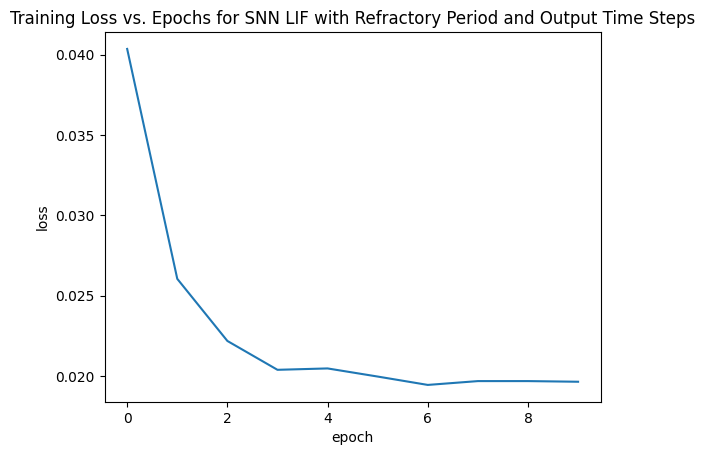

In [ ]:
# Compile the model
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
spiking_LIFv3_model.compile(optimizer='adam', loss=loss)
spiking_LIFv3_model.compile(optimizer=optimizer, loss=loss)
spiking_LIFv3_model_epochs = spiking_LIFv3_model.fit(X_train,y_train,epochs=epochs,
                                                 batch_size=batch_size)
plot_training_loss(spiking_LIFv3_model_epochs, "SNN LIF with Refractory Period and Output Time Steps")

## Evaluating SNN V4 Model using MAE, RMSE, R2.

In [ ]:
print("SNN v4 Predictions for Training Set")
spiking_LIFv3_model_pred_train = spiking_LIFv3_model.predict(X_train)
print("SNN v4 Predictions for Training Set")
spiking_LIFv3_model_pred_test = spiking_LIFv3_model.predict(X_test)
print(spiking_LIFv3_model_pred_test.shape)

# Reshape the model predictions if necessary
#spiking_LIFv3_model_pred_test = spiking_LIFv3_model_pred_test.reshape(y_test.shape)

spiking_LIFv3_model_mae = mean_absolute_error(y_test, spiking_LIFv3_model_pred_test)
print("MAE of SNN v4 model = ",spiking_LIFv3_model_mae)
spiking_LIFv3_model_rmse =  mean_squared_error(y_test, spiking_LIFv3_model_pred_test) ** 0.5
print("RMSE of SNN v4  model = ", spiking_LIFv3_model_rmse)
spiking_LIFv3_model_r2_score = r2_score(y_test, spiking_LIFv3_model_pred_test)
print("R2 Score of SNN v4 model = ", spiking_LIFv3_model_r2_score)
spiking_LIFv3_model_mape_score = 100*mean_absolute_percentage_error(y_test,
                                                                    spiking_LIFv3_model_pred_test)
print("MAPE Score of SNN v4 model = {0} %".format(spiking_LIFv3_model_mape_score))

SNN v4 Predictions for Training Set
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
SNN v4 Predictions for Training Set
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
(633, 1)
MAE of SNN v4 model =  0.11517422142605839
RMSE of SNN v4  model =  0.14123275435714178
R2 Score of SNN v4 model =  0.350760660674034
MAPE Score of SNN v4 model = 120354626955628.16 %


In [ ]:
perform_statistical_tests(y_test, spiking_LIFv3_model_pred_test, "LIF SNN V3")


--- Statistical Tests for LIF SNN V3 ---
Paired t-test could not be performed: name 'scipy' is not defined
Wilcoxon Signed-Rank Test could not be performed: name 'scipy' is not defined


## Reverse Transform Scaler to Convert to Real Values.

In [ ]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
spiking_LIFv3_model_inv_train = scaler.inverse_transform(spiking_LIFv3_model_pred_train)

y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
spiking_LIFv3_model_inv_test = scaler.inverse_transform(spiking_LIFv3_model_pred_test)

# Get values after inverse transformation
y_train_inverse = y_train_inverse.flatten()
spiking_LIFv3_model_inv_train = spiking_LIFv3_model_inv_train.flatten()

y_test_inverse = y_test_inverse.flatten()
spiking_LIFv3_model_inv_test = spiking_LIFv3_model_inv_test.flatten()

## Show Actual and Predicted y values as Dataframes.

### With Training Dates.

In [ ]:
results_SNN_LIFv3_train = pd.DataFrame({"Date": first_6169_index_dates,
                                  'Actual': y_train_inverse,
                                  'Predicted': spiking_LIFv3_model_inv_train})
results_SNN_LIFv3_train

,Date,Actual,Predicted
0,1749-01-31,166.046459,141.241379
1,1749-02-28,153.591035,141.241379
2,1749-03-31,152.418759,141.241379
3,1749-04-30,158.338749,141.241379
4,1749-05-31,155.701130,157.901306
...,...,...,...
2607,1966-04-30,173.959317,141.241379
2608,1966-05-31,172.054370,141.241379
2609,1966-06-30,167.951406,141.241379
2610,1966-07-31,159.745480,141.241379


### With Testing Dates.

In [ ]:
results_SNN_LIFv3_test = pd.DataFrame({"Date":last_6169_index_dates,
                                 'Actual': y_test_inverse,
                                 'Predicted': spiking_LIFv3_model_inv_test})
results_SNN_LIFv3_test

,Date,Actual,Predicted
0,1968-05-31,174.252386,141.241379
1,1968-06-30,167.277348,141.241379
2,1968-07-31,161.415972,141.241379
3,1968-08-31,166.867052,141.241379
4,1968-09-30,170.149422,141.241379
...,...,...,...
628,2020-09-30,121.675841,141.241379
629,2020-10-31,125.720191,141.241379
630,2020-11-30,131.464340,141.241379
631,2020-12-31,127.888900,141.241379


## Plotting Predictions for PeMS Dataset Output made by SNN LIF Model.

### Only Testing Data.

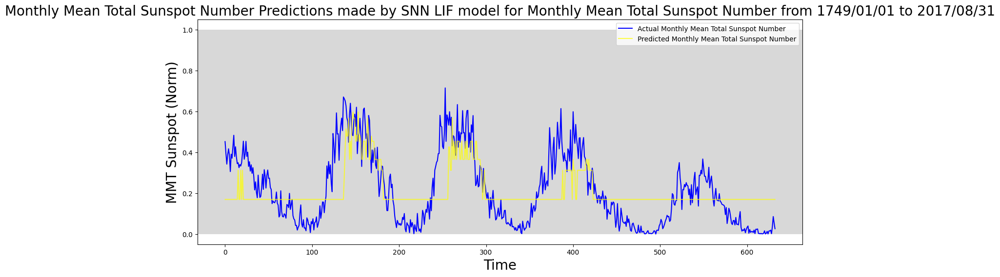

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(spiking_LIFv3_model_pred_test, alpha=0.7, color='yellow',
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by SNN LIF model for {1}".
          format(feature, title_name), fontsize = 20)
plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
plt.xlabel('Time', fontsize = 20)
plt.ylabel(feature_norm, fontsize = 20)
plt.legend()
plt.show()

### Training and Testing Data combined.

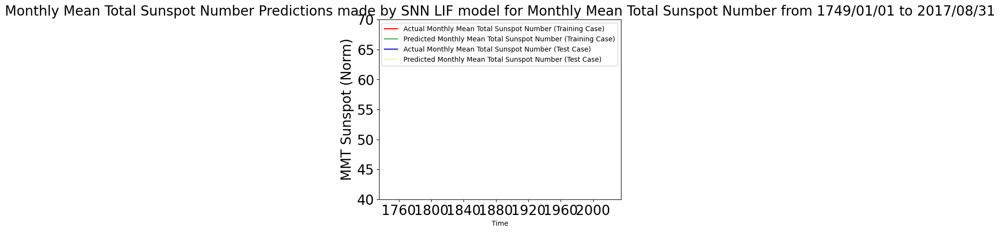

In [ ]:
plt.plot(results_SNN_LIFv3_train['Date'], results_SNN_LIFv3_train['Actual'],
         color='red', label='Actual {0} (Training Case)'.format(feature))
plt.plot(results_SNN_LIFv3_train['Date'],  results_SNN_LIFv3_train['Predicted'],
         alpha=0.7, color='green',
         label='Predicted {0} (Training Case)'.format(feature))
plt.plot(results_SNN_LIFv3_test['Date'], results_SNN_LIFv3_test['Actual'],
         color='blue', label='Actual {0} (Test Case)'.format(feature))
plt.plot(results_SNN_LIFv3_test['Date'], results_SNN_LIFv3_test['Predicted'],
         alpha=0.7, color='yellow',
         label='Predicted {0} (Test Case)'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by SNN LIF model for {1}".
          format(feature, title_name), fontsize = 20)
plt.xlabel('Time', fontsize = 10)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
plt.ylim([40, 70])
plt.ylabel(feature_norm, fontsize = 20)
plt.legend()
plt.show()

## Combine Actual and Predicted Results for Train and Test Cases for SNN LIF Model.

In [ ]:
results_SNN_LIFv3 = [results_SNN_LIFv3_train, results_SNN_LIFv3_test]
results_SNN_LIFv3 = pd.concat(results_SNN_LIFv3)
display(results_SNN_LIFv3)

,Date,Actual,Predicted
0,1749-01-31,166.046459,141.241379
1,1749-02-28,153.591035,141.241379
2,1749-03-31,152.418759,141.241379
3,1749-04-30,158.338749,141.241379
4,1749-05-31,155.701130,157.901306
...,...,...,...
628,2020-09-30,121.675841,141.241379
629,2020-10-31,125.720191,141.241379
630,2020-11-30,131.464340,141.241379
631,2020-12-31,127.888900,141.241379


## Plot Output Spikes

In [ ]:
check_output(spiking_LIF_model, X_train, X_test, y_train, y_test)

length of seq_model.layers:  5
layer type:  <class 'keras.src.layers.reshaping.reshape.Reshape'>
layer name:  reshape_1
layer new name:  reshape
layer type:  <class 'keras.src.layers.rnn.time_distributed.TimeDistributed'>
layer name:  time_distributed_1
layer new name:  time_distributed
layer type:  <class '__main__.LIFNeuron'>
layer name:  lif_neuron
layer type:  <class 'keras.src.layers.pooling.global_average_pooling1d.GlobalAveragePooling1D'>
layer name:  global_average_pooling1d_1
layer new name:  global_average_pooling1d
layer type:  <class 'keras.src.layers.core.dense.Dense'>
layer name:  dense_8
Error: No SpikingActivation or compatible layer found in the model for spike plotting.


## Energy Consumption

In [ ]:
spiking_LIFv3_energy_results = measure_snn_energy(spiking_LIFv3_model, X_test, model_name_str='LIF SNN V3 Model')

Measuring inference time and estimating energy on CPU (for SNN)...
  CPU Inference Time: 0.1693 seconds
  Estimated CPU Energy: 13.5432 Joules (13543167.1143 µJ)

No GPU available. GPU measurements skipped.
Estimated total spikes: 1620480
Estimated SNN Spike Energy: 1620.4800 µJ


# Hybrid Models

## CNN-RNN model

### Create CNN-RNN Model.

In [ ]:
cnn_rnn_model = Sequential()

cnn_rnn_model.add(Conv1D(filters=filter, kernel_size=kernel, activation=activation,
                         input_shape=(seq_len, X_train.shape[2])))
cnn_rnn_model.add(MaxPooling1D(pool_size=2))

cnn_rnn_model.add(Conv1D(filters=filter, kernel_size=kernel, activation=activation,
                         input_shape=(seq_len, X_train.shape[2])))
cnn_rnn_model.add(MaxPooling1D(pool_size=2))

#cnn_rnn_model.add(Conv1D(filters=60, kernel_size=2, activation='relu',
#input_shape=(seq_len, X_train.shape[2])))
#cnn_rnn_model.add(MaxPooling1D(pool_size=2))

#cnn_rnn_model.add(SimpleRNN(60,activation="tanh",return_sequences=True,
#input_shape=(X_train.shape[1],1)))
#cnn_rnn_model.add(Dropout(0.5))

#cnn_rnn_model.add(SimpleRNN(64,activation="tanh",return_sequences=True))
#cnn_rnn_model.add(Dropout(0.8))

#cnn_rnn_model.add(SimpleRNN(64, activation="tanh",return_sequences=True))
#cnn_rnn_model.add(Dropout(0.8))

cnn_rnn_model.add(SimpleRNN(unit, activation=activation,return_sequences=False))
cnn_rnn_model.add(Dropout(0.1))

cnn_rnn_model.add(Dense(1))
cnn_rnn_model.compile(optimizer='adam', loss='mse')
cnn_rnn_model.summary()

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_2 (Conv1D)               │ (None, 18, 32)         │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_2 (MaxPooling1D)  │ (None, 9, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_3 (Conv1D)               │ (None, 7, 32)          │         3,104 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_3 (MaxPooling1D)  │ (None, 3, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ simple_rnn_2 (SimpleRNN)        │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,345 (20.88 KB)

 Trainable params: 5,345 (20.88 KB)

 Non-trainable params: 0 (0.00 B)

### Train CNN-RNN Model.


Epoch 1/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.0129
Epoch 2/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0072
Epoch 3/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0070
Epoch 4/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0068
Epoch 5/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0063
Epoch 6/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0064
Epoch 7/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0062
Epoch 8/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0065
Epoch 9/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0063
Epoch 10/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0063


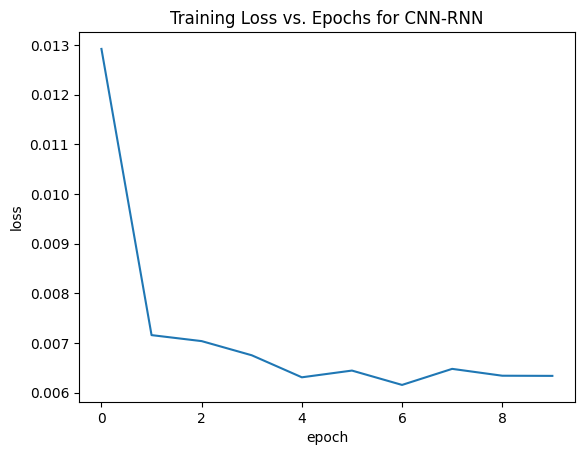

In [ ]:
cnn_rnn_model.compile(optimizer="adam",loss=loss)
cnn_rnn_epochs = cnn_rnn_model.fit(X_train, y_train, epochs=epochs,
                                   batch_size=batch_size)
plot_training_loss(cnn_rnn_epochs, "CNN-RNN")

### Evaluate CNN-RNN model using MAE, RMSE, and R^2.

In [ ]:
print("CNN-RNN Predictions for Training Set")
cnn_rnn_pred_train = cnn_rnn_model.predict(X_train)
print("CNN-RNN Predictions for Testing Set")
cnn_rnn_pred_test = cnn_rnn_model.predict(X_test)
cnn_rnn_mae = mean_absolute_error(y_test,cnn_rnn_pred_test)
print("MAE of CNN-RNN model = ",cnn_rnn_mae)
cnn_rnn_rmse =  mean_squared_error(y_test,cnn_rnn_pred_test) ** 0.5
print("RMSE of CNN-RNN model = ",cnn_rnn_rmse)
cnn_rnn_r2_score = r2_score(y_test,cnn_rnn_pred_test)
print("R2 Score of CNN-RNN model = ",cnn_rnn_r2_score)
cnn_rnn_mape_score = 100*mean_absolute_percentage_error(y_test,
                                                        cnn_rnn_pred_test)
print("MAPE Score of CNN-RNN model = {0} %".format(cnn_rnn_mape_score))
cnn_rnn_smape_score = 100*symmetric_mean_absolute_percentage_error(y_test,
                                                                   cnn_rnn_pred_test)
print("sMAPE Score of CNN-RNN model = {0} %".format(cnn_rnn_smape_score))

CNN-RNN Predictions for Training Set
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
CNN-RNN Predictions for Testing Set
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
MAE of CNN-RNN model =  0.04977010966057219
RMSE of CNN-RNN model =  0.06837567875125732
R2 Score of CNN-RNN model =  0.8478271164102893
MAPE Score of CNN-RNN model = 13287552421672.203 %
sMAPE Score of CNN-RNN model = 9611.316288582717 %


In [ ]:
perform_statistical_tests(y_test, cnn_rnn_pred_test, "CNN-RNN")


--- Statistical Tests for CNN-RNN ---
Paired t-test could not be performed: name 'scipy' is not defined
Wilcoxon Signed-Rank Test could not be performed: name 'scipy' is not defined


### Calculate 95% Confidence Intervals for CNN-RNN MAE and RMSE

In [ ]:
cnn_rnn_mae_ci_lower, cnn_rnn_mae_ci_upper = calculate_bootstrap_ci(y_test, cnn_rnn_pred_test.flatten(), mean_absolute_error)
print(f"CNN-RNN MAE 95% CI: [{cnn_rnn_mae_ci_lower:.4f}, {cnn_rnn_mae_ci_upper:.4f}]")

cnn_rnn_rmse_ci_lower, cnn_rnn_rmse_ci_upper = calculate_bootstrap_ci(y_test, cnn_rnn_pred_test.flatten(), lambda yt, yp: mean_squared_error(yt, yp)**0.5)
print(f"CNN-RNN RMSE 95% CI: [{cnn_rnn_rmse_ci_lower:.4f}, {cnn_rnn_rmse_ci_upper:.4f}]")

CNN-RNN MAE 95% CI: [0.0459, 0.0532]
CNN-RNN RMSE 95% CI: [0.0632, 0.0730]


### Reverse Transform Scaler to Convert to Real Values.

In [ ]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
cnn_rnn_pred_inv_train = scaler.inverse_transform(cnn_rnn_pred_train)
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
cnn_rnn_pred_inv_test = scaler.inverse_transform(cnn_rnn_pred_test)

# Get values after inverse transformation
y_train_inverse = y_train_inverse.flatten()
cnn_rnn_pred_inv_train = cnn_rnn_pred_inv_train.flatten()
y_test_inverse = y_test_inverse.flatten()
cnn_rnn_pred_inv_test = cnn_rnn_pred_inv_test.flatten()

In [ ]:
int(test_size*df_entire.shape[0]) + 1 - seq_len

634

### Showing Actual y and Predicted y values as Dataframes.


#### With Training Dates.


In [ ]:
results_CNN_RNN_train = pd.DataFrame({"Date": first_6169_index_dates,
                                  'Actual': y_train_inverse,
                                  'Predicted': cnn_rnn_pred_inv_train})
results_CNN_RNN_train

,Date,Actual,Predicted
0,1749-01-31,166.046459,168.350037
1,1749-02-28,153.591035,165.579987
2,1749-03-31,152.418759,165.880707
3,1749-04-30,158.338749,162.535568
4,1749-05-31,155.701130,161.497055
...,...,...,...
2607,1966-04-30,173.959317,162.103439
2608,1966-05-31,172.054370,162.306259
2609,1966-06-30,167.951406,161.186996
2610,1966-07-31,159.745480,162.268555


#### With Testing Dates.

In [ ]:
results_CNN_RNN_test = pd.DataFrame({"Date":last_6169_index_dates,
                                     'Actual': y_test_inverse,
                                     'Predicted': cnn_rnn_pred_inv_test})
results_CNN_RNN_test

,Date,Actual,Predicted
0,1968-05-31,174.252386,169.174683
1,1968-06-30,167.277348,163.417664
2,1968-07-31,161.415972,161.239105
3,1968-08-31,166.867052,161.771561
4,1968-09-30,170.149422,161.847031
...,...,...,...
628,2020-09-30,121.675841,124.492012
629,2020-10-31,125.720191,124.912941
630,2020-11-30,131.464340,124.923042
631,2020-12-31,127.888900,124.935951


### Plotting Predictions for Q/VMT/VHT made by CNN-RNN Model.


#### Only Testing Data.

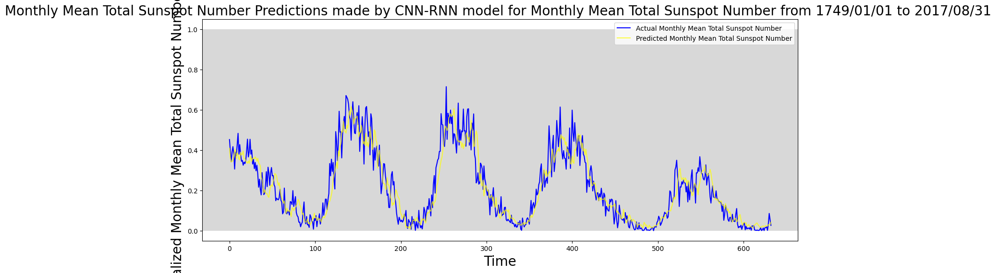

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(cnn_rnn_pred_test, alpha=0.7, color='yellow',
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by CNN-RNN model for {1} ".
          format(feature, title_name), fontsize = 20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 20)
plt.ylabel('Normalized {0} Scale'.format(feature), fontsize = 20)
plt.legend()
plt.show()

#### Training and Test Data Combined.

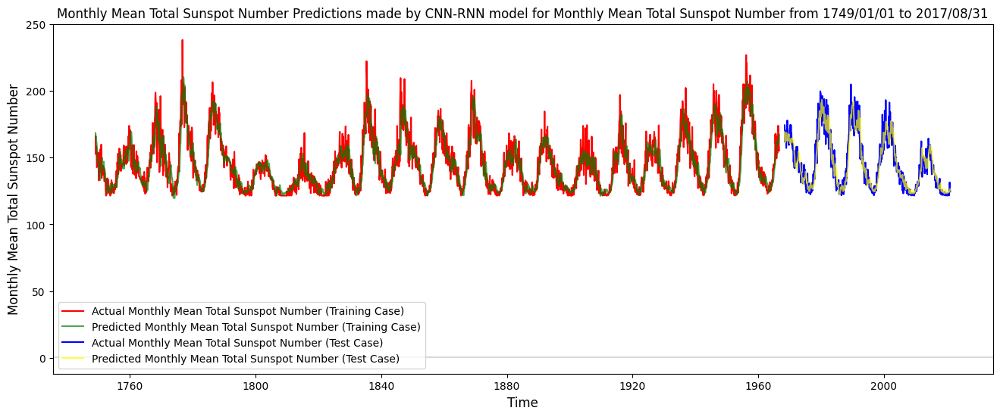

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(results_CNN_RNN_train['Date'], results_CNN_RNN_train['Actual'],
         color='red',label='Actual {0} (Training Case)'.format(feature))
plt.plot(results_CNN_RNN_train['Date'], results_CNN_RNN_train['Predicted'],
         alpha=0.7, color='green',
          label='Predicted {0} (Training Case)'.format(feature))
plt.plot(results_CNN_RNN_test['Date'], results_CNN_RNN_test['Actual'],
         color='blue', label='Actual {0} (Test Case)'.format(feature))
plt.plot(results_CNN_RNN_test['Date'], results_CNN_RNN_test['Predicted'],
         alpha=0.7, color='yellow',
         label='Predicted {0} (Test Case)'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by CNN-RNN model for {1}".
          format(feature, title_name), fontsize = 12)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 12)
plt.ylabel(feature, fontsize = 12)
plt.legend()
plt.show()

### Combine Actual and Predicted Results for Train and Test Cases for CNN-RNN.

In [ ]:
results_CNN_RNN = [results_CNN_RNN_train, results_CNN_RNN_test]
results_CNN_RNN = pd.concat(results_CNN_RNN)
display(results_CNN_RNN)

,Date,Actual,Predicted
0,1749-01-31,166.046459,168.350037
1,1749-02-28,153.591035,165.579987
2,1749-03-31,152.418759,165.880707
3,1749-04-30,158.338749,162.535568
4,1749-05-31,155.701130,161.497055
...,...,...,...
628,2020-09-30,121.675841,124.492012
629,2020-10-31,125.720191,124.912941
630,2020-11-30,131.464340,124.923042
631,2020-12-31,127.888900,124.935951


### Plotting Residuals for Actual and Predicted Results for CNN-RNN.


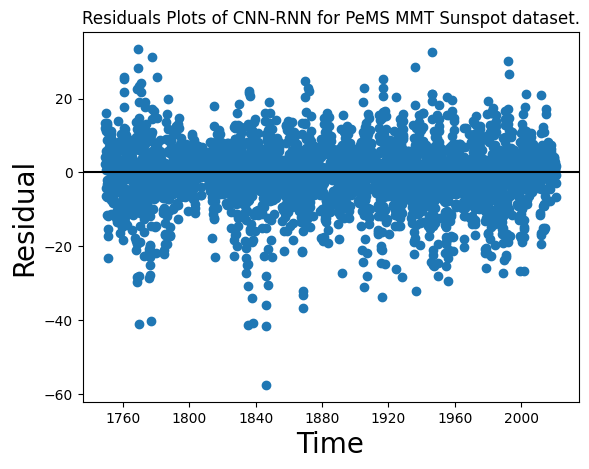

In [ ]:
actual_arr_CNN_RNN = np.array(results_CNN_RNN['Actual'])
predicted_arr_CNN_RNN = np.array(results_CNN_RNN['Predicted'])
residuals_CNN_RNN = predicted_arr_CNN_RNN - actual_arr_CNN_RNN
plt.scatter(results_CNN_RNN['Date'], residuals_CNN_RNN)
plt.axhline(y=0, color = 'black')
plt.title("Residuals Plots of CNN-RNN for PeMS {} dataset.".format(feature_field))
plt.xlabel("Time", fontsize = 20)
plt.ylabel("Residual", fontsize = 20)
plt.show()

From the residual plots for the CNN-RNN model, it can be concluded that the CNN-RNN model is a good fit.

### Energy Consumption

In [ ]:
# Removed keras_spiking.ModelEnergy calls from here as requested

In [ ]:
# Removed keras_spiking.ModelEnergy calls from here as requested

In [ ]:
start_time = time.time()
# Run inference or training with your rnn_model here
end_time = time.time()

execution_time = end_time - start_time
print("Model execution time:", execution_time, "seconds")

Model execution time: 6.67572021484375e-05 seconds


## CNN-LSTM model

### Create CNN-LSTM Model.


In [ ]:
cnn_lstm_model = Sequential()

cnn_lstm_model.add(Conv1D(filters=filter, kernel_size=kernel, activation=activation,
                         input_shape=(seq_len, X_train.shape[2])))
cnn_lstm_model.add(MaxPooling1D(pool_size=2))

cnn_lstm_model.add(Conv1D(filters=filter, kernel_size=kernel, activation=activation,
                         input_shape=(seq_len, X_train.shape[2])))
cnn_lstm_model.add(MaxPooling1D(pool_size=2))

#cnn_lstm_model.add(Conv1D(filters=60, kernel_size=2, activation='relu',
#input_shape=(seq_len, X_train.shape[2])))
#cnn_lstm_model.add(MaxPooling1D(pool_size=2))

#cnn_lstm_model.add(LSTM(60,activation="tanh",return_sequences=True,
#input_shape=(X_train.shape[1],1)))
#cnn_lstm_model.add(Dropout(0.5))

#cnn_lstm_model.add(LSTM(64,activation="tanh",return_sequences=True))
#cnn_lstm_model.add(Dropout(0.8))

#cnn_lstm_model.add(LSTM(64, activation="tanh",return_sequences=True))
#cnn_lstm_model.add(Dropout(0.8))

cnn_lstm_model.add(LSTM(unit, activation=activation,return_sequences=False))
cnn_lstm_model.add(Dropout(0.1))

cnn_lstm_model.add(Dense(1))
cnn_lstm_model.compile(optimizer='adam', loss='mse')
cnn_lstm_model.summary()

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_4 (Conv1D)               │ (None, 18, 32)         │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_4 (MaxPooling1D)  │ (None, 9, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_5 (Conv1D)               │ (None, 7, 32)          │         3,104 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_5 (MaxPooling1D)  │ (None, 3, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ (None, 32)             │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,585 (45.25 KB)

 Trainable params: 11,585 (45.25 KB)

 Non-trainable params: 0 (0.00 B)

### Train CNN-LSTM Model.

Epoch 1/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0146
Epoch 2/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0092
Epoch 3/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0077
Epoch 4/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0068
Epoch 5/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0066
Epoch 6/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0068
Epoch 7/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0063
Epoch 8/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0061
Epoch 9/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0060
Epoch 10/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0059


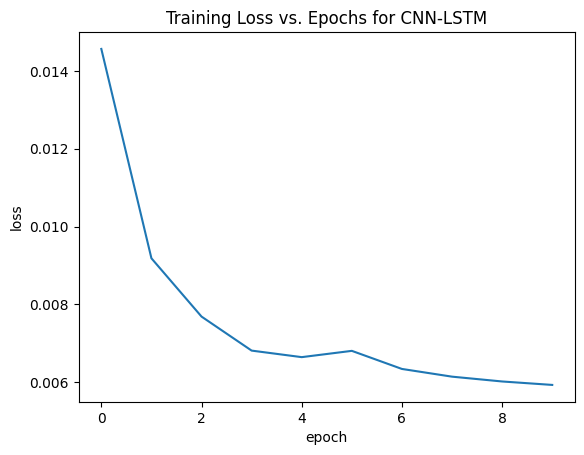

In [ ]:
cnn_lstm_model.compile(optimizer="adam",loss=loss)
cnn_lstm_epochs = cnn_lstm_model.fit(X_train, y_train, epochs=epochs,
                                     batch_size=batch_size)
plot_training_loss(cnn_lstm_epochs, "CNN-LSTM")

### Evaluate CNN-LSTM model using MAE, RMSE, and R^2.

In [ ]:
print("CNN-LSTM Predictions for Training Set")
cnn_lstm_pred_train = cnn_lstm_model.predict(X_train)
print("CNN-LSTM Predictions for Testing Set")
cnn_lstm_pred_test = cnn_lstm_model.predict(X_test)
cnn_lstm_mae = mean_absolute_error(y_test,cnn_lstm_pred_test)
print("MAE of CNN-LSTM model = ",cnn_lstm_mae)
cnn_lstm_rmse =  mean_squared_error(y_test,cnn_lstm_pred_test) ** 0.5
print("RMSE of CNN-LSTM model = ",cnn_lstm_rmse)
cnn_lstm_r2_score = r2_score(y_test, cnn_lstm_pred_test)
print("R^2 Score of CNN-LSTM model = ",cnn_lstm_r2_score)
cnn_lstm_mape_score = 100*mean_absolute_percentage_error(y_test,
                                                         cnn_lstm_pred_test)
print("MAPE Score of CNN-LSTM model = {0} %".format(cnn_lstm_mape_score))

CNN-LSTM Predictions for Training Set
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
CNN-LSTM Predictions for Testing Set
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
MAE of CNN-LSTM model =  0.05055447515469497
RMSE of CNN-LSTM model =  0.06726717711634915
R^2 Score of CNN-LSTM model =  0.8527211532285028
MAPE Score of CNN-LSTM model = 16298099262725.805 %


In [ ]:
perform_statistical_tests(y_test, cnn_lstm_pred_test, "CNN-LSTM")


--- Statistical Tests for CNN-LSTM ---
Paired t-test could not be performed: name 'scipy' is not defined
Wilcoxon Signed-Rank Test could not be performed: name 'scipy' is not defined


### Calculate 95% Confidence Intervals for CNN-LSTM MAE and RMSE

In [ ]:
cnn_lstm_mae_ci_lower, cnn_lstm_mae_ci_upper = calculate_bootstrap_ci(y_test, cnn_lstm_pred_test.flatten(), mean_absolute_error)
print(f"CNN-LSTM MAE 95% CI: [{cnn_lstm_mae_ci_lower:.4f}, {cnn_lstm_mae_ci_upper:.4f}]")

cnn_lstm_rmse_ci_lower, cnn_lstm_rmse_ci_upper = calculate_bootstrap_ci(y_test, cnn_lstm_pred_test.flatten(), lambda yt, yp: mean_squared_error(yt, yp)**0.5)
print(f"CNN-LSTM RMSE 95% CI: [{cnn_lstm_rmse_ci_lower:.4f}, {cnn_lstm_rmse_ci_upper:.4f}]")

CNN-LSTM MAE 95% CI: [0.0471, 0.0541]
CNN-LSTM RMSE 95% CI: [0.0628, 0.0719]


### Reverse Transform Scaler to Convert to Real Values.

In [ ]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
cnn_lstm_pred_inv_train = scaler.inverse_transform(cnn_lstm_pred_train)
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
cnn_lstm_pred_inv_test = scaler.inverse_transform(cnn_lstm_pred_test)

# Get values after inverse transformation.
y_train_inverse = y_train_inverse.flatten()
cnn_lstm_pred_inv_train = cnn_lstm_pred_inv_train.flatten()
y_test_inverse = y_test_inverse.flatten()
cnn_lstm_pred_inv_test = cnn_lstm_pred_inv_test.flatten()

### Showing Actual y and Predicted y values as Dataframes.


In [ ]:
results_CNN_LSTM_train = pd.DataFrame({"Date":first_6169_index_dates,
                                 'Actual': y_train_inverse,
                                 'Predicted': cnn_lstm_pred_inv_train})
results_CNN_LSTM_train

,Date,Actual,Predicted
0,1749-01-31,166.046459,168.654648
1,1749-02-28,153.591035,166.807114
2,1749-03-31,152.418759,166.529907
3,1749-04-30,158.338749,169.079117
4,1749-05-31,155.701130,165.546494
...,...,...,...
2607,1966-04-30,173.959317,165.418839
2608,1966-05-31,172.054370,164.789749
2609,1966-06-30,167.951406,165.986008
2610,1966-07-31,159.745480,165.217682


In [ ]:
# Now let's see our actual y and predicted y values as dataframes
results_CNN_LSTM_test = pd.DataFrame({"Date":last_6169_index_dates,
                                 'Actual': y_test_inverse,
                                 'Predicted': cnn_lstm_pred_inv_test})
results_CNN_LSTM_test

,Date,Actual,Predicted
0,1968-05-31,174.252386,170.062698
1,1968-06-30,167.277348,166.615585
2,1968-07-31,161.415972,162.054977
3,1968-08-31,166.867052,163.557251
4,1968-09-30,170.149422,164.731903
...,...,...,...
628,2020-09-30,121.675841,125.023521
629,2020-10-31,125.720191,125.399742
630,2020-11-30,131.464340,126.045837
631,2020-12-31,127.888900,126.175537


### Plotting Predictions for VHT/VMT/Q made by CNN-LSTM Model.

#### Only Testing Data.

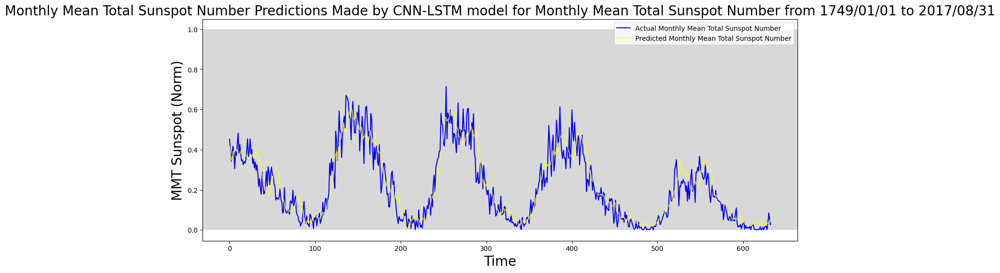

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(cnn_lstm_pred_test, alpha=0.7, color='yellow', \
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions Made by CNN-LSTM model for {1}".
          format(feature, title_name), fontsize = 20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 20)
plt.ylabel(feature_norm, fontsize = 20)
plt.legend()
plt.show()

#### Training and Testing Data Comsbined.

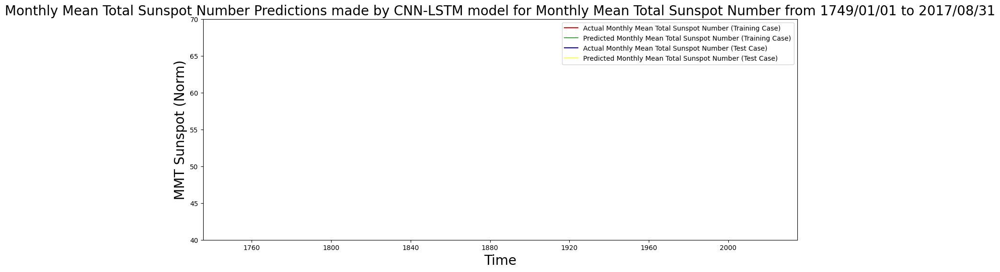

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(results_CNN_LSTM_train['Date'], results_CNN_LSTM_train['Actual'],
         color='red', label=f'Actual {feature} (Training Case)')
plt.plot(results_CNN_LSTM_train['Date'],  results_CNN_LSTM_train['Predicted'],
         alpha=0.7, color='green', label=f'Predicted {feature} (Training Case)')
plt.plot(results_CNN_RNN_test['Date'], results_CNN_RNN_test['Actual'],
         color='blue', label=f'Actual {feature} (Test Case)')
plt.plot(results_CNN_RNN_test['Date'], results_CNN_RNN_test['Predicted'],
         alpha=0.7, color='yellow', label=f'Predicted {feature} (Test Case)')
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by CNN-LSTM model for {1}".
          format(feature, title_name), fontsize = 20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 20)
plt.ylabel(feature_norm, fontsize = 20)
plt.legend()
plt.show()

### Combine Actual and Predicted Results for Train and Test Cases for CNN-LSTM.



In [ ]:
results_CNN_LSTM = [results_CNN_LSTM_train, results_CNN_LSTM_test]
results_CNN_LSTM = pd.concat(results_CNN_LSTM)
display(results_CNN_LSTM)

,Date,Actual,Predicted
0,1749-01-31,166.046459,168.654648
1,1749-02-28,153.591035,166.807114
2,1749-03-31,152.418759,166.529907
3,1749-04-30,158.338749,169.079117
4,1749-05-31,155.701130,165.546494
...,...,...,...
628,2020-09-30,121.675841,125.023521
629,2020-10-31,125.720191,125.399742
630,2020-11-30,131.464340,126.045837
631,2020-12-31,127.888900,126.175537


### Plotting Residuals for Actual and Predicted Results for CNN-LSTM.

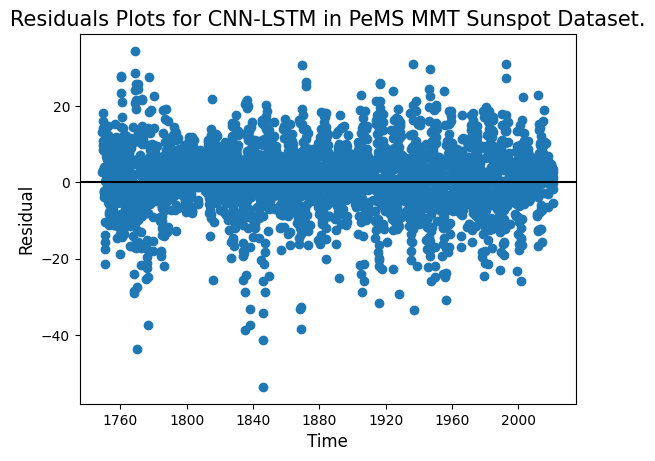

In [ ]:
actual_arr_CNN_LSTM = np.array(results_CNN_LSTM['Actual'])
predicted_arr_CNN_LSTM = np.array(results_CNN_LSTM['Predicted'])
residuals_CNN_LSTM = predicted_arr_CNN_LSTM - actual_arr_CNN_LSTM
plt.scatter(results_CNN_LSTM['Date'], residuals_CNN_LSTM)
plt.axhline(y=0, color = 'black')
plt.title("Residuals Plots for CNN-LSTM in PeMS {} Dataset.".
          format(feature_field), fontsize=15)
#plt.locator_params(axis='x', nbins=10)
#plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel("Time", fontsize = 12)
plt.ylabel("Residual", fontsize = 12)
plt.show()

From the residual plots for the CNN-LSTM model, it can be concluded that the CNN-LSTM model is a good fit.

### Energy Consumption

In [ ]:
measure_ann_energy(cnn_lstm_model, X_test)

Measuring inference time and estimating energy on CPU (for ANN)...
  CPU Inference Time: 0.1195 seconds
  Estimated CPU Energy: 9.5587 Joules (9558715.8203 µJ)

No GPU available. GPU measurements skipped.


{'model_name': 'sequential_8',
 'cpu_inference_time_s': 0.11948394775390625,
 'estimated_cpu_energy_J': 9.5587158203125,
 'estimated_cpu_energy_uJ': 9558715.8203125,
 'gpu_inference_time_s': None,
 'estimated_gpu_energy_J': None,
 'estimated_gpu_energy_uJ': None,
 'snn_spike_energy_uJ': None}

## CNN-LSTM Model Version 2

This version was taken from https://www.nature.com/articles/s41598-023-41314-y#Sec3



### Create CNN-LSTM Model Version 2.

In [ ]:
cnn_lstm_v2 = Sequential()

#cnn_lstm_v2.add(Conv1D(filters=32, kernel_size=2, activation='tanh',
#                        input_shape=(seq_len, X_train.shape[2])))
cnn_lstm_v2.add(Conv1D(filters=32, kernel_size=2, activation='tanh',
                        input_shape=(100, X_train.shape[2])))
cnn_lstm_v2.add(MaxPooling1D(pool_size=2))

#cnn_lstm_v2.add(Conv1D(filters=32, kernel_size=2, activation='tanh',
#                         input_shape=(seq_len, X_train.shape[2])))
cnn_lstm_v2.add(Conv1D(filters=32, kernel_size=2, activation='tanh',
                         input_shape=(100, X_train.shape[2])))
#cnn_lstm_v2.add(TimeDistributed(MaxPooling2D(pool_size=2)))
#cnn_lstm_v2.add(TimeDistributed(Flatten()))


#cnn_lstm_v2.add(Conv1D(filters=60, kernel_size=2, activation='relu',
#input_shape=(seq_len, X_train.shape[2])))
#cnn_lstm_v2.add(MaxPooling1D(pool_size=2))

#cnn_lstm_v2.add(LSTM(60,activation="tanh",return_sequences=True,
#input_shape=(X_train.shape[1],1)))
#cnn_lstm_v2.add(Dropout(0.5))

#cnn_lstm_v2.add(LSTM(64,activation="tanh",return_sequences=True))
#cnn_lstm_v2.add(Dropout(0.8))

cnn_lstm_v2.add(LSTM(32, activation="tanh",return_sequences=True))
#cnn_lstm_v2.add(Dropout(0.8))

cnn_lstm_v2.add(LSTM(32, activation="tanh",return_sequences=False))
#cnn_lstm_v2.add(Dropout(0.1))

cnn_lstm_v2.add(Dense(1))
cnn_lstm_v2.compile(optimizer='adam', loss='mse')
#cnn_lstm_v2.build(input_shape=(batch_size, seq_len, X_train.shape[1], X_train.shape[2], 1)) # Replace None with your batch size if known

cnn_lstm_v2.summary()

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_6 (Conv1D)               │ (None, 99, 32)         │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_6 (MaxPooling1D)  │ (None, 49, 32)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_7 (Conv1D)               │ (None, 48, 32)         │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_3 (LSTM)                   │ (None, 48, 32)         │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_4 (LSTM)                   │ (None, 32)             │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 18,849 (73.63 KB)

 Trainable params: 18,849 (73.63 KB)

 Non-trainable params: 0 (0.00 B)

### Train CNN-LSTM Model V2.

Epoch 1/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 6s 16ms/step - loss: 0.0139
Epoch 2/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0085
Epoch 3/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0062
Epoch 4/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0059
Epoch 5/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0058
Epoch 6/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0056
Epoch 7/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0055
Epoch 8/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0054
Epoch 9/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0056
Epoch 10/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0053


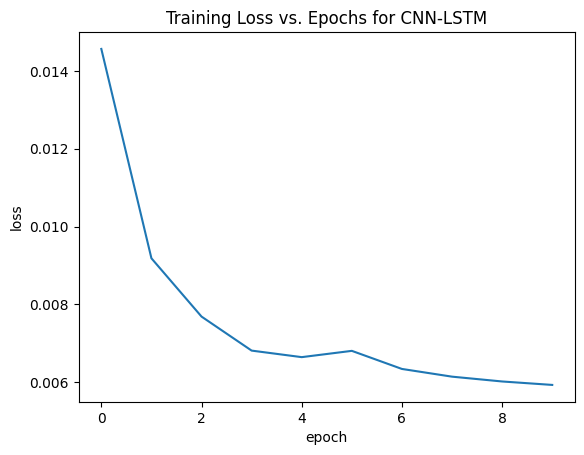

In [ ]:
cnn_lstm_v2.compile(optimizer="adam",loss=loss)
cnn_lstm_v2_epochs = cnn_lstm_v2.fit(X_train, y_train, epochs=epochs,
                                     batch_size=batch_size)
plot_training_loss(cnn_lstm_epochs, "CNN-LSTM")

### Evaluate CNN-LSTM V2 model using MAE, RMSE, and R^2.

In [ ]:
print("CNN-LSTM Predictions for Training Set")
cnn_lstm_pred_train_v2 = cnn_lstm_v2.predict(X_train)
print("CNN-LSTM Predictions for Testing Set")
cnn_lstm_pred_test_v2 = cnn_lstm_v2.predict(X_test)
cnn_lstm_v2_mae = mean_absolute_error(y_test,cnn_lstm_pred_test_v2)
print("MAE of CNN-LSTM model = ",cnn_lstm_v2_mae)
cnn_lstm_v2_rmse =  mean_squared_error(y_test,cnn_lstm_pred_test_v2) ** 0.5
print("RMSE of CNN-LSTM model = ",cnn_lstm_v2_rmse)
cnn_lstm_v2_r2_score = r2_score(y_test, cnn_lstm_pred_test_v2)
print("R^2 Score of CNN-LSTM model = ",cnn_lstm_v2_r2_score)
cnn_lstm_v2_mape_score = 100*mean_absolute_percentage_error(y_test,
                                                         cnn_lstm_pred_test_v2)
print("MAPE Score of CNN-LSTM model = {0} %".format(cnn_lstm_v2_mape_score))

CNN-LSTM Predictions for Training Set
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
CNN-LSTM Predictions for Testing Set
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
MAE of CNN-LSTM model =  0.05217674365116578
RMSE of CNN-LSTM model =  0.06899273507027645
R^2 Score of CNN-LSTM model =  0.8450681548037002
MAPE Score of CNN-LSTM model = 18665418774129.273 %


In [ ]:
perform_statistical_tests(y_test, cnn_lstm_pred_test_v2, "CNN-LSTM V2")


--- Statistical Tests for CNN-LSTM V2 ---
Paired t-test could not be performed: name 'scipy' is not defined
Wilcoxon Signed-Rank Test could not be performed: name 'scipy' is not defined


### Calculate 95% Confidence Intervals for CNN-LSTM V2 MAE and RMSE

In [ ]:
cnn_lstm_v2_mae_ci_lower, cnn_lstm_v2_mae_ci_upper = calculate_bootstrap_ci(y_test, cnn_lstm_pred_test_v2.flatten(), mean_absolute_error)
print(f"CNN-LSTM V2 MAE 95% CI: [{cnn_lstm_v2_mae_ci_lower:.4f}, {cnn_lstm_v2_mae_ci_upper:.4f}]")

cnn_lstm_v2_rmse_ci_lower, cnn_lstm_v2_rmse_ci_upper = calculate_bootstrap_ci(y_test, cnn_lstm_pred_test_v2.flatten(), lambda yt, yp: mean_squared_error(yt, yp)**0.5)
print(f"CNN-LSTM V2 RMSE 95% CI: [{cnn_lstm_v2_rmse_ci_lower:.4f}, {cnn_lstm_v2_rmse_ci_upper:.4f}]")

CNN-LSTM V2 MAE 95% CI: [0.0484, 0.0558]
CNN-LSTM V2 RMSE 95% CI: [0.0644, 0.0738]


### Reverse Transform Scaler to Convert to Real Values.

In [ ]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
cnn_lstm_pred_inv_train_v2 = scaler.inverse_transform(cnn_lstm_pred_train_v2)
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
cnn_lstm_pred_inv_test_v2 = scaler.inverse_transform(cnn_lstm_pred_test_v2)

# Get values after inverse transformation.
y_train_inverse = y_train_inverse.flatten()
cnn_lstm_pred_inv_train_v2 = cnn_lstm_pred_inv_train_v2.flatten()
y_test_inverse = y_test_inverse.flatten()
cnn_lstm_pred_inv_test_v2 = cnn_lstm_pred_inv_test_v2.flatten()

### Showing Actual y and Predicted y values as Dataframes.

In [ ]:
results_CNN_LSTM_train_v2 = pd.DataFrame({"Date":first_6169_index_dates,
                                 'Actual': y_train_inverse,
                                 'Predicted': cnn_lstm_pred_inv_train_v2})
results_CNN_LSTM_train_v2

,Date,Actual,Predicted
0,1749-01-31,166.046459,168.875488
1,1749-02-28,153.591035,170.484207
2,1749-03-31,152.418759,169.908859
3,1749-04-30,158.338749,166.878098
4,1749-05-31,155.701130,163.947052
...,...,...,...
2607,1966-04-30,173.959317,164.631882
2608,1966-05-31,172.054370,164.749039
2609,1966-06-30,167.951406,167.319717
2610,1966-07-31,159.745480,169.569046


In [ ]:
# Now let's see our actual y and predicted y values as dataframes
results_CNN_LSTM_test_v2 = pd.DataFrame({"Date":last_6169_index_dates,
                                 'Actual': y_test_inverse,
                                 'Predicted': cnn_lstm_pred_inv_test_v2})
results_CNN_LSTM_test_v2

,Date,Actual,Predicted
0,1968-05-31,174.252386,168.258011
1,1968-06-30,167.277348,165.097748
2,1968-07-31,161.415972,168.584793
3,1968-08-31,166.867052,169.060822
4,1968-09-30,170.149422,168.241928
...,...,...,...
628,2020-09-30,121.675841,125.123199
629,2020-10-31,125.720191,125.683052
630,2020-11-30,131.464340,125.851608
631,2020-12-31,127.888900,126.717484


### Plotting Predictions for VHT/VMT/Q made by CNN-LSTM V2 Model.

#### Only Testing Data

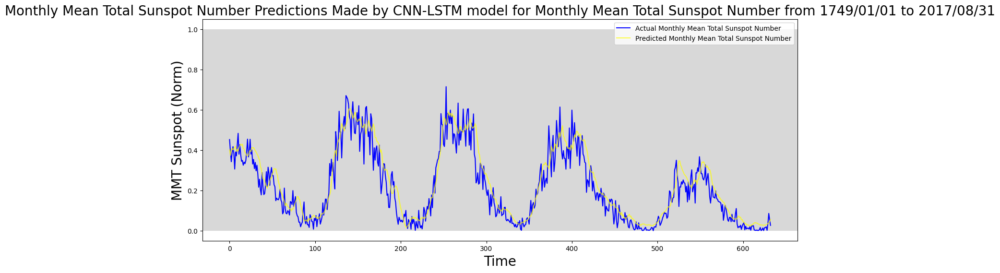

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(cnn_lstm_pred_test_v2, alpha=0.7, color='yellow', \
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions Made by CNN-LSTM model for {1}".
          format(feature, title_name), fontsize = 20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 20)
plt.ylabel(feature_norm, fontsize = 20)
plt.legend()
plt.show()

#### Training and Testing Data Combined.

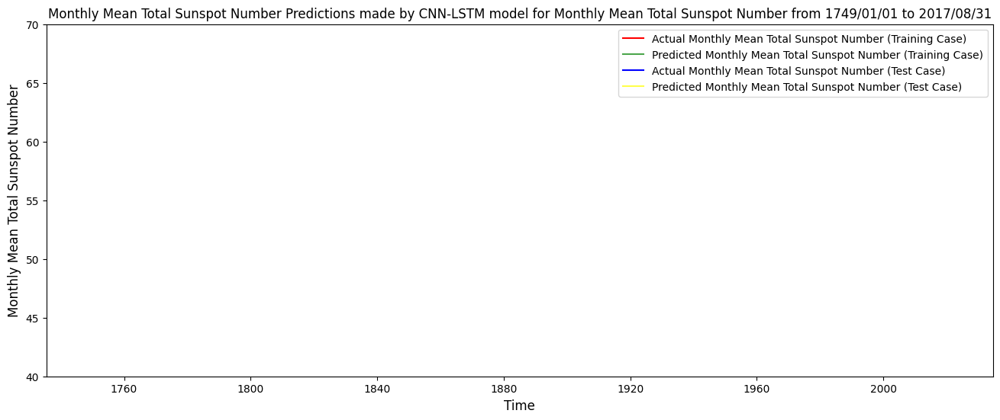

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(results_CNN_LSTM_train_v2['Date'], results_CNN_LSTM_train_v2['Actual'],
         color='red', label=f'Actual {feature} (Training Case)')
plt.plot(results_CNN_LSTM_train_v2['Date'],
         results_CNN_LSTM_train_v2['Predicted'], alpha=0.7, color='green',
         label=f'Predicted {feature} (Training Case)')
plt.plot(results_CNN_LSTM_test_v2['Date'], results_CNN_LSTM_test_v2['Actual'],
         color='blue', label=f'Actual {feature} (Test Case)')
plt.plot(results_CNN_LSTM_test_v2['Date'], results_CNN_LSTM_test_v2['Predicted'],
         alpha=0.7, color='yellow', label=f'Predicted {feature} (Test Case)')
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by CNN-LSTM model for {1}".
          format(feature, title_name))
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 12)
plt.ylabel(feature, fontsize = 12)
plt.legend()
plt.show()

### Combine Actual and Predicted Results for Train and Test Cases for CNN-LSTM v2.

In [ ]:
results_CNN_LSTM_v2 = [results_CNN_LSTM_train_v2, results_CNN_LSTM_test_v2]
results_CNN_LSTM_v2 = pd.concat(results_CNN_LSTM_v2)
display(results_CNN_LSTM_v2)

,Date,Actual,Predicted
0,1749-01-31,166.046459,168.875488
1,1749-02-28,153.591035,170.484207
2,1749-03-31,152.418759,169.908859
3,1749-04-30,158.338749,166.878098
4,1749-05-31,155.701130,163.947052
...,...,...,...
628,2020-09-30,121.675841,125.123199
629,2020-10-31,125.720191,125.683052
630,2020-11-30,131.464340,125.851608
631,2020-12-31,127.888900,126.717484


### Plotting Residuals for Actual and Predicted Results for CNN-LSTM v2.

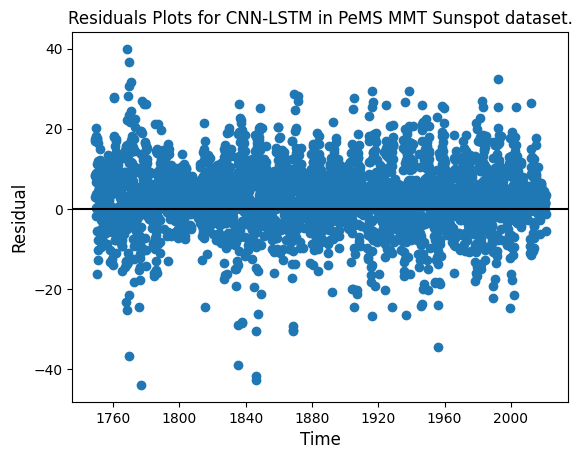

In [ ]:
actual_arr_CNN_LSTM_v2 = np.array(results_CNN_LSTM_v2['Actual'])
predicted_arr_CNN_LSTM_v2 = np.array(results_CNN_LSTM_v2['Predicted'])
residuals_CNN_LSTM_v2 = predicted_arr_CNN_LSTM_v2 - actual_arr_CNN_LSTM_v2
plt.scatter(results_CNN_LSTM_v2['Date'], residuals_CNN_LSTM_v2)
plt.axhline(y=0, color = 'black')
plt.title("Residuals Plots for CNN-LSTM in PeMS {} dataset.".format(feature_field))
#plt.locator_params(axis='x', nbins=10)
#plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel("Time", fontsize = 12)
plt.ylabel("Residual", fontsize = 12)
plt.show()

### Energy Consumption

In [ ]:
measure_ann_energy(cnn_lstm_v2, X_test)

Measuring inference time and estimating energy on CPU (for ANN)...
  CPU Inference Time: 0.2255 seconds
  Estimated CPU Energy: 18.0412 Joules (18041210.1746 µJ)

No GPU available. GPU measurements skipped.


{'model_name': 'sequential_9',
 'cpu_inference_time_s': 0.22551512718200684,
 'estimated_cpu_energy_J': 18.041210174560547,
 'estimated_cpu_energy_uJ': 18041210.174560547,
 'gpu_inference_time_s': None,
 'estimated_gpu_energy_J': None,
 'estimated_gpu_energy_uJ': None,
 'snn_spike_energy_uJ': None}

## CNN-LSTM v3 Implementation
This implementation was taken from https://github.com/Pradnya1208/Time-series-forecasting-using-Deep-Learning/blob/main/deep_learning_for_time_series_forecasting.ipynb

### Spiking Activation Layer

In [ ]:
@keras.saving.register_keras_serializable()
class SpikingActivationCell(tf.keras.layers.Layer):
    def __init__(self, activation='tanh', threshold=1.0, dt=1.0, spiking_aware_training=False, **kwargs):
        super(SpikingActivationCell, self).__init__(**kwargs)
        self.activation = activation
        self.threshold = threshold
        self.dt = dt
        self.spiking_aware_training = spiking_aware_training
        self.state_size = 1  # State to store membrane potential

    def build(self, input_shape):
        self.membrane_potential = self.add_weight(
            name='membrane_potential',
            shape=(input_shape[-1],),
            initializer='zeros',
            trainable=False
        )
        super(SpikingActivationCell, self).build(input_shape)

    def call(self, inputs, states, training=None):
        prev_membrane_potential = states[0]

        # Apply activation function
        activated_input = tf.keras.activations.get(self.activation)(inputs)

        # Update membrane potential
        membrane_potential = prev_membrane_potential + activated_input * self.dt

        # Generate spikes based on threshold
        if training and self.spiking_aware_training:
            # Use a surrogate gradient during training
            # This is a common surrogate gradient (Heaviside step function with identity gradient)
            spikes = tf.where(membrane_potential >= self.threshold,
                              tf.ones_like(membrane_potential),
                              tf.zeros_like(membrane_potential))
            # Define the surrogate gradient
            @tf.custom_gradient
            def surrogate_spike(x):
                spike = tf.where(x >= self.threshold, tf.ones_like(x), tf.zeros_like(x))
                def grad(dy):
                    # Here we use an identity gradient for simplicity, you might use others
                    return dy
                return spike, grad
            spikes = surrogate_spike(membrane_potential)
        else:
            # Use standard spiking during inference/evaluation
            spikes = tf.cast(membrane_potential >= self.threshold, dtype=tf.float32)

        # Reset membrane potential after spike
        membrane_potential = membrane_potential - spikes * self.threshold

        # Return the spikes and the updated membrane potential as the new state
        return spikes, [membrane_potential]

@keras.saving.register_keras_serializable()
class SpikingActivationLayer(tf.keras.layers.RNN):
    def __init__(self, activation='tanh', threshold=1.0, dt=1.0, spiking_aware_training=False, **kwargs):
        cell = SpikingActivationCell(activation=activation, threshold=threshold,
                                     dt=dt, spiking_aware_training=spiking_aware_training)
        super(SpikingActivationLayer, self).__init__(cell, **kwargs)

    def call(self, inputs, initial_state=None, training=None, **kwargs):
        # Get the input shape
        input_shape = tf.shape(inputs)
        batch_size = input_shape[0]
        num_features = input_shape[-1]

        # Initialize the state if it's not provided
        if initial_state is None:
            # The initial state for the cell is a list of tensors. Since state_size is 1,
            # the initial state should be a list containing one tensor.
            initial_state = [tf.zeros((batch_size, num_features), dtype=tf.float32)]

        # Call the RNN with the correct initial state and training flag
        # The training flag from the layer's call method is passed to the cell's call method
        return super(SpikingActivationLayer, self).call(inputs,
                                                        initial_state=initial_state,
                                                        training=training,
                                                        **kwargs)

    # This method is usually called internally by Keras to determine the shape
    # of the output tensor. It should align with the arguments received in the
    # `call()` method. Based on the error, the argument `sequences_shape` should
    # be aligned with the `inputs` argument of `call()`.
    def compute_output_shape(self, input_shape):
        return input_shape

    # Override the build method to accept and ignore the sequences_shape argument
    # This is often not needed for RNN layers that handle variable length sequences,
    # but keeping it here for consistency with your original code structure.
    def build(self, input_shape):
        # Call the parent class's build method, passing only the input_shape
        super(SpikingActivationLayer, self).build(input_shape)


### Creating CNN-LSTM model Version 3.

In [ ]:
# For this implementation, this will require a reshaping of the input shape.
# The input shape will be  [samples, subsequences = 2, timesteps = seq_len,
# features = 1].
X_train_v3 = X_train.reshape(X_train.shape[0], 1, seq_len, X_train.shape[2])
X_test_v3 = X_test.reshape(X_test.shape[0], 1, seq_len, X_test.shape[2])

In [ ]:
cnn_lstm_v3 = Sequential()

# Reshape the input to have 3 dimensions within the TimeDistributed layer
cnn_lstm_v3.add(TimeDistributed(Conv1D(filters=64, kernel_size=1,
                                       activation='relu',
                                       input_shape=(None,
                                                    X_train_v3.shape[2],
                                                    X_train_v3.shape[3]))))
cnn_lstm_v3.add(TimeDistributed(MaxPooling1D(pool_size=2)))
cnn_lstm_v3.add(TimeDistributed(Flatten()))
cnn_lstm_v3.add(LSTM(50, activation='relu'))
cnn_lstm_v3.add(Dense(1))
cnn_lstm_v3.compile(loss='mse', optimizer='adam')
#cnn_lstm_v3.build(input_shape=(None,X_train_v3.shape[2], X_train_v3.shape[3]))
#cnn_lstm_v3.summary()

### Train CNN-LSTM Model V3.

Epoch 1/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 0.0118
Epoch 2/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0054
Epoch 3/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0048
Epoch 4/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0048
Epoch 5/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0046
Epoch 6/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0044
Epoch 7/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0044
Epoch 8/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0044
Epoch 9/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0044
Epoch 10/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0043


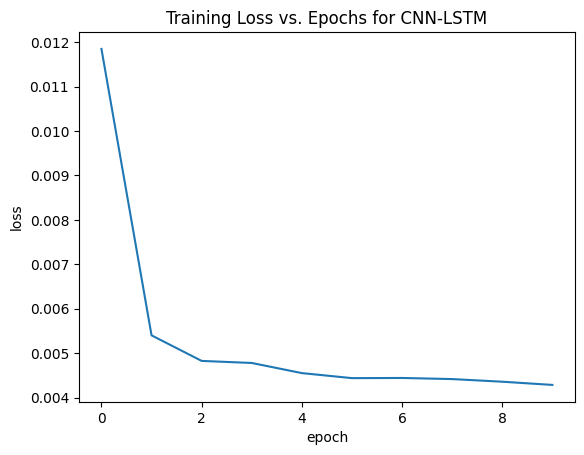

In [ ]:
cnn_lstm_v3.compile(optimizer="adam",loss=loss)
cnn_lstm_v3_epochs = cnn_lstm_v3.fit(X_train_v3, y_train, epochs=epochs,
                                     batch_size=batch_size)
plot_training_loss(cnn_lstm_v3_epochs, "CNN-LSTM")

### Evaluate CNN-LSTM V3 model using MAE, RMSE, and R^2.

In [ ]:
print("CNN-LSTM Predictions for Training Set")
cnn_lstm_pred_train_v3 = cnn_lstm_v3.predict(X_train_v3)
print("CNN-LSTM Predictions for Testing Set")
cnn_lstm_pred_test_v3 = cnn_lstm_v3.predict(X_test_v3)
cnn_lstm_v3_mae = mean_absolute_error(y_test,cnn_lstm_pred_test_v3)
print("MAE of CNN-LSTM model = ",cnn_lstm_v3_mae)
cnn_lstm_v3_rmse =  mean_squared_error(y_test,cnn_lstm_pred_test_v3) ** 0.5
print("RMSE of CNN-LSTM model = ",cnn_lstm_v3_rmse)
cnn_lstm_v3_r2_score = r2_score(y_test, cnn_lstm_pred_test_v3)
print("R^2 Score of CNN-LSTM model = ",cnn_lstm_v3_r2_score)
cnn_lstm_v3_mape_score = 100*mean_absolute_percentage_error(y_test,
                                                         cnn_lstm_pred_test_v3)
print("MAPE Score of CNN-LSTM model = {0} %".format(cnn_lstm_v3_mape_score))

CNN-LSTM Predictions for Training Set
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
CNN-LSTM Predictions for Testing Set
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
MAE of CNN-LSTM model =  0.04198437260216985
RMSE of CNN-LSTM model =  0.05826672035498791
R^2 Score of CNN-LSTM model =  0.8894967333098428
MAPE Score of CNN-LSTM model = 9969184086061.408 %


In [ ]:
perform_statistical_tests(y_test, cnn_lstm_pred_test_v3, "CNN-LSTM V3")


--- Statistical Tests for CNN-LSTM V3 ---
Paired t-test could not be performed: name 'scipy' is not defined
Wilcoxon Signed-Rank Test could not be performed: name 'scipy' is not defined


### Calculate 95% Confidence Intervals for CNN-LSTM V3 MAE and RMSE

In [ ]:
cnn_lstm_v3_mae_ci_lower, cnn_lstm_v3_mae_ci_upper = calculate_bootstrap_ci(y_test, cnn_lstm_pred_test_v3.flatten(), mean_absolute_error)
print(f"CNN-LSTM V3 MAE 95% CI: [{cnn_lstm_v3_mae_ci_lower:.4f}, {cnn_lstm_v3_mae_ci_upper:.4f}]")

cnn_lstm_v3_rmse_ci_lower, cnn_lstm_v3_rmse_ci_upper = calculate_bootstrap_ci(y_test, cnn_lstm_pred_test_v3.flatten(), lambda yt, yp: mean_squared_error(yt, yp)**0.5)
print(f"CNN-LSTM V3 RMSE 95% CI: [{cnn_lstm_v3_rmse_ci_lower:.4f}, {cnn_lstm_v3_rmse_ci_upper:.4f}]")

CNN-LSTM V3 MAE 95% CI: [0.0389, 0.0452]
CNN-LSTM V3 RMSE 95% CI: [0.0539, 0.0630]


### Reverse Transform Scaler to Convert to Real Values.

In [ ]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
cnn_lstm_pred_inv_train_v3 = scaler.inverse_transform(cnn_lstm_pred_train_v3)
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
cnn_lstm_pred_inv_test_v3 = scaler.inverse_transform(cnn_lstm_pred_test_v3)

# Get values after inverse transformation.
y_train_inverse = y_train_inverse.flatten()
cnn_lstm_pred_inv_train_v3 = cnn_lstm_pred_inv_train_v3.flatten()
y_test_inverse = y_test_inverse.flatten()
cnn_lstm_pred_inv_test_v3 = cnn_lstm_pred_inv_test_v3.flatten()

### Showing Actual y and Predicted y values as Dataframes.

In [ ]:
results_CNN_LSTM_train_v3 = pd.DataFrame({"Date":first_6169_index_dates,
                                 'Actual': y_train_inverse,
                                 'Predicted': cnn_lstm_pred_inv_train_v3})
results_CNN_LSTM_train_v3

,Date,Actual,Predicted
0,1749-01-31,166.046459,168.802277
1,1749-02-28,153.591035,164.418472
2,1749-03-31,152.418759,161.683426
3,1749-04-30,158.338749,156.019852
4,1749-05-31,155.701130,157.721512
...,...,...,...
2607,1966-04-30,173.959317,159.990768
2608,1966-05-31,172.054370,166.888565
2609,1966-06-30,167.951406,166.133423
2610,1966-07-31,159.745480,166.070312


In [ ]:
# Now let's see our actual y and predicted y values as dataframes
results_CNN_LSTM_test_v3 = pd.DataFrame({"Date":last_6169_index_dates,
                                 'Actual': y_test_inverse,
                                 'Predicted': cnn_lstm_pred_inv_test_v3})
results_CNN_LSTM_test_v3

,Date,Actual,Predicted
0,1968-05-31,174.252386,160.693192
1,1968-06-30,167.277348,166.245972
2,1968-07-31,161.415972,164.020401
3,1968-08-31,166.867052,160.742508
4,1968-09-30,170.149422,161.196396
...,...,...,...
628,2020-09-30,121.675841,123.805832
629,2020-10-31,125.720191,123.848511
630,2020-11-30,131.464340,124.957306
631,2020-12-31,127.888900,128.202896


### Plotting Predictions for VHT/VMT/Q made by CNN-LSTM V3 Model.

#### Only Testing Data

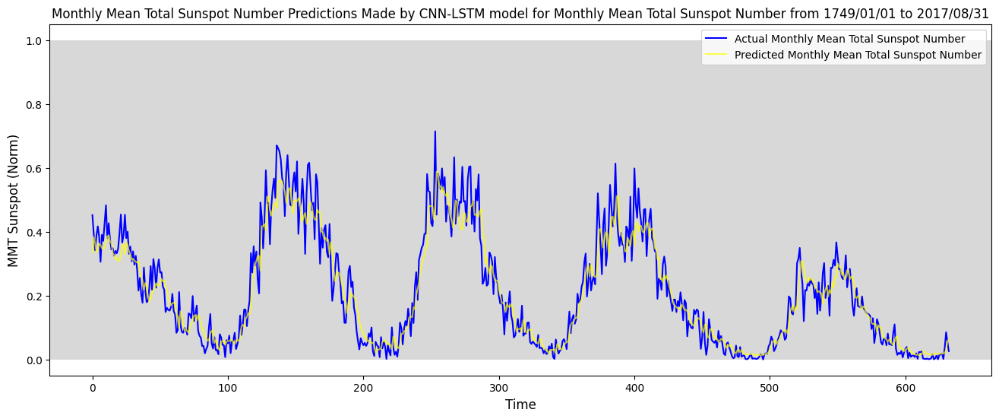

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(cnn_lstm_pred_test_v3, alpha=0.7, color='yellow', \
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions Made by CNN-LSTM model for {1}".
          format(feature, title_name))
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 12)
plt.ylabel(feature_norm, fontsize = 12)
plt.legend()
plt.show()

#### Testing and Training Data Combined.

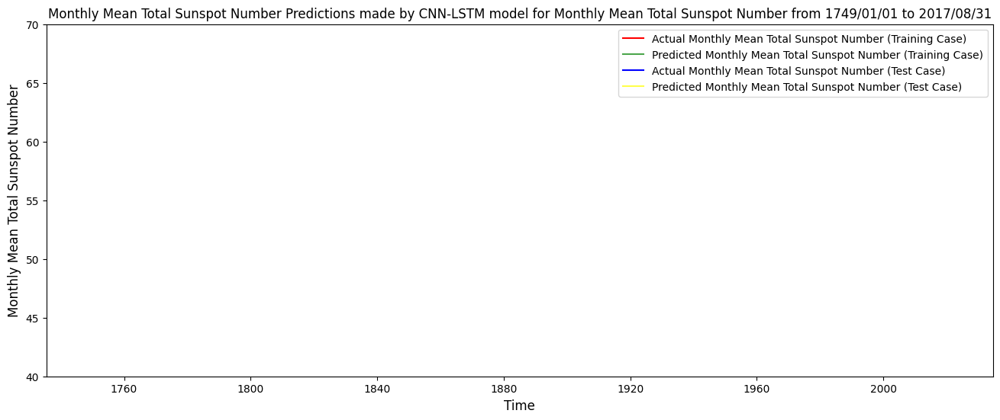

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(results_CNN_LSTM_train_v3['Date'], results_CNN_LSTM_train_v3['Actual'],
         color='red', label=f'Actual {feature} (Training Case)')
plt.plot(results_CNN_LSTM_train_v3['Date'],
         results_CNN_LSTM_train_v3['Predicted'], alpha=0.7, color='green',
         label=f'Predicted {feature} (Training Case)')
plt.plot(results_CNN_LSTM_test_v3['Date'], results_CNN_LSTM_test_v3['Actual'],
         color='blue', label=f'Actual {feature} (Test Case)')
plt.plot(results_CNN_LSTM_test_v3['Date'],
         results_CNN_LSTM_test_v3['Predicted'], alpha=0.7, color='yellow',
         label=f'Predicted {feature} (Test Case)')
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by CNN-LSTM model for {1}"\
          .format(feature, title_name))
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 12)
plt.ylabel(feature, fontsize = 12)
plt.legend()
plt.show()

### Combine Actual and Predicted Results for Train and Test Cases for CNN-LSTM v3.

In [ ]:
results_CNN_LSTM_v3 = [results_CNN_LSTM_train_v3, results_CNN_LSTM_test_v3]
results_CNN_LSTM_v3 = pd.concat(results_CNN_LSTM_v3)
display(results_CNN_LSTM_v3)

,Date,Actual,Predicted
0,1749-01-31,166.046459,168.802277
1,1749-02-28,153.591035,164.418472
2,1749-03-31,152.418759,161.683426
3,1749-04-30,158.338749,156.019852
4,1749-05-31,155.701130,157.721512
...,...,...,...
628,2020-09-30,121.675841,123.805832
629,2020-10-31,125.720191,123.848511
630,2020-11-30,131.464340,124.957306
631,2020-12-31,127.888900,128.202896


### Plotting Residuals for Actual and Predicted Results for CNN-LSTM v3.

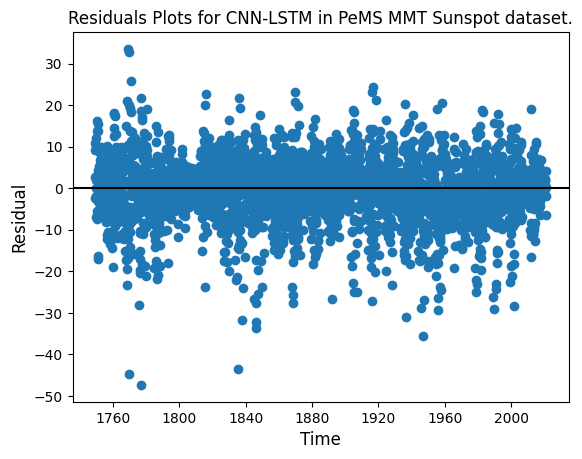

In [ ]:
actual_arr_CNN_LSTM_v3 = np.array(results_CNN_LSTM_v3['Actual'])
predicted_arr_CNN_LSTM_v3 = np.array(results_CNN_LSTM_v3['Predicted'])
residuals_CNN_LSTM_v3 = predicted_arr_CNN_LSTM_v3 - actual_arr_CNN_LSTM_v3
plt.scatter(results_CNN_LSTM_v3['Date'], residuals_CNN_LSTM_v3)
plt.axhline(y=0, color = 'black')
plt.title("Residuals Plots for CNN-LSTM in PeMS {} dataset.".format(feature_field))
#plt.locator_params(axis='x', nbins=10)
#plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel("Time", fontsize = 12)
plt.ylabel("Residual", fontsize = 12)
plt.show()

### Energy Consumption

In [ ]:
measure_ann_energy(cnn_lstm_v3, X_test_v3)

Measuring inference time and estimating energy on CPU (for ANN)...
  CPU Inference Time: 0.1240 seconds
  Estimated CPU Energy: 9.9177 Joules (9917716.9800 µJ)

No GPU available. GPU measurements skipped.


{'model_name': 'sequential_10',
 'cpu_inference_time_s': 0.12397146224975586,
 'estimated_cpu_energy_J': 9.917716979980469,
 'estimated_cpu_energy_uJ': 9917716.979980469,
 'gpu_inference_time_s': None,
 'estimated_gpu_energy_J': None,
 'estimated_gpu_energy_uJ': None,
 'snn_spike_energy_uJ': None}

## LSTM-CNN implementation

### Create and Train LSTM-CNN Model

This implementation was taken from Aditi, & Nagda, Mayank & Eswaran, Poovammal. (2019). Image
 Classification using a Hybrid LSTM-CNN Deep Neural Network. In
ternational Journal of Engineering and Advanced Technology. 8. 1342 1348. 10.35940/ijeat.F8602.088619.

In [ ]:
lstm_cnn_model = Sequential()
lstm_cnn_model.add(LSTM(32, activation="tanh",return_sequences=True,
                        input_shape=(seq_len, X_train.shape[2])))
lstm_cnn_model.add(Dropout(0.5))
lstm_cnn_model.add(Conv1D(filters=32, kernel_size=2, activation='relu'))
lstm_cnn_model.add(MaxPooling1D(pool_size=2))
# Flatten the output before the Dense layer to ensure a single output value
lstm_cnn_model.add(Flatten()) # This line is added
lstm_cnn_model.add(Dense(1))
lstm_cnn_model.compile(optimizer='adam', loss='mse')
lstm_cnn_model.summary()

Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_6 (LSTM)                   │ (None, 20, 32)         │         4,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 20, 32)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_9 (Conv1D)               │ (None, 19, 32)         │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_8 (MaxPooling1D)  │ (None, 9, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 288)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 1)              │           289 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,721 (26.25 KB)

 Trainable params: 6,721 (26.25 KB)

 Non-trainable params: 0 (0.00 B)

### Train LSTM-CNN Model.

Epoch 1/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0126
Epoch 2/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0073
Epoch 3/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0064
Epoch 4/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0064
Epoch 5/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0062
Epoch 6/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0062
Epoch 7/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0060
Epoch 8/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0059
Epoch 9/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0059
Epoch 10/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0059


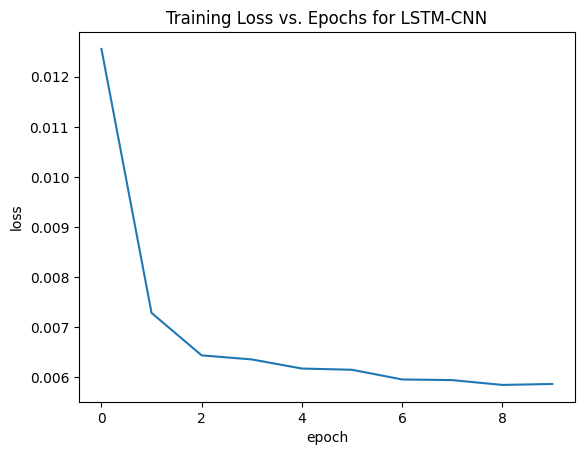

In [ ]:
lstm_cnn_model.compile(optimizer="adam",loss=loss)
lstm_cnn_model_epochs = lstm_cnn_model.fit(X_train, y_train, epochs=epochs,
                                     batch_size=batch_size)
plot_training_loss(lstm_cnn_model_epochs, "LSTM-CNN")

### Evaluate LSTM-CNN model using MAE, RMSE, and MAPE.

In [ ]:
print("LSTM-CNN Predictions for Training Set")
lstm_cnn_pred_train = lstm_cnn_model.predict(X_train)
print("LSTM-CNN Predictions for Testing Set")
lstm_cnn_pred_test = lstm_cnn_model.predict(X_test)
lstm_cnn_mae = mean_absolute_error(y_test,lstm_cnn_pred_test)
print("MAE of LSTM-CNN model = ",lstm_cnn_mae)
lstm_cnn_rmse =  mean_squared_error(y_test,lstm_cnn_pred_test) ** 0.5
print("RMSE of LSTM-CNN model = ",lstm_cnn_rmse)
lstm_cnn_r2_score = r2_score(y_test, lstm_cnn_pred_test)
print("R^2 Score of LSTM-CNN model = ",lstm_cnn_r2_score)
lstm_cnn_mape_score = 100*mean_absolute_percentage_error(y_test,
                                                         lstm_cnn_pred_test)
print("MAPE Score of LSTM-CNN model = {0} %".format(lstm_cnn_mape_score))

LSTM-CNN Predictions for Training Set
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
LSTM-CNN Predictions for Testing Set
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
MAE of LSTM-CNN model =  0.05091974361467776
RMSE of LSTM-CNN model =  0.07061962612847086
R^2 Score of LSTM-CNN model =  0.8376752295778231
MAPE Score of LSTM-CNN model = 13243873350626.574 %


In [ ]:
perform_statistical_tests(y_test, lstm_cnn_pred_test, "LSTM-CNN")


--- Statistical Tests for LSTM-CNN ---
Paired t-test could not be performed: name 'scipy' is not defined
Wilcoxon Signed-Rank Test could not be performed: name 'scipy' is not defined


### Calculate 95% Confidence Intervals for LSTM-CNN MAE and RMSE

In [ ]:
lstm_cnn_mae_ci_lower, lstm_cnn_mae_ci_upper = calculate_bootstrap_ci(y_test, lstm_cnn_pred_test.flatten(), mean_absolute_error)
print(f"LSTM-CNN MAE 95% CI: [{lstm_cnn_mae_ci_lower:.4f}, {lstm_cnn_mae_ci_upper:.4f}]")

lstm_cnn_rmse_ci_lower, lstm_cnn_rmse_ci_upper = calculate_bootstrap_ci(y_test, lstm_cnn_pred_test.flatten(), lambda yt, yp: mean_squared_error(yt, yp)**0.5)
print(f"LSTM-CNN RMSE 95% CI: [{lstm_cnn_rmse_ci_lower:.4f}, {lstm_cnn_rmse_ci_upper:.4f}]")

LSTM-CNN MAE 95% CI: [0.0473, 0.0546]
LSTM-CNN RMSE 95% CI: [0.0658, 0.0759]


### Reverse Transform Scaler to Convert to Real Values.

In [ ]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
lstm_cnn_pred_inv_train = scaler.inverse_transform(lstm_cnn_pred_train)
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
lstm_cnn_pred_inv_test = scaler.inverse_transform(lstm_cnn_pred_test)

# Get values after inverse transformation.
y_train_inverse = y_train_inverse.flatten()
lstm_cnn_pred_inv_train = lstm_cnn_pred_inv_train.flatten()
y_test_inverse = y_test_inverse.flatten()
lstm_cnn_pred_inv_test = lstm_cnn_pred_inv_test.flatten()

### Showing Actual y and Predicted y values as Dataframes.

In [ ]:
results_LSTM_CNN_train = pd.DataFrame({"Date":first_6169_index_dates,
                                 'Actual': y_train_inverse,
                                 'Predicted': lstm_cnn_pred_inv_train})
results_LSTM_CNN_train

,Date,Actual,Predicted
0,1749-01-31,166.046459,162.432724
1,1749-02-28,153.591035,162.455917
2,1749-03-31,152.418759,161.878311
3,1749-04-30,158.338749,161.276138
4,1749-05-31,155.701130,158.359818
...,...,...,...
2607,1966-04-30,173.959317,160.595215
2608,1966-05-31,172.054370,160.489532
2609,1966-06-30,167.951406,161.819809
2610,1966-07-31,159.745480,162.929550


In [ ]:
# Now let's see our actual y and predicted y values as dataframes
results_LSTM_CNN_test = pd.DataFrame({"Date":last_6169_index_dates,
                                 'Actual': y_test_inverse,
                                 'Predicted': lstm_cnn_pred_inv_test})
results_LSTM_CNN_test

,Date,Actual,Predicted
0,1968-05-31,174.252386,163.726837
1,1968-06-30,167.277348,162.044495
2,1968-07-31,161.415972,160.138916
3,1968-08-31,166.867052,159.536636
4,1968-09-30,170.149422,158.632309
...,...,...,...
628,2020-09-30,121.675841,124.115433
629,2020-10-31,125.720191,124.400154
630,2020-11-30,131.464340,124.510277
631,2020-12-31,127.888900,124.840706


### Plotting Predictions for VHT/VMT/Q made by LSTM-CNN Model.

#### Only Testing Data.

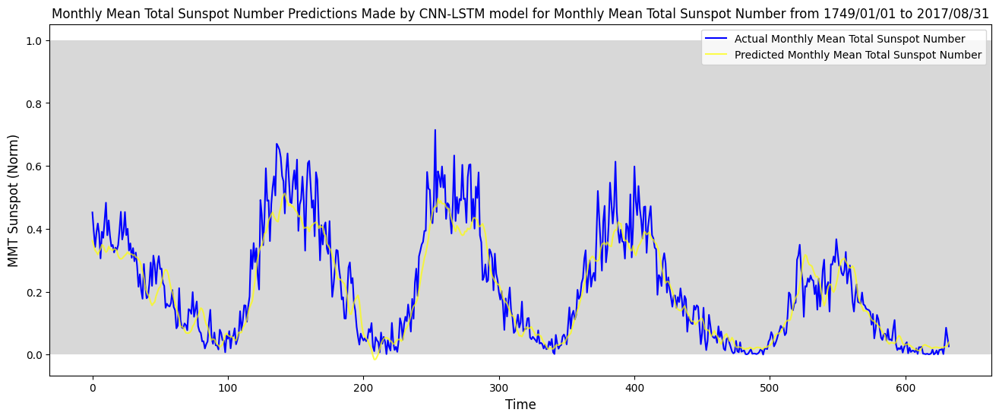

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(lstm_cnn_pred_test, alpha=0.7, color='yellow', \
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions Made by CNN-LSTM model for {1}".
          format(feature, title_name))
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 12)
plt.ylabel(feature_norm, fontsize = 12)
plt.legend()
plt.show()

#### Testing and Training Data Combined.

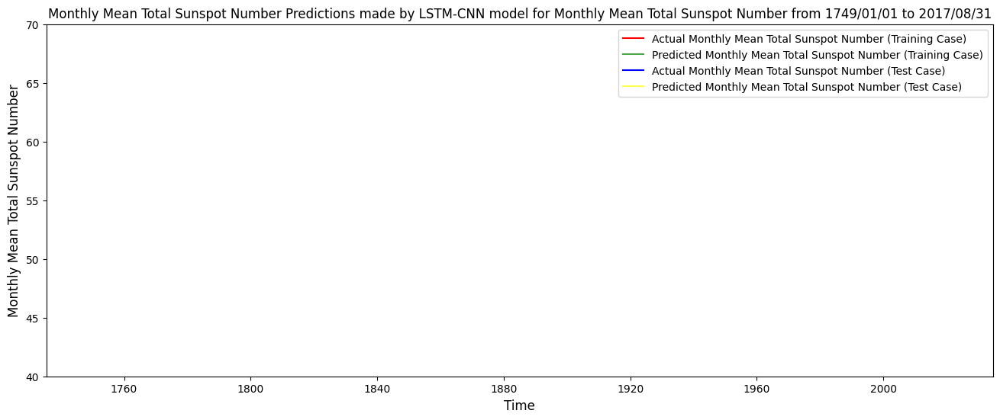

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(results_LSTM_CNN_train['Date'], results_LSTM_CNN_train['Actual'], color='red',
         label=f'Actual {feature} (Training Case)')
plt.plot(results_LSTM_CNN_train['Date'],  results_LSTM_CNN_train['Predicted'], alpha=0.7,
         color='green', label=f'Predicted {feature} (Training Case)')
plt.plot(results_LSTM_CNN_test['Date'], results_LSTM_CNN_test['Actual'], color='blue',
         label=f'Actual {feature} (Test Case)')
plt.plot(results_LSTM_CNN_test['Date'], results_LSTM_CNN_test['Predicted'], alpha=0.7, color='yellow',
         label=f'Predicted {feature} (Test Case)')
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by LSTM-CNN model for {1}".
          format(feature, title_name))
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 12)
plt.ylabel(feature, fontsize = 12)
plt.legend()
plt.show()

### Combine Actual and Predicted Results for Train and Test Cases for LSTM-CNN.

In [ ]:
results_LSTM_CNN = [results_CNN_LSTM_train, results_CNN_LSTM_test]
results_LSTM_CNN = pd.concat(results_LSTM_CNN)
display(results_LSTM_CNN)

,Date,Actual,Predicted
0,1749-01-31,166.046459,168.654648
1,1749-02-28,153.591035,166.807114
2,1749-03-31,152.418759,166.529907
3,1749-04-30,158.338749,169.079117
4,1749-05-31,155.701130,165.546494
...,...,...,...
628,2020-09-30,121.675841,125.023521
629,2020-10-31,125.720191,125.399742
630,2020-11-30,131.464340,126.045837
631,2020-12-31,127.888900,126.175537


### Plotting Residuals for Actual and Predicted Results for LSTM-CNN.

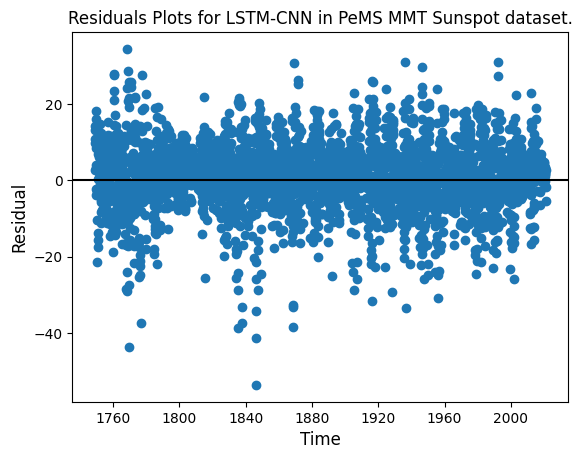

In [ ]:
actual_arr_LSTM_CNN = np.array(results_LSTM_CNN['Actual'])
predicted_arr_LSTM_CNN = np.array(results_LSTM_CNN['Predicted'])
residuals_LSTM_CNN = predicted_arr_LSTM_CNN - actual_arr_LSTM_CNN
plt.scatter(results_LSTM_CNN['Date'], residuals_LSTM_CNN)
plt.axhline(y=0, color = 'black')
plt.title("Residuals Plots for LSTM-CNN in PeMS {} dataset.".format(feature_field))
#plt.locator_params(axis='x', nbins=10)
#plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel("Time", fontsize = 12)
plt.ylabel("Residual", fontsize = 12)
plt.show()

## CNN-GRU model

### Create CNN-GRU Model.

In [ ]:
cnn_gru_model = Sequential()

cnn_gru_model.add(Conv1D(filters=filter, kernel_size=kernel, activation=activation,
                         input_shape=(seq_len, X_train.shape[2])))
cnn_gru_model.add(MaxPooling1D(pool_size=2))

cnn_gru_model.add(Conv1D(filters=filter, kernel_size=kernel, activation=activation,
                         input_shape=(seq_len, X_train.shape[2])))
cnn_gru_model.add(MaxPooling1D(pool_size=2))

#cnn_gru_model.add(Conv1D(filters=60, kernel_size=2, activation='tanh',
#input_shape=(seq_len, X_train.shape[2])))
#cnn_gru_model.add(MaxPooling1D(pool_size=2))

#cnn_gru_model.add(GRU(60,activation="tanh",return_sequences=True,
#input_shape=(X_train.shape[1],1)))
#cnn_gru_model.add(Dropout(0.5))

#cnn_gru_model.add(GRU(64,activation="tanh",return_sequences=True))
#cnn_gru_model.add(Dropout(0.8))

cnn_gru_model.add(GRU(64,activation=activation, return_sequences=False))
cnn_gru_model.add(Dropout(0.8))

cnn_gru_model.add(Dense(1))
cnn_gru_model.compile(optimizer='adam', loss='mse')
cnn_gru_model.summary()

Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_10 (Conv1D)              │ (None, 18, 32)         │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_9 (MaxPooling1D)  │ (None, 9, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_11 (Conv1D)              │ (None, 7, 32)          │         3,104 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_10 (MaxPooling1D) │ (None, 3, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_2 (GRU)                     │ (None, 64)             │        18,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 22,113 (86.38 KB)

 Trainable params: 22,113 (86.38 KB)

 Non-trainable params: 0 (0.00 B)

### Train CNN-GRU Model.

Epoch 1/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 0.0181
Epoch 2/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0118
Epoch 3/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0116
Epoch 4/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0096
Epoch 5/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0098
Epoch 6/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0091
Epoch 7/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0090
Epoch 8/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0082
Epoch 9/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0083
Epoch 10/10
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0081


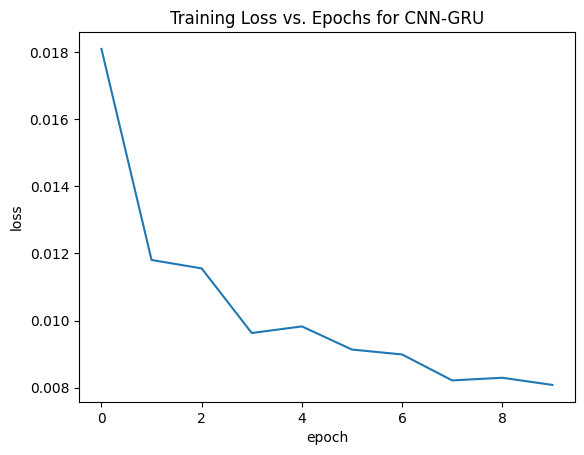

In [ ]:
cnn_gru_model.compile(optimizer="adam",loss=loss)
cnn_gru_epochs = cnn_gru_model.fit(X_train, y_train, epochs=epochs,
                                   batch_size=batch_size)
plot_training_loss(cnn_gru_epochs, "CNN-GRU")

### Evaluate CNN-GRU model using MAE, RMSE, and R^2.

In [ ]:
cnn_gru_pred_train = cnn_gru_model.predict(X_train)
print("RNN Predictions for Testing Set")
cnn_gru_pred_test = cnn_gru_model.predict(X_test)
cnn_gru_mae = mean_absolute_error(y_test,cnn_gru_pred_test)
print("MAE of CNN-GRU model = ",cnn_gru_mae)
cnn_gru_rmse =  mean_squared_error(y_test,cnn_gru_pred_test) ** 0.5
print("RMSE of CNN-GRU model = ",cnn_gru_rmse)
cnn_gru_r2_score = r2_score(y_test, cnn_gru_pred_test)
print("R^2 Score of CNN-GRU model = ",cnn_gru_r2_score)
cnn_gru_mape_score = 100*mean_absolute_percentage_error(y_test,
                                                        cnn_gru_pred_test)
print("MAPE Score of CNN-GRU model = {0} %".format(cnn_gru_mape_score))
cnn_gru_mape_score = 100*mean_absolute_percentage_error(y_test,
                                                         cnn_gru_pred_test)
print("MAPE Score of CNN-LSTM model = {0} %".format(cnn_gru_mape_score))

82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
RNN Predictions for Testing Set
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
MAE of CNN-GRU model =  0.05456804727693132
RMSE of CNN-GRU model =  0.0712633955995978
R^2 Score of CNN-GRU model =  0.8347022304882793
MAPE Score of CNN-GRU model = 32037909496097.47 %
MAPE Score of CNN-LSTM model = 32037909496097.47 %


In [ ]:
perform_statistical_tests(y_test, cnn_gru_pred_test, "CNN-GRU")


--- Statistical Tests for CNN-GRU ---
Paired t-test could not be performed: name 'scipy' is not defined
Wilcoxon Signed-Rank Test could not be performed: name 'scipy' is not defined


### Calculate 95% Confidence Intervals for CNN-GRU MAE and RMSE

In [ ]:
cnn_gru_mae_ci_lower, cnn_gru_mae_ci_upper = calculate_bootstrap_ci(y_test, cnn_gru_pred_test.flatten(), mean_absolute_error)
print(f"CNN-GRU MAE 95% CI: [{cnn_gru_mae_ci_lower:.4f}, {cnn_gru_mae_ci_upper:.4f}]")

cnn_gru_rmse_ci_lower, cnn_gru_rmse_ci_upper = calculate_bootstrap_ci(y_test, cnn_gru_pred_test.flatten(), lambda yt, yp: mean_squared_error(yt, yp)**0.5)
print(f"CNN-GRU RMSE 95% CI: [{cnn_gru_rmse_ci_lower:.4f}, {cnn_gru_rmse_ci_upper:.4f}]")

CNN-GRU MAE 95% CI: [0.0510, 0.0581]
CNN-GRU RMSE 95% CI: [0.0663, 0.0763]


### Reverse transform scaler to convert to real values.

In [ ]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
cnn_gru_pred_inv_train = scaler.inverse_transform(cnn_gru_pred_train)
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
cnn_gru_pred_inv_test = scaler.inverse_transform(cnn_gru_pred_test)

# Get values after inverse transformation.
y_train_inverse = y_train_inverse.flatten()
cnn_gru_pred_inv_train = cnn_gru_pred_inv_train.flatten()
y_test_inverse = y_test_inverse.flatten()
cnn_gru_pred_inv_test = cnn_gru_pred_inv_test.flatten()

### Showing Actual and Predicted y values as Dataframes.

In [ ]:
results_CNN_GRU_train = pd.DataFrame({"Date":first_6169_index_dates,
                                'Actual': y_train_inverse,
                                'Predicted': cnn_gru_pred_inv_train})
results_CNN_GRU_train

,Date,Actual,Predicted
0,1749-01-31,166.046459,164.204575
1,1749-02-28,153.591035,160.770111
2,1749-03-31,152.418759,162.707687
3,1749-04-30,158.338749,163.027130
4,1749-05-31,155.701130,161.291870
...,...,...,...
2607,1966-04-30,173.959317,159.349777
2608,1966-05-31,172.054370,159.466751
2609,1966-06-30,167.951406,160.295334
2610,1966-07-31,159.745480,161.914825


In [ ]:
results_CNN_GRU_test = pd.DataFrame({"Date":last_6169_index_dates,
                                'Actual': y_test_inverse,
                                'Predicted': cnn_gru_pred_inv_test})
results_CNN_GRU_test

,Date,Actual,Predicted
0,1968-05-31,174.252386,164.538193
1,1968-06-30,167.277348,163.140778
2,1968-07-31,161.415972,159.825455
3,1968-08-31,166.867052,161.691437
4,1968-09-30,170.149422,163.353271
...,...,...,...
628,2020-09-30,121.675841,127.135201
629,2020-10-31,125.720191,127.601898
630,2020-11-30,131.464340,128.001572
631,2020-12-31,127.888900,127.901192


### Plotting Predictions for VMT/VHT/Q made by CNN-GRU Model.

#### Only Testing Data

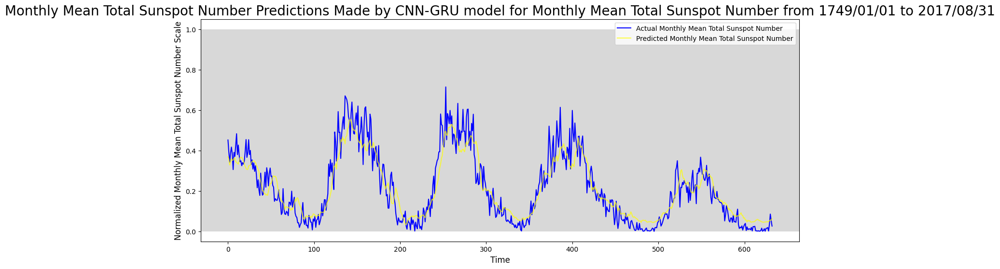

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(cnn_gru_pred_test, alpha=0.7, color='yellow',
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions Made by CNN-GRU model for {1}".
          format(feature, title_name), fontsize = 20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 12)
plt.ylabel('Normalized {0} Scale'.format(feature), fontsize = 12)
plt.legend()
plt.show()

#### Testing and Training Data Combined.

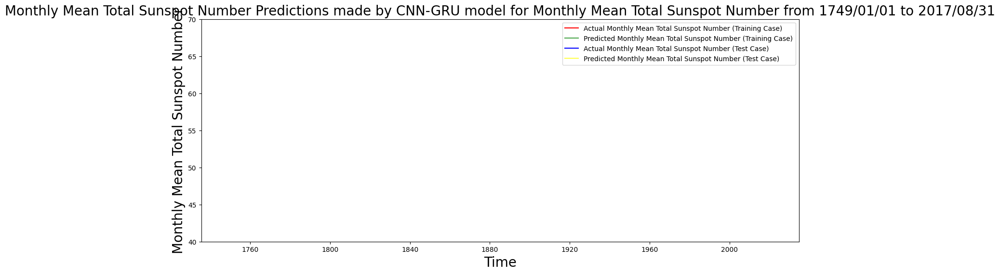

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(results_CNN_GRU_train['Date'], results_CNN_GRU_train['Actual'],
         color='red', label='Actual {0} (Training Case)'.format(feature))
plt.plot(results_CNN_GRU_train['Date'], results_CNN_GRU_train['Predicted'],
         alpha=0.7, color='green',
         label='Predicted {0} (Training Case)'.format(feature))
plt.plot(results_CNN_GRU_test['Date'], results_CNN_GRU_test['Actual'],
         color='blue', label='Actual {0} (Test Case)'.format(feature))
plt.plot(results_CNN_GRU_test['Date'], results_CNN_GRU_test['Predicted'],
         alpha=0.7, color='yellow',
         label='Predicted {0} (Test Case)'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by CNN-GRU model for {1}".
          format(feature, title_name), fontsize = 20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 20)
plt.ylabel(feature, fontsize = 20)
plt.legend()
plt.show()

### Combine Actual and Predicted Results for Train and Test Cases for CNN-GRU.

In [ ]:
results_CNN_GRU = [results_CNN_GRU_train, results_CNN_GRU_test]
results_CNN_GRU = pd.concat(results_CNN_GRU)
display(results_CNN_GRU)

,Date,Actual,Predicted
0,1749-01-31,166.046459,164.204575
1,1749-02-28,153.591035,160.770111
2,1749-03-31,152.418759,162.707687
3,1749-04-30,158.338749,163.027130
4,1749-05-31,155.701130,161.291870
...,...,...,...
628,2020-09-30,121.675841,127.135201
629,2020-10-31,125.720191,127.601898
630,2020-11-30,131.464340,128.001572
631,2020-12-31,127.888900,127.901192


### Plotting Residuals for Actual and Predicted Results for CNN-GRU.

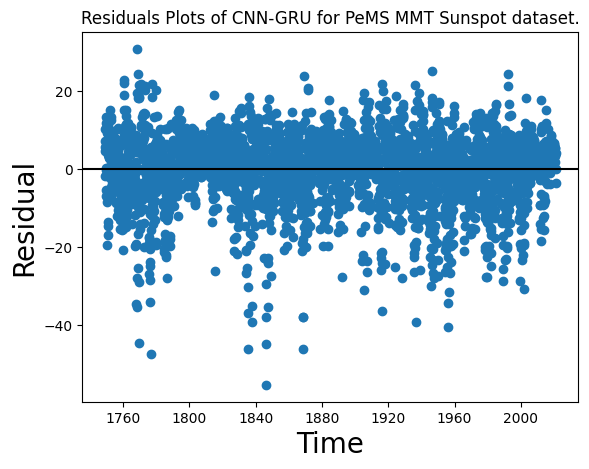

In [ ]:
actual_arr_CNN_GRU = np.array(results_CNN_GRU['Actual'])
predicted_arr_CNN_GRU = np.array(results_CNN_GRU['Predicted'])
residuals_CNN_GRU = predicted_arr_CNN_GRU - actual_arr_CNN_GRU
plt.scatter(results_CNN_GRU['Date'], residuals_CNN_GRU)
plt.title("Residuals Plots of CNN-GRU for PeMS {} dataset.".format(feature_field))
#plt.locator_params(axis='x', nbins=10)
#plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel("Time", fontsize = 20)
plt.ylabel("Residual", fontsize = 20)
plt.axhline(y=0, color = 'black')
plt.show()

From the residual plots for the CNN-GRU model, it can be concluded that the CNN-GRU model is a good fit.

### Energy Consumption

In [ ]:
start_time = time.time()
# Run inference or training with your rnn_model here
end_time = time.time()

execution_time = end_time - start_time
print("Model execution time:", execution_time, "seconds")
measure_ann_energy(cnn_gru_model, X_test)

Model execution time: 5.125999450683594e-05 seconds
Measuring inference time and estimating energy on CPU (for ANN)...
  CPU Inference Time: 0.2039 seconds
  Estimated CPU Energy: 16.3118 Joules (16311836.2427 µJ)

No GPU available. GPU measurements skipped.


{'model_name': 'sequential_12',
 'cpu_inference_time_s': 0.20389795303344727,
 'estimated_cpu_energy_J': 16.31183624267578,
 'estimated_cpu_energy_uJ': 16311836.242675781,
 'gpu_inference_time_s': None,
 'estimated_gpu_energy_J': None,
 'estimated_gpu_energy_uJ': None,
 'snn_spike_energy_uJ': None}

# Compare Predictions

* For both models, we see that the predicted values are close to the actual values, which means that the models perform well in predicting the sequence.

## Training

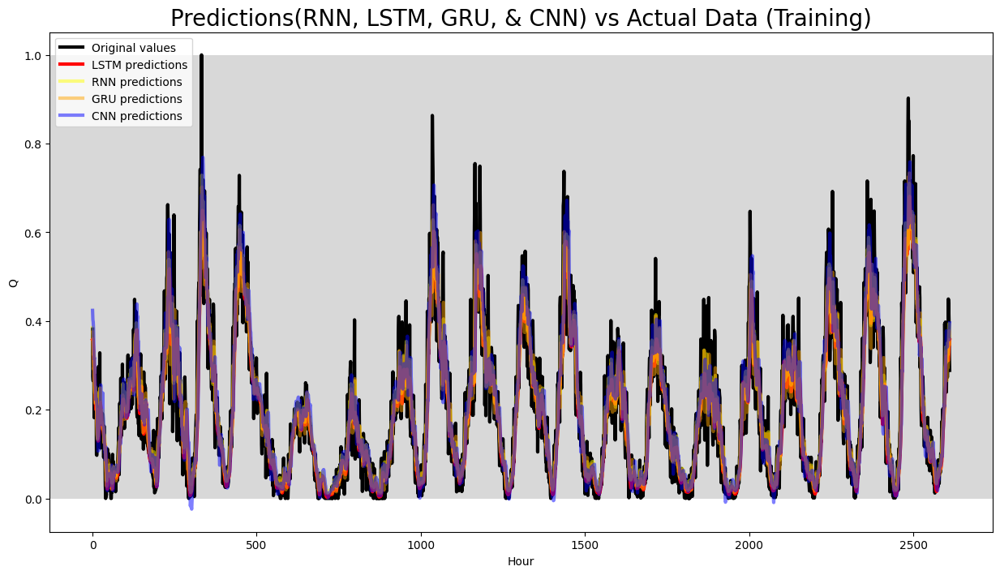

In [ ]:
plt.figure(figsize=(15,8))

plt.plot(y_train, c="black", linewidth=3, label="Original values")
plt.plot(lstm_pred_train, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions_train, alpha=0.5, c="yellow",
         linewidth=3, label="RNN predictions")
plt.plot(gru_pred_train, alpha=0.5, c="orange", linewidth=3,
         label="GRU predictions")
plt.plot(cnn_pred_train, alpha=0.5, c="blue", linewidth=3,
         label="CNN predictions")
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.legend()
plt.xlabel('Hour')
plt.ylabel('Q')
plt.title("Predictions(RNN, LSTM, GRU, & CNN) vs Actual Data (Training)",
          fontsize=20)
plt.show()

## Testing

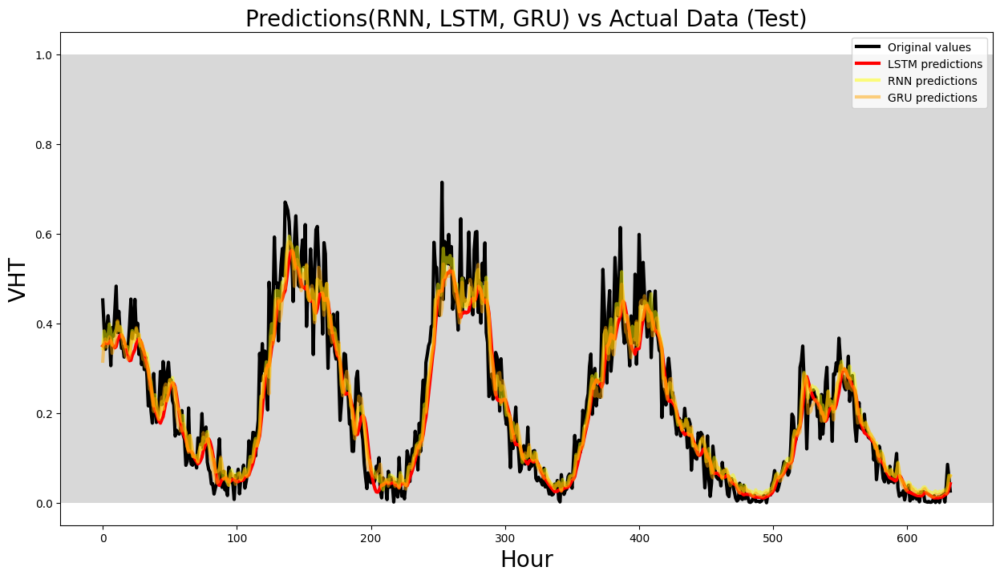

In [ ]:
plt.figure(figsize=(15,8))

plt.plot(y_test, c="black", linewidth=3, label="Original values")
plt.plot(lstm_pred_test, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions_test, alpha=0.5, c="yellow",
         linewidth=3, label="RNN predictions")
plt.plot(gru_pred_test, alpha=0.5, c="orange", linewidth=3,
         label="GRU predictions")
#plt.plot(cnn_pred_test, alpha=0.5, c="blue", linewidth=3,
#         label="CNN predictions")
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.legend()
plt.xlabel('Hour', fontsize = 20)
#plt.ylabel('Q', fontsize = 20)
plt.ylabel('VHT', fontsize = 20)
#plt.title("Predictions(RNN, LSTM, GRU, & CNN) vs Actual Data (Test)",
#          fontsize=20)
plt.title("Predictions(RNN, LSTM, GRU) vs Actual Data (Test)",
          fontsize=20)
plt.show()

## Training (Hybrid Models)

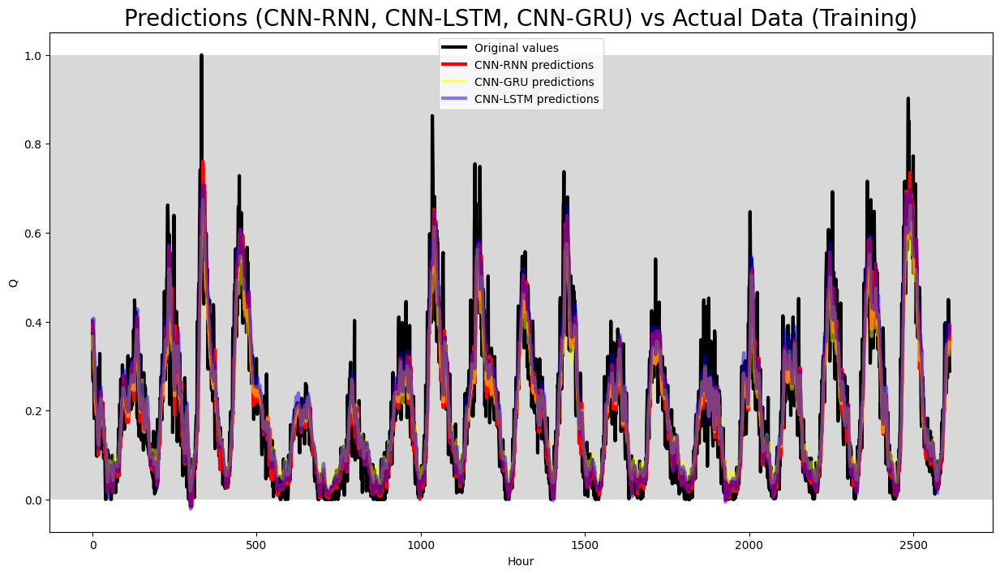

In [ ]:
plt.figure(figsize=(15,8))

plt.plot(y_train, c="black", linewidth=3, label="Original values")
plt.plot(cnn_rnn_pred_train, c="red", linewidth=3, label="CNN-RNN predictions")
plt.plot(cnn_gru_pred_train, alpha=0.5, c="yellow", linewidth=3,
         label="CNN-GRU predictions")
plt.plot(cnn_lstm_pred_train, alpha=0.5, c="blue", linewidth=3,
         label="CNN-LSTM predictions")
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.legend()
plt.xlabel('Hour')
plt.ylabel('Q')
plt.title("Predictions (CNN-RNN, CNN-LSTM, CNN-GRU) vs Actual Data (Training)",
          fontsize=20)
plt.show()

## Testing (Hybrid Models)

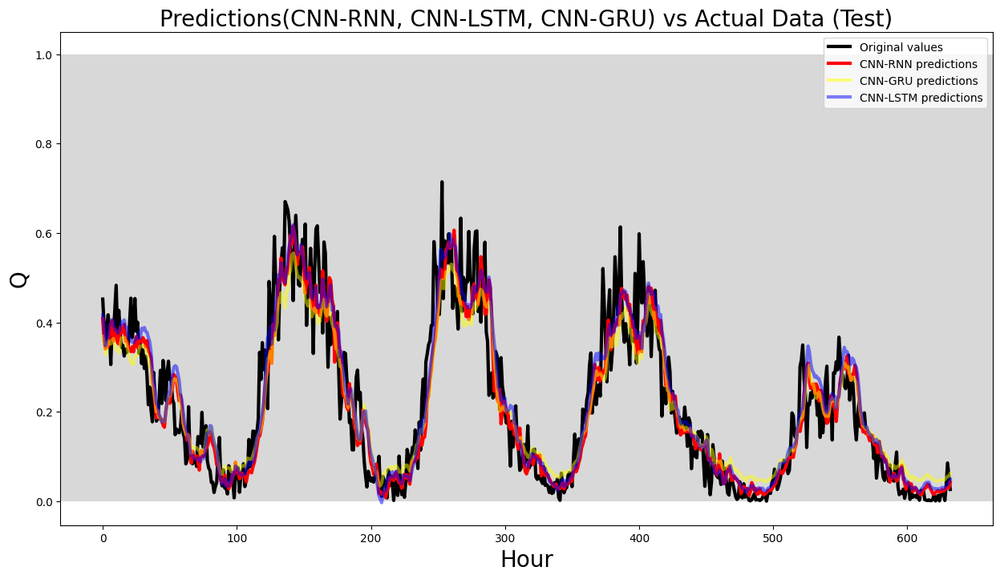

In [ ]:
plt.figure(figsize=(15,8))

plt.plot(y_test, c="black", linewidth=3, label="Original values")
plt.plot(cnn_rnn_pred_test, c="red", linewidth=3, label="CNN-RNN predictions")
plt.plot(cnn_gru_pred_test, alpha=0.5, c="yellow", linewidth=3, label="CNN-GRU predictions")
plt.plot(cnn_lstm_pred_test, alpha=0.5, c="blue", linewidth=3, label="CNN-LSTM predictions")
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.legend()
plt.xlabel('Hour',fontsize=20)
plt.ylabel('Q', fontsize=20)
plt.title("Predictions(CNN-RNN, CNN-LSTM, CNN-GRU) vs Actual Data (Test)",
          fontsize=20)
plt.show()

## Energy Efficiency Comparison

In [ ]:
def plot_energy_results(all_results):
    print(f"all_results: {all_results}")
    cpu_times = [res['cpu_inference_time_s'] for res in all_results]
    estimated_cpu_energy_uJ = [res['estimated_cpu_energy_uJ']
                               for res in all_results]
    estimated_gpu_energy_uJ = [res['estimated_gpu_energy_uJ']
                               if res['estimated_gpu_energy_uJ'] is not None
                               else 0 for res in all_results]
    snn_spike_energy_uJ = [res['snn_spike_energy_uJ']
                           if res['snn_spike_energy_uJ'] is not None
                           else 0 for res in all_results]
    model_names = [res['model_name'] for res in all_results]

    x = np.arange(len(model_names))
    width = 0.2
    fig, ax1 = plt.subplots(figsize=(13, 6))

    # Plot estimated CPU Energy
    ax1.bar(x - width, estimated_cpu_energy_uJ, width,
            label='Estimated CPU Energy (µJ)', color='skyblue')
    # Plot estimated GPU Energy
    ax1.bar(x, estimated_gpu_energy_uJ, width,
            label='Estimated GPU Energy (µJ) (if available)', color='lightcoral')
    # Plot SNN Spike Energy
    ax1.bar(x + width, snn_spike_energy_uJ, width,
            label='Estimated SNN Spike Energy (µJ)', color='lightgreen')
    ax1.set_ylabel('Estimated Energy (µJ)', fontsize=14, fontweight='bold')
    ax1.set_xlabel('Model', fontsize=14, fontweight='bold')
    ax1.set_title('Estimated Energy Consumption per Model', fontsize=20,
                  fontweight = 'bold')
    ax1.set_xticks(x)
    ax1.set_xticklabels(model_names, rotation=45, ha="right", fontsize=12)
    ax1.tick_params(axis='y', labelsize=12)
    ax1.legend(loc='upper left', fontsize=10)
    ax1.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

Measuring inference time and estimating energy on CPU (for ANN)...
  CPU Inference Time: 0.2192 seconds
  Estimated CPU Energy: 17.5359 Joules (17535934.4482 µJ)

No GPU available. GPU measurements skipped.
Measuring inference time and estimating energy on CPU (for ANN)...
  CPU Inference Time: 0.2353 seconds
  Estimated CPU Energy: 18.8256 Joules (18825569.1528 µJ)

No GPU available. GPU measurements skipped.
Measuring inference time and estimating energy on CPU (for ANN)...
  CPU Inference Time: 0.2278 seconds
  Estimated CPU Energy: 18.2215 Joules (18221530.9143 µJ)

No GPU available. GPU measurements skipped.
Measuring inference time and estimating energy on CPU (for ANN)...
  CPU Inference Time: 0.1644 seconds
  Estimated CPU Energy: 13.1522 Joules (13152179.7180 µJ)

No GPU available. GPU measurements skipped.
Measuring inference time and estimating energy on CPU (for ANN)...
  CPU Inference Time: 0.2228 seconds
  Estimated CPU Energy: 17.8237 Joules (17823677.0630 µJ)

No GPU av

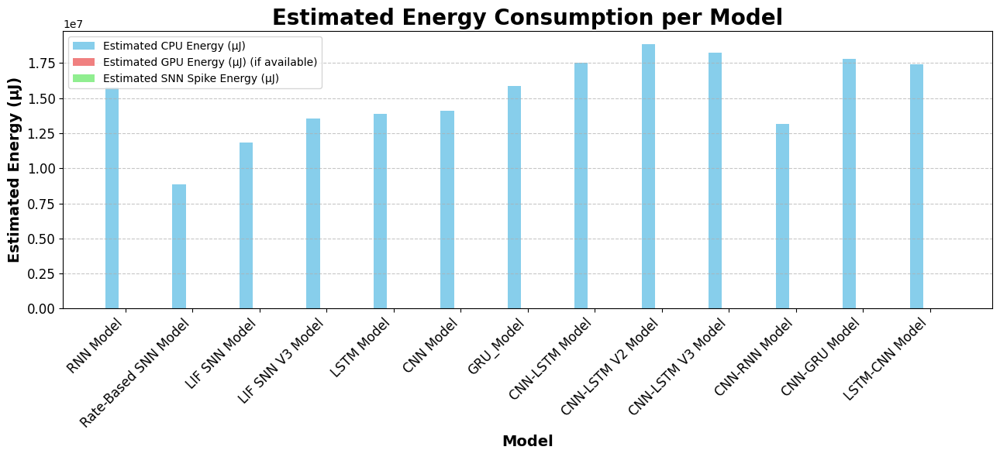

In [ ]:
all_models_energy_results = [
    rnn_energy_results,
    snn_energy_results,
    spiking_LIF_energy_results,
    spiking_LIFv3_energy_results,
    lstm_energy_results,
    cnn_model_energy_results,
    gru_energy_results
]

# Re-run energy calculation and store results for hybrid models
cnn_lstm_energy_results = measure_ann_energy(cnn_lstm_model, X_test, model_name_str='CNN-LSTM Model')
all_models_energy_results.append(cnn_lstm_energy_results)

cnn_lstm_v2_energy_results = measure_ann_energy(cnn_lstm_v2, X_test, model_name_str='CNN-LSTM V2 Model')
all_models_energy_results.append(cnn_lstm_v2_energy_results)

cnn_lstm_v3_energy_results = measure_ann_energy(cnn_lstm_v3, X_test_v3, model_name_str='CNN-LSTM V3 Model')
all_models_energy_results.append(cnn_lstm_v3_energy_results)

cnn_rnn_energy_results = measure_ann_energy(cnn_rnn_model, X_test, model_name_str='CNN-RNN Model')
all_models_energy_results.append(cnn_rnn_energy_results)

cnn_gru_energy_results = measure_ann_energy(cnn_gru_model, X_test, model_name_str='CNN-GRU Model')
all_models_energy_results.append(cnn_gru_energy_results)

lstm_cnn_energy_results = measure_ann_energy(lstm_cnn_model, X_test, model_name_str='LSTM-CNN Model')
all_models_energy_results.append(lstm_cnn_energy_results)

plot_energy_results(all_models_energy_results)

## Applying Diebold-Mariano Test to Model Predictions

In [ ]:
print("\n--- Diebold-Mariano Test Results ---")

models = {
    "RNN": rnn_predictions_test.flatten(),
    "LSTM": lstm_pred_test.flatten(),
    "GRU": gru_pred_test.flatten(),
    "CNN": cnn_pred_test.flatten(),
    "Rate-Based SNN": snn_pred_test.flatten(),
    "LIF SNN": snn_LIF_pred_test.flatten(),
    "LIF SNN V3": spiking_LIFv3_model_pred_test.flatten(),
    "CNN-RNN": cnn_rnn_pred_test.flatten(),
    "CNN-LSTM": cnn_lstm_pred_test.flatten(),
    "CNN-LSTM V2": cnn_lstm_pred_test_v2.flatten(),
    "CNN-LSTM V3": cnn_lstm_pred_test_v3.flatten(),
    "LSTM-CNN": lstm_cnn_pred_test.flatten(),
    "CNN-GRU": cnn_gru_pred_test.flatten()
}

model_names = list(models.keys())

# Compare each model against every other model
for i in range(len(model_names)):
    for j in range(i + 1, len(model_names)):
        name1 = model_names[i]
        name2 = model_names[j]
        preds1 = models[name1]
        preds2 = models[name2]

        if len(y_test) != len(preds1) or len(y_test) != len(preds2):
            print(f"Skipping DM test for {name1} vs {name2} due to length mismatch.\n")
            continue

        try:
            dm_stat_mae, p_value_mae = diebold_mariano_mae(y_test, preds1, preds2)
            dm_stat_mse, p_value_mse = diebold_mariano_mse(y_test, preds1, preds2)

            print(f"Comparing {name1} vs {name2}:")
            print(f"DM Statistic (MAE loss): {dm_stat_mae:.4f}, p-value: {p_value_mae:.4f}")
            if p_value_mae < 0.05:
                print(f"(Significant difference: {name1} and {name2} have different predictive accuracy based on MAE loss)")
            else:
                print(f"(No significant difference: {name1} and {name2} have similar predictive accuracy based on MAE loss)")

            print(f"DM Statistic (MSE loss): {dm_stat_mse:.4f}, p-value: {p_value_mse:.4f}")
            if p_value_mse < 0.05:
                print(f"(Significant difference: {name1} and {name2} have different predictive accuracy based on MSE loss)")
            else:
                print(f"(No significant difference: {name1} and {name2} have similar predictive accuracy based on MSE loss)\n")

        except Exception as e:
            print(f"Error performing DM test for {name1} vs {name2}: {e}\n")



--- Diebold-Mariano Test Results ---
Error performing DM test for RNN vs LSTM: name 'scipy' is not defined

Error performing DM test for RNN vs GRU: name 'scipy' is not defined

Error performing DM test for RNN vs CNN: name 'scipy' is not defined

Error performing DM test for RNN vs Rate-Based SNN: name 'scipy' is not defined

Error performing DM test for RNN vs LIF SNN: name 'scipy' is not defined

Error performing DM test for RNN vs LIF SNN V3: name 'scipy' is not defined

Error performing DM test for RNN vs CNN-RNN: name 'scipy' is not defined

Error performing DM test for RNN vs CNN-LSTM: name 'scipy' is not defined

Error performing DM test for RNN vs CNN-LSTM V2: name 'scipy' is not defined

Error performing DM test for RNN vs CNN-LSTM V3: name 'scipy' is not defined

Error performing DM test for RNN vs LSTM-CNN: name 'scipy' is not defined

Error performing DM test for RNN vs CNN-GRU: name 'scipy' is not defined

Error performing DM test for LSTM vs GRU: name 'scipy' is not def

# Forecasting Future Data for all models

## Essential Functions.

In [ ]:
# this section for unknown future.
future=20
#future=seq_len
forecast_RNN = []
forecast_LSTM = []
forecast_GRU = []
forecast_CNN = []
forecast_CNN_RNN = []
forecast_CNN_LSTM = []
forecast_CNN_GRU = []
Xin = X_test[:,:,:]
Xin

array([[[0.17855349],
        [0.20391763],
        [0.20341537],
        ...,
        [0.39804119],
        [0.32772476],
        [0.2887996 ]],

       [[0.20391763],
        [0.20341537],
        [0.25062783],
        ...,
        [0.32772476],
        [0.2887996 ],
        [0.45203415]],

       [[0.20341537],
        [0.25062783],
        [0.39427423],
        ...,
        [0.2887996 ],
        [0.45203415],
        [0.39226519]],

       ...,

       [[0.02360623],
        [0.02285284],
        [0.02486188],
        ...,
        [0.01883476],
        [0.00150678],
        [0.03616273]],

       [[0.02285284],
        [0.02486188],
        [0.00301356],
        ...,
        [0.00150678],
        [0.03616273],
        [0.08538423]],

       [[0.02486188],
        [0.00301356],
        [0.00226017],
        ...,
        [0.03616273],
        [0.08538423],
        [0.05474636]]])

In [ ]:
def insert_end(Xin, new_input, timestep):
    for i in range(timestep-1):
        Xin[:,i,:] = Xin[:,i+1,:]
    Xin[:,timestep-1,:] = new_input
    return Xin

def forecast_data(Xin, model_type, forecast, future_num):
    time=[]
    data_pts = 24*future_num
    for j in range(data_pts):
      out = model_type.predict(Xin, batch_size=1000)
      forecast.append(out[j, 0])
      Xin = insert_end(Xin, out[j, 0], future_num)
      time_current = pd.to_datetime(df_norm.index[-1])+timedelta(hours=j)
      if (j % 100 == 0):
        print("j = {0}".format(j))
        print("forecast: {0}".format(forecast))
        print("time_current: ",  time_current)
      time.append(time_current)


    forcasted_output=np.asanyarray(forecast)
    forcasted_output=forcasted_output.reshape(-1,1)
    forcasted_output = scaler.inverse_transform(forcasted_output)
    forcasted_output = pd.DataFrame(forcasted_output)
    date = pd.DataFrame(time)
    forecast_result = pd.concat([date, forcasted_output],axis=1)
    forecast_result.columns = "Date","Forecasted"

    return forecast_result

In [ ]:
# Plotting Predictions for VMT/VHT/Q for each model.
def plot_forecast(forecast_set, model_name, mode, min=30, max=70):
    plt.figure(figsize=(16,6))
    plt.plot(forecast_set['Date'], forecast_set['Forecasted'], alpha=0.7,
             color='teal', label='Forecasted {0}'.format(feature))
    plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
    plt.title('{0} Forecast for {1} using {2}'.
              format(feature_field, mode, model_name), fontsize = 15)
    plt.locator_params(axis='x', nbins=10)
    plt.locator_params(axis='y', nbins=10)
    plt.ylim([min, max])
    plt.xlabel('Time', fontsize = 15)
    #plt.ylabel(feature_field, fontsize = 15)
    plt.ylabel('Normalized {0} Scale'.format(feature_field), fontsize = 15)
    plt.rc('xtick', labelsize=15)
    plt.rc('ytick', labelsize=15)
    plt.legend()
    plt.show()

In [ ]:
# Plotting Predictions for VMT/VHT/Q for Training, Testing, and Future Data.
def plot_with_forecast(train_set, test_set, forecast_set, model_name, mode,
                       min=30, max=70):
    plt.figure(figsize=(16,6))
    plt.plot(train_set['Date'], train_set['Actual'], color='red',
             label='Actual {0} (Training Case)'.format(feature))
    plt.plot(train_set['Date'], train_set['Predicted'], alpha=0.7,
             color='green',
             label='Predicted {0} (Training Case)'.format(feature))
    plt.plot(test_set['Date'], test_set['Actual'], color='blue',
            label='Actual {0} (Test Case)'.format(feature))
    plt.plot(test_set['Date'], test_set['Predicted'], alpha=0.7, color='yellow',
             label='Predicted {0} (Test Case)'.format(feature))
    plt.plot(forecast_set['Date'], forecast_set['Forecasted'], alpha=0.7,
             color='teal', label='Forecasted {0}'.format(feature))
    plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
    plt.title("{0} Predictions and Forecasts made by {1} model for {2}".
              format(feature_field, model_name, title_name), fontsize=15)
    plt.locator_params(axis='x', nbins=10)
    plt.locator_params(axis='y', nbins=10)
    plt.rc('xtick', labelsize=10)
    plt.rc('ytick', labelsize=10)
    plt.ylim([min, max])
    plt.xlabel('Time', fontsize = 15)
    plt.ylabel('Normalized {0} Scale'.format(feature_field), fontsize = 15)
    plt.legend()
    plt.show()

## Forecasting Future Data for RNN.

In [ ]:
forecast_result_rnn = forecast_data(Xin, rnn_model, forecast_RNN, future)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
j = 0
forecast: [np.float32(0.34418744)]
time_current:  2021-01-31 00:00:00
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━

In [ ]:
forecast_result_rnn

,Date,Forecasted
0,2021-01-31 00:00:00,161.666672
1,2021-01-31 01:00:00,162.931152
2,2021-01-31 02:00:00,163.698471
3,2021-01-31 03:00:00,163.809387
4,2021-01-31 04:00:00,163.150528
...,...,...
475,2021-02-19 19:00:00,151.892868
476,2021-02-19 20:00:00,151.892868
477,2021-02-19 21:00:00,151.892868
478,2021-02-19 22:00:00,151.892868


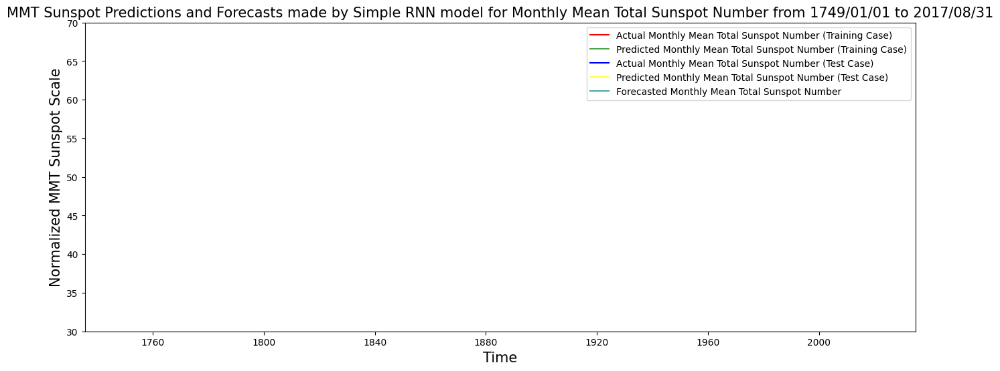

In [ ]:
# Plot Forecast combined with Training and Testing Data.
plot_with_forecast(results_RNN_train, results_RNN_test, forecast_result_rnn,
                   'Simple RNN', title_name)

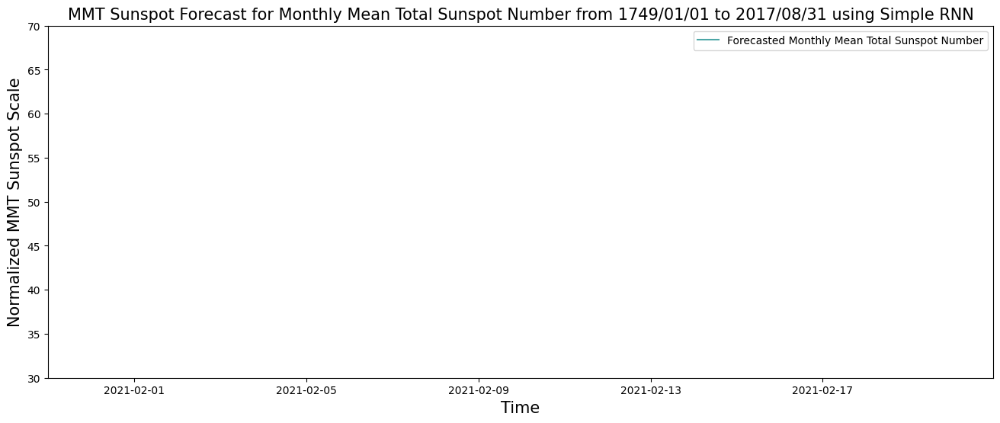

In [ ]:
# Only Forecast Data for closer look.
plot_forecast(forecast_result_rnn, 'Simple RNN', title_name)

## Forecasting Future Data for LSTM.

In [ ]:
forecast_result_lstm = forecast_data(Xin, lstm_model, forecast_LSTM, future)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
j = 0
forecast: [np.float32(0.24460459)]
time_current:  2021-01-31 00:00:00
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1

In [ ]:
forecast_result_lstm

,Date,Forecasted
0,2021-01-31 00:00:00,150.045364
1,2021-01-31 01:00:00,149.848526
2,2021-01-31 02:00:00,149.534286
3,2021-01-31 03:00:00,149.145355
4,2021-01-31 04:00:00,148.707932
...,...,...
475,2021-02-19 19:00:00,134.783157
476,2021-02-19 20:00:00,134.783157
477,2021-02-19 21:00:00,134.783157
478,2021-02-19 22:00:00,134.783157


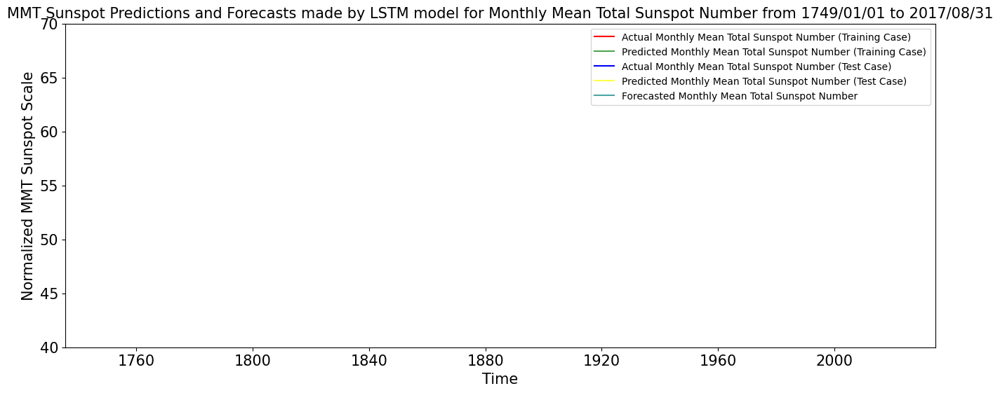

In [ ]:
# Plot Forecast combined with Training and Testing Data.
plot_with_forecast(results_LSTM_train, results_LSTM_test, forecast_result_lstm,
                   'LSTM', title_name, min=40, max=70)

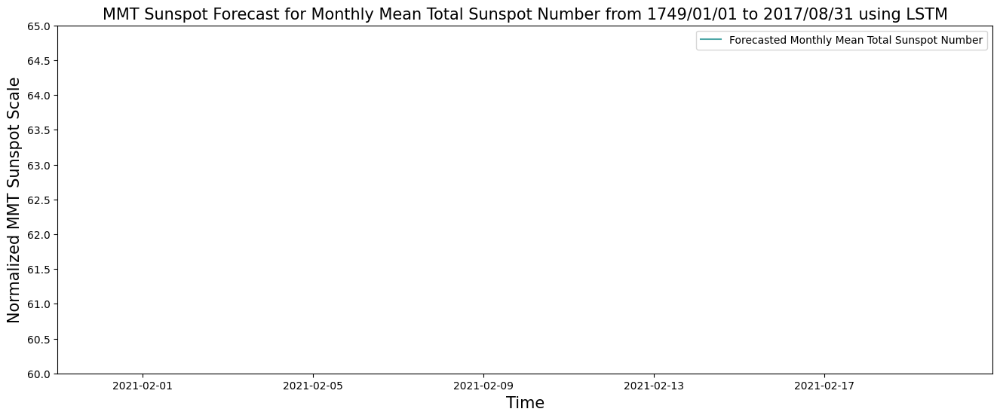

In [ ]:
# Only Forecast Data for closer look.
plot_forecast(forecast_result_lstm, 'LSTM', title_name, min=60, max=65)

## Forecasting Future Data for GRU.

In [ ]:
forecast_result_gru = forecast_data(Xin, gru_model, forecast_GRU, future)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
j = 0
forecast: [np.float32(0.116046436)]
time_current:  2021-01-31 00:00:00
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/

In [ ]:
forecast_result_gru

,Date,Forecasted
0,2021-01-31 00:00:00,135.042618
1,2021-01-31 01:00:00,135.141388
2,2021-01-31 02:00:00,135.242722
3,2021-01-31 03:00:00,135.340927
4,2021-01-31 04:00:00,135.435852
...,...,...
475,2021-02-19 19:00:00,137.818192
476,2021-02-19 20:00:00,137.818192
477,2021-02-19 21:00:00,137.818192
478,2021-02-19 22:00:00,137.818192


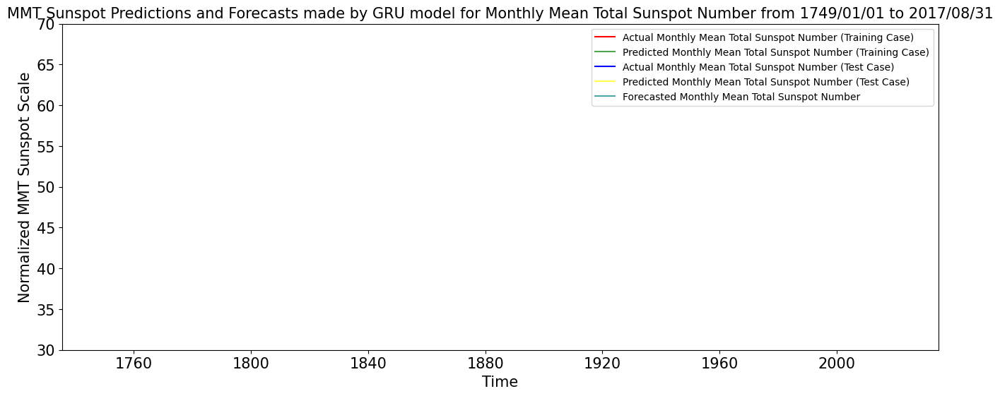

In [ ]:
# Plot Forecast combined with Training and Testing Data.
plot_with_forecast(results_GRU_train, results_GRU_test, forecast_result_gru,
                   'GRU', title_name)

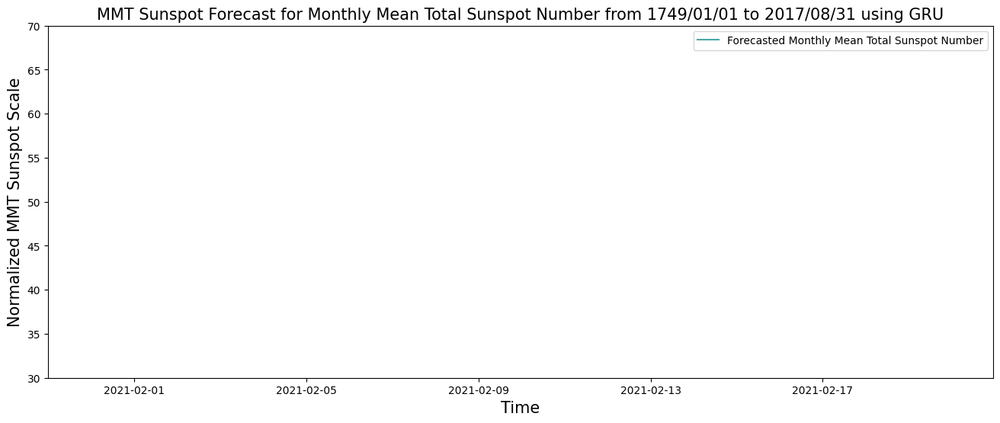

In [ ]:
# Only Forecast Data for closer look.
plot_forecast(forecast_result_gru, 'GRU', title_name)

## Forecasting Future Data for CNN.

In [ ]:
forecast_result_cnn = forecast_data(Xin, cnn_model, forecast_CNN, future)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
j = 0
forecast: [np.float32(0.15433705)]
time_current:  2021-01-31 00:00:00
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━

In [ ]:
forecast_result_cnn

,Date,Forecasted
0,2021-01-31 00:00:00,139.511139
1,2021-01-31 01:00:00,139.511139
2,2021-01-31 02:00:00,139.511139
3,2021-01-31 03:00:00,140.010956
4,2021-01-31 04:00:00,140.397461
...,...,...
475,2021-02-19 19:00:00,163.740784
476,2021-02-19 20:00:00,163.740784
477,2021-02-19 21:00:00,163.740784
478,2021-02-19 22:00:00,163.740784


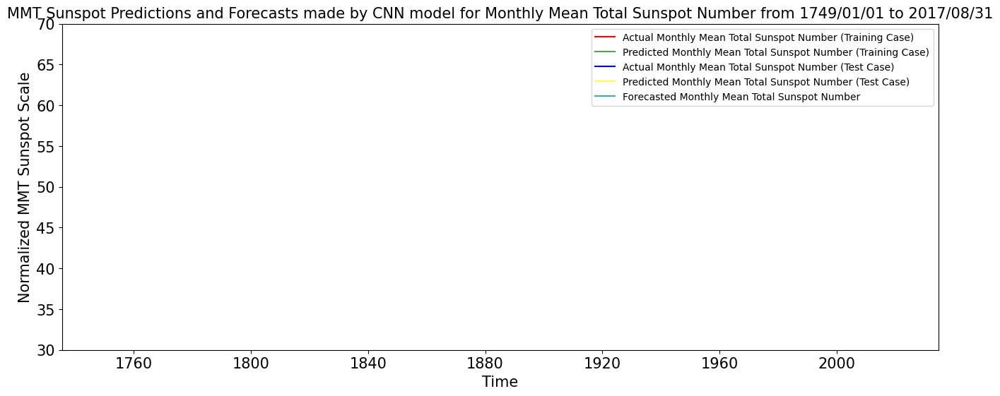

In [ ]:
# Plot Forecast combined with Training and Testing Data.
plot_with_forecast(results_CNN_train, results_CNN_test, forecast_result_cnn,
                   'CNN', title_name)

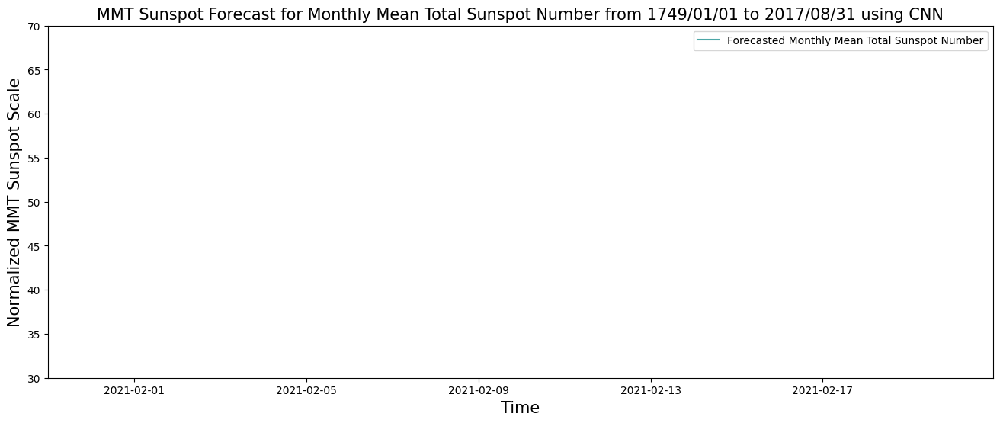

In [ ]:
# Only Forecast Data for closer look.
plot_forecast(forecast_result_cnn, 'CNN', title_name)

## Forecasting Future Data for CNN-RNN.

In [ ]:
forecast_result_cnn_rnn = forecast_data(Xin, cnn_rnn_model, forecast_CNN_RNN, future)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
j = 0
forecast: [np.float32(0.34805772)]
time_current:  2021-01-31 00:00:00
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━

In [ ]:
forecast_result_cnn_rnn

,Date,Forecasted
0,2021-01-31 00:00:00,162.118332
1,2021-01-31 01:00:00,162.118332
2,2021-01-31 02:00:00,162.118332
3,2021-01-31 03:00:00,161.867508
4,2021-01-31 04:00:00,161.422668
...,...,...
475,2021-02-19 19:00:00,148.035507
476,2021-02-19 20:00:00,148.035507
477,2021-02-19 21:00:00,148.035492
478,2021-02-19 22:00:00,148.035507


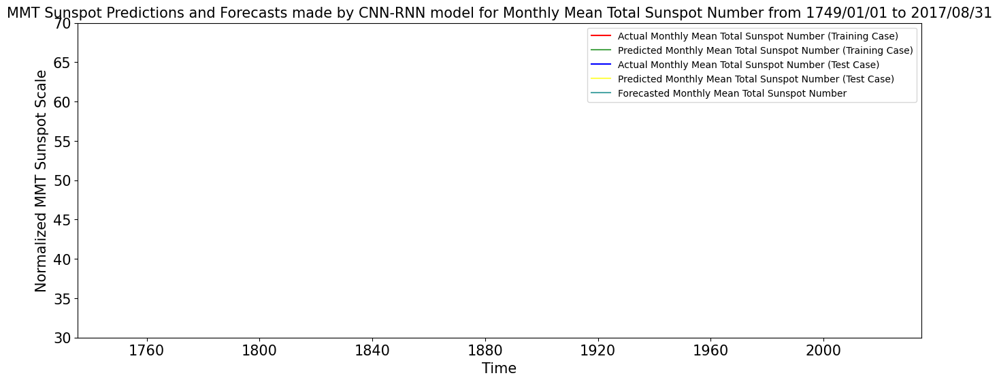

In [ ]:
plot_with_forecast(results_CNN_RNN_train, results_CNN_RNN_test,
                   forecast_result_cnn_rnn, 'CNN-RNN', title_name)

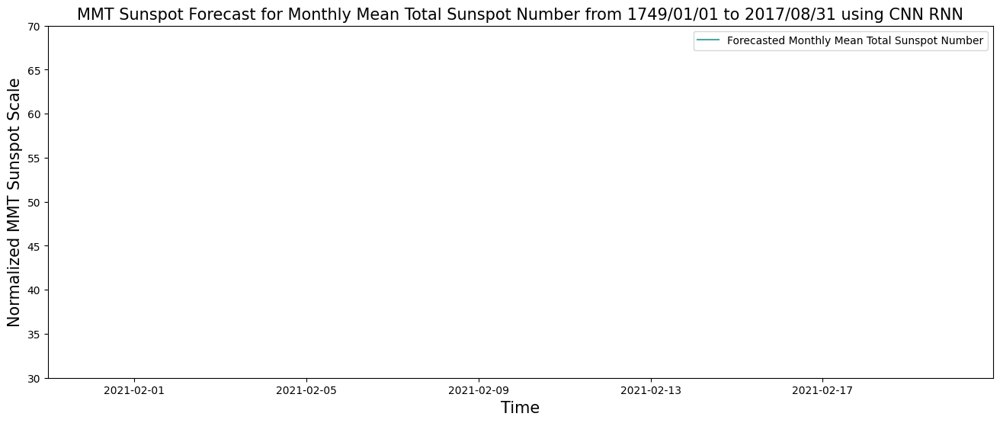

In [ ]:
plot_forecast(forecast_result_cnn_rnn, 'CNN RNN', title_name)

## Forecasting Future Data for CNN-LSTM.

In [ ]:
forecast_result_cnn_lstm = forecast_data(Xin, cnn_lstm_model, forecast_CNN_LSTM, future)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
j = 0
forecast: [np.float32(0.24527976)]
time_current:  2021-01-31 00:00:00
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━

In [ ]:
forecast_result_cnn_lstm

,Date,Forecasted
0,2021-01-31 00:00:00,150.124146
1,2021-01-31 01:00:00,150.124146
2,2021-01-31 02:00:00,150.124146
3,2021-01-31 03:00:00,150.341614
4,2021-01-31 04:00:00,150.573853
...,...,...
475,2021-02-19 19:00:00,170.160522
476,2021-02-19 20:00:00,170.160522
477,2021-02-19 21:00:00,170.160522
478,2021-02-19 22:00:00,170.160522


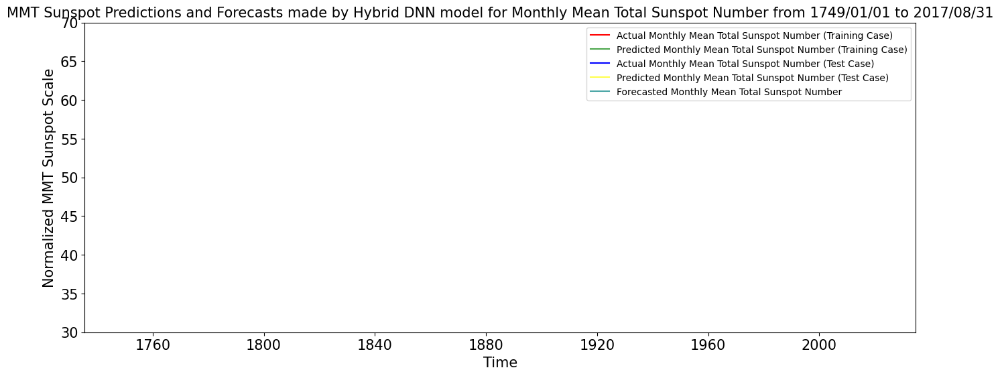

In [ ]:
plot_with_forecast(results_CNN_LSTM_train, results_CNN_LSTM_test,
                   forecast_result_cnn_lstm, 'Hybrid DNN', title_name, min=30,
                   max=70)

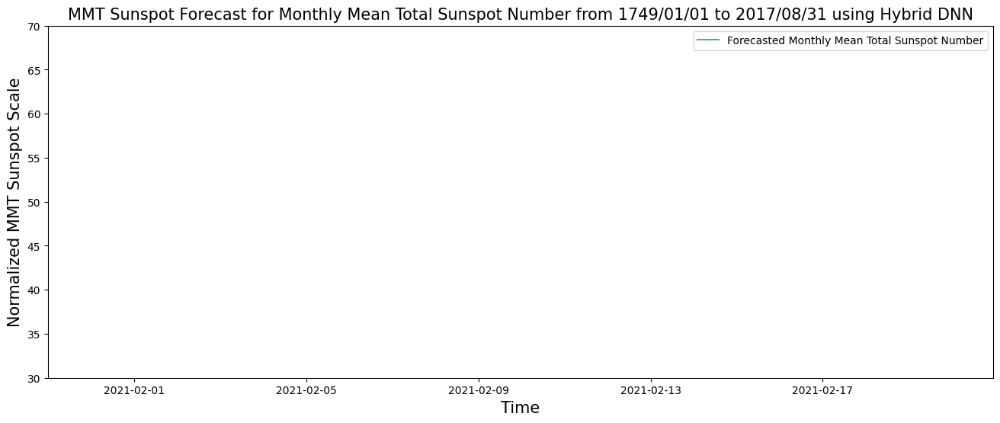

In [ ]:
plot_forecast(forecast_result_cnn_lstm, 'Hybrid DNN', title_name)

## Forecasting Future Data for CNN-GRU.

In [ ]:
forecast_result_cnn_gru = forecast_data(Xin, cnn_gru_model, forecast_CNN_GRU,
                                        future)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
j = 0
forecast: [np.float32(0.3640899)]
time_current:  2021-01-31 00:00:00
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━

In [ ]:
forecast_result_cnn_gru

,Date,Forecasted
0,2021-01-31 00:00:00,163.989288
1,2021-01-31 01:00:00,163.989288
2,2021-01-31 02:00:00,163.989288
3,2021-01-31 03:00:00,163.248367
4,2021-01-31 04:00:00,161.758286
...,...,...
475,2021-02-19 19:00:00,144.779816
476,2021-02-19 20:00:00,144.779816
477,2021-02-19 21:00:00,144.779816
478,2021-02-19 22:00:00,144.779816


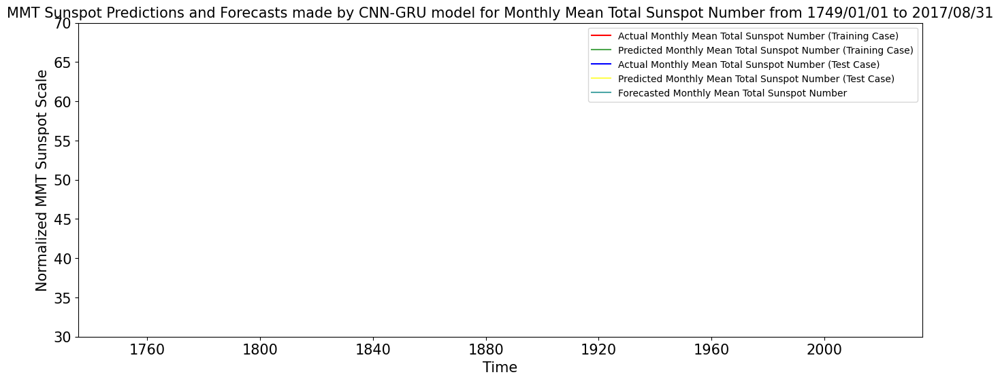

In [ ]:
plot_with_forecast(results_CNN_GRU_train, results_CNN_GRU_test,
                   forecast_result_cnn_gru, 'CNN-GRU', title_name)

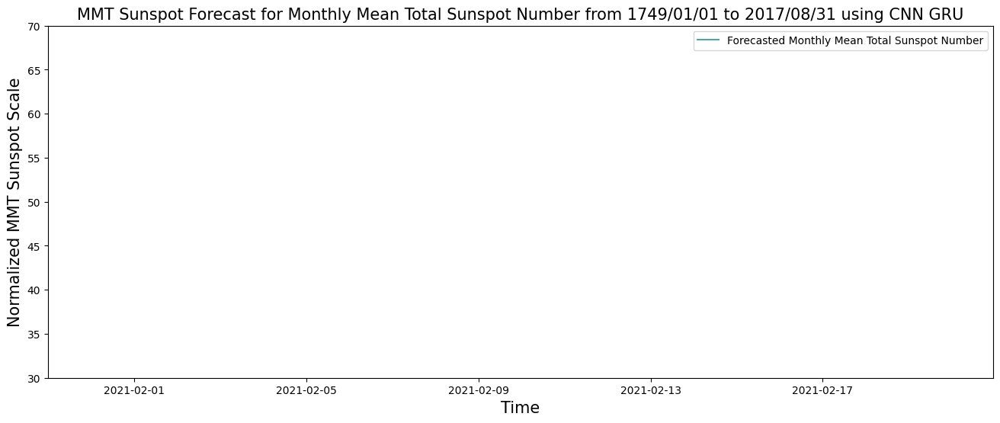

In [ ]:
plot_forecast(forecast_result_cnn_gru, 'CNN GRU', title_name)

# Creating a pickle file for all classifier models.

## Mount model_pkl folder.

In [ ]:
#os.chdir('/content/drive/My Drive/VT/Research/ap_datasets/model_pkl')

## Send model to pkl file.

In [ ]:
#filename_lstm = 'TSC_sunset-prediction-lstm-model.pkl'
#pickle.dump(lstm_model, open(filename_lstm, 'wb'))